# Modeling Zip Codes Notebook
This notebook contains all of the code and logic related to modeling the data of individual zip codes for this project. A method using rpy2 to call auto.arima generates orders and coefficients quickly, so that each zip code in the database can be modeled individually for comparison of the results. At first, the time window is limited to after the crash, but this turns out to be an inferior method because knowing how individual zip codes weathered the crash is valuable information. Thus, it is decided that zip codes which do not have complete data do not lend themselves to being good investment recommendations, as there is no way to know how they handle varying market conditions. By modeling only zip codes with full data, the models are able to take into account the period of volatility during the crash, and the resulting sigma2 and confidence intervals of the forecasts of these models reflect how well a zip code handled the crash. Models are generated for each zip code with complete data and with most recent average sales prices less than $500k, to avoid considering investment in luxury homes, which is not as ideal because they cannot be leased for a profit as easily. The lower confidence levels of forecasts of each model are compared to find the zip codes which have the lowest chance of losses over the next 5 years.

#### Outline:
[Modling Selected Zip Codes](#modeling_zips)<br>

In [1]:
# Importing the necessary libraries
from IPython.display import display
import itertools
import matplotlib.pyplot as plt
from functions import my_functions as mf
import numpy as np
from operator import itemgetter
import pandas as pd
from scipy import stats
from scipy.signal import periodogram
import seaborn as sns
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import statsmodels.stats.stattools as st
from statsmodels.tsa.filters.hp_filter import hpfilter
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [2]:
from warnings import filterwarnings
filterwarnings('ignore')

In [3]:
from functions import tsa

In [4]:
# Allows you to import r packages
from rpy2.robjects.packages import importr

In [5]:
# Import desired package(s)
importr('forecast')

rpy2.robjects.packages.Package as a <module 'forecast'>

In [6]:
# Will convert python lists to a R style FloatVector
from rpy2.robjects import FloatVector
# Allows R function to be called as dictionary keys
from rpy2.robjects import r

In [7]:
#import dataframe_image as di

In [8]:
%load_ext autoreload
%autoreload 1
%aimport functions.my_functions
%aimport functions.tsa

In [9]:
# Plot styling
plt.style.use('ggplot')
from jupyterthemes import jtplot
jtplot.style()

In [10]:
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 11, 7

In [11]:
pd.plotting.register_matplotlib_converters()

## Loading DataFrame and Initial Feature Inspection

In [12]:
# Getting a look at the raw data
df = pd.read_csv('data/zillow_data.csv')
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


<a id='data_preparation'></a>
# Data Preparation:

In [13]:
df.rename(columns={'RegionName':'zipcode'}, inplace=True)
# Dropping the SizeRank column, as well as the RegionID
df.drop(columns=['RegionID', 'SizeRank'], inplace=True)

In [14]:
# Melting dataframe to convert into Long Format
df = pd.melt(df, id_vars=['zipcode', 'City', 'State', 'Metro', 'CountyName'], var_name='date')
df.head()

,zipcode,City,State,Metro,CountyName,date,value
0,60657,Chicago,IL,Chicago,Cook,1996-04,334200.0
1,75070,McKinney,TX,Dallas-Fort Worth,Collin,1996-04,235700.0
2,77494,Katy,TX,Houston,Harris,1996-04,210400.0
3,60614,Chicago,IL,Chicago,Cook,1996-04,498100.0
4,79936,El Paso,TX,El Paso,El Paso,1996-04,77300.0


In [15]:
# Converting 'date' column to datetime format
df.date = pd.to_datetime(df.date, format='%Y-%m')
df.date.head()

0   1996-04-01
1   1996-04-01
2   1996-04-01
3   1996-04-01
4   1996-04-01
Name: date, dtype: datetime64[ns]

In [16]:
# checking 'value' column for missing data:
df.value.isna().sum()

156891

In [17]:
# There are many missing values, but I will leave them in place for now

# Grouping the data by zipcode
groups = df.groupby('zipcode')
len(groups)

14723

1001
1002
1005
1007
1008
1010


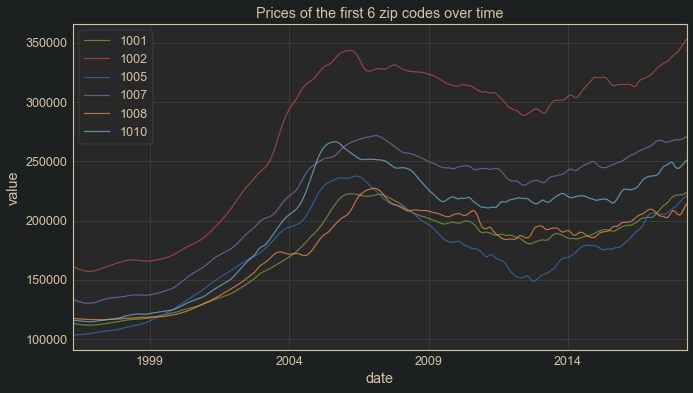

In [18]:
# A quick look at the first 6 zipcodes:
for i, (name, group) in enumerate(groups):
    print(name)
    group.set_index('date').value.plot(figsize=(11,6), alpha=0.7, label=name)
    if i >= 5:
        break
        
plt.ylabel('value')
plt.title('Prices of the first 6 zip codes over time')
plt.legend();

<a id='modeling'></a>
# Modeling:

<a id='modeling_zips'></a>
## Modeling zip codes
So far we have honed our modeling abilities and toolbox using the full market data. Now, it is time to move on to looking at the select zip codes from our statistical analysis in the introductory notebook.

In [19]:
# First let's load in the dataframe of our top 5 zip codes
top_five_zips = pd.read_csv('data/top_five_zips.csv')
top_five_zips

,zipcode,City,State,Metro,CountyName,avg_return,national_avg_return,P2R,national_p2r_avg
0,19125,Philadelphia,PA,Philadelphia,Philadelphia,0.011195,0.004491,11.20,11.44
1,68526,Lincoln,NE,Lincoln,Lancaster,0.004528,0.004491,10.45,11.44
2,15201,Pittsburgh,PA,Pittsburgh,Allegheny,0.016459,0.004491,10.46,11.44
3,73103,Oklahoma City,OK,Oklahoma City,Oklahoma,0.010975,0.004491,10.57,11.44
4,33974,Lehigh Acres,FL,Fort Myers,Lee,0.010976,0.004491,10.80,11.44


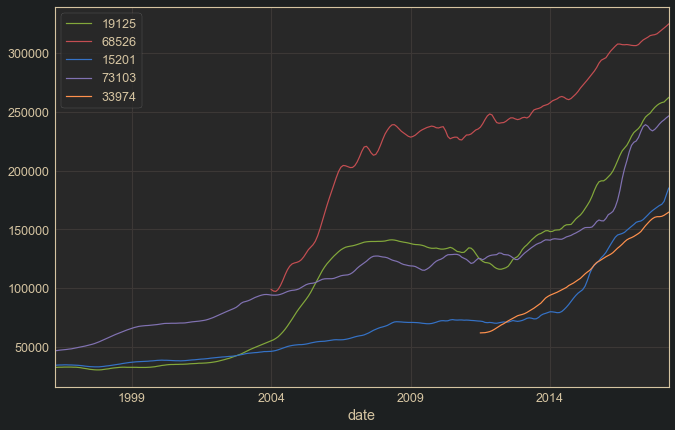

In [20]:
for zipcode in top_five_zips.zipcode:
    grp = groups.get_group(zipcode)
    grp.set_index('date').value.plot(label=zipcode)
plt.legend()
plt.show()

In [21]:
philly = groups.get_group(top_five_zips.zipcode[0]).set_index('date').value.dropna()
log_philly = np.log(philly)
log_philly

date
1996-04-01    10.392068
1996-05-01    10.395130
1996-06-01    10.398184
1996-07-01    10.398184
1996-08-01    10.401228
                ...    
2017-12-01    12.457220
2018-01-01    12.460715
2018-02-01    12.462651
2018-03-01    12.470358
2018-04-01    12.477244
Name: value, Length: 265, dtype: float64

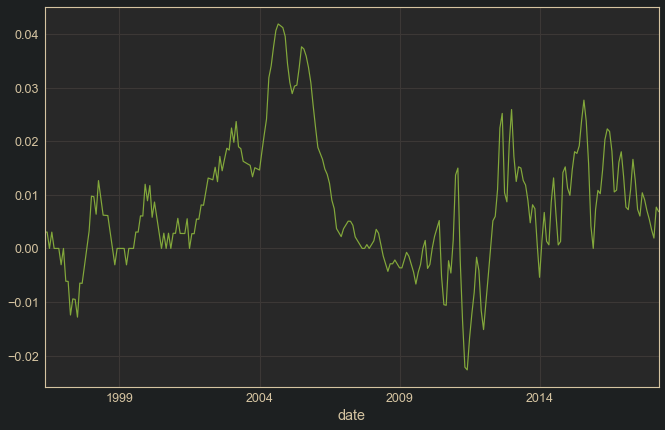

In [22]:
philly_returns = log_philly.diff().dropna()
philly_returns.plot();

In [22]:
# We can see that the behavor of returns changes over time, with much more volatility
# present after 2009, and continuing to the end of the time window.

In [23]:
autoarima = r['auto.arima'](r['ts'](FloatVector(philly_returns), freq=12))
print(autoarima)

Series: structure(c(0.00306278953054573, 0.00305343748689069, 0, 0.00304414238122774,  0, 0, 0, -0.00304414238122774, 0, -0.00611622701743642, -0.0061538655743778,  -0.012422519998557, -0.00941922191649169, -0.00950878796902721,  -0.0128206884290609, -0.00647251450561726, -0.00651468102119424,  -0.00327332534496882, 0, 0.00327332534496882, 0.00975617494536429,  0.00966191091173663, 0.00638979809877149, 0.0126583968719238,  0.00938974034983886, 0.00621120009263976, 0.00617285910708176,  0.00613498856751526, 0.00305343748689069, 0, -0.00305343748689069,  0, 0, 0, 0, -0.00306278953054573, 0, 0, 0, 0.00306278953054573,  0.00305343748689069, 0.00607904607638154, 0.00604231445596248,  0.0119761910467169, 0.00888894741724577, 0.0117303397854904,  0.00581396986541982, 0.00865806274311431, 0.00573067470898359,  0.00285306898240734, 0, 0.00284495213223046, 0, 0.00283688133520066,  0, 0.00282885620047679, 0.00282087634164263, 0.00561799230422189,  0.00279720462106248, 0.00278940208757739, 0.00278

In [24]:
# Previously, when modeling the entire housing market, I had been taking the order numbers
# recommended by the auto.arima function, then feeding them into the SARIMAX functionality
# of statsmodels. What did not occur to me is that statsmodels may estimate the coefficients
# differently for a model of the same orders, and that the performance may be different
# due to this. I will now compare the difference between models using the coefficient
# estimates fit using statsmodels, and the models which use the coefficients given by
# auto.arima. It will take a bit of massaging the output from the auto.arima call from 
# rpy2, but we can get these values where they need to go. To see the mechanics, see the
# functions in the tsa.py file in this repository.

In [25]:
# Need to add a constant for the non-zero mean to the model
constant = pd.Series(np.ones(len(philly_returns)))
#drift.name = 'drift'
constant.index = philly_returns.index
model = SARIMAX(philly_returns,
                order=(3,0,2),
                seasonal_order=(1,0,0,12),
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog = constant
                #trend='c'
               )
#res = model.smooth(prms)
res = model.fit()
print(res.summary())

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


                                      SARIMAX Results                                      
Dep. Variable:                               value   No. Observations:                  264
Model:             SARIMAX(3, 0, 2)x(1, 0, [], 12)   Log Likelihood                1039.799
Date:                             Sun, 13 Sep 2020   AIC                          -2063.597
Time:                                     11:18:47   BIC                          -2035.458
Sample:                                 05-01-1996   HQIC                         -2052.271
                                      - 04-01-2018                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
0              0.0100      0.004      2.268      0.023       0.001       0.019
ar.L1          1.0259      

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [27]:
pred = res.get_prediction()
mse = np.mean(((pred.predicted_mean - philly_returns)**2))

In [28]:
mse

1.4626475914950078e-05

Note that the coefficients, log likelihood, and AIC are different for the statsmodels fit than the auto.arima response. Let's try feeding in the coefficients from the auto.arima function and see what happens.

In [29]:
# Notes about autoarima output
# autoarima[1] is sigma^2

In [30]:
print(autoarima[0])

         ar1          ar2          ar3          ma1          ma2         sar1 

 0.373285880 -0.050512406  0.534182509  0.883665525  0.749263266 -0.151453619 

   intercept 

 0.007582461 



In [31]:
type(autoarima[0])

rpy2.robjects.vectors.FloatVector

In [32]:
# We can get the names of the coefficients with the names element
thing = autoarima[0]
list(thing.names)

['ar1', 'ar2', 'ar3', 'ma1', 'ma2', 'sar1', 'intercept']

In [33]:
# Forcing this into a list gives us the corresponding coefficients
list(thing)

[0.3732858795415016,
 -0.05051240621314265,
 0.5341825089765536,
 0.8836655249165878,
 0.7492632661636307,
 -0.15145361853218312,
 0.007582460717667173]

In [34]:
print(autoarima[1])

[1] 1.357323e-05



In [35]:
order, sorder = tsa.get_orders(autoarima)
prms = tsa.get_coeffs(autoarima)

In [36]:
prms

intercept    0.007582
ar1          0.373286
ar2         -0.050512
ar3          0.534183
ma1          0.883666
ma2          0.749263
sar1        -0.151454
sigma2       0.000014
dtype: float64

In [38]:
constant = pd.Series(np.ones(len(philly_returns)))
constant.name = list(autoarima[0].names)[-1]
constant.index = philly_returns.index
model = SARIMAX(philly_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog = constant
                #trend='c'
               )
res = model.smooth(prms)
#res = model.fit()
print(res.summary())

                                      SARIMAX Results                                      
Dep. Variable:                               value   No. Observations:                  264
Model:             SARIMAX(3, 0, 2)x(1, 0, [], 12)   Log Likelihood                1045.631
Date:                             Sun, 13 Sep 2020   AIC                          -2075.261
Time:                                     11:19:30   BIC                          -2047.122
Sample:                                 05-01-1996   HQIC                         -2063.935
                                      - 04-01-2018                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0076      0.004      1.966      0.049    2.45e-05       0.015
ar.L1          0.3733      

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [39]:
# We can see that using the coefficients from the auto.arima response has improved the log
# likelihood and AIC of the model. Further, the null hypothesis of non autocorrelated residuals
# is now not being rejected, which is an improvement. A slight amount of leptokurtocity is
# still rejecting the JB null hypothesis of normally distributed residuals, but the skew is
# looking good.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


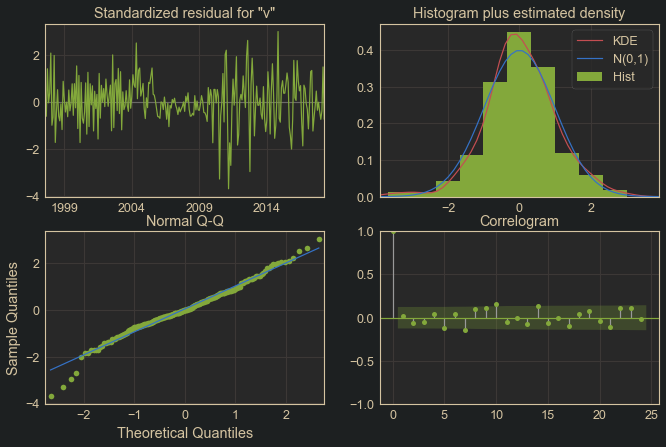

In [40]:
res.plot_diagnostics();

In [42]:
pred = res.get_prediction()
mse = ((pred.predicted_mean - philly_returns)**2).mean()
mse

1.3794501641402361e-05

In [43]:
# The MSE has improved by using the coefficients given by the auto.arima function

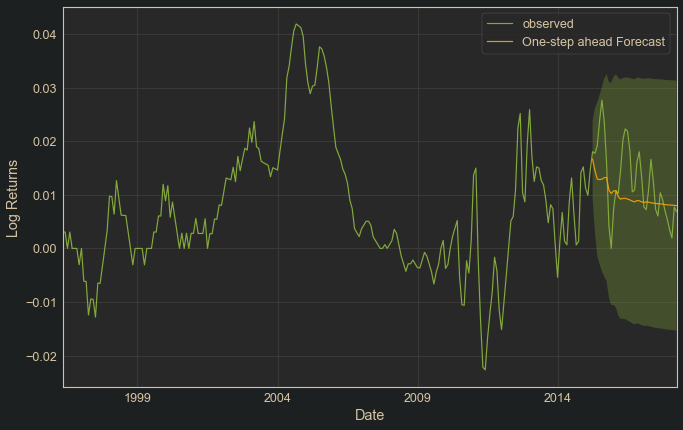

In [45]:
# Get predictions
pred = res.get_prediction(dynamic='2015-04-01')
pred_conf = pred.conf_int().loc['2015-04':]
# Plot observed values
ax = philly_returns.plot(label='observed')
# Plot predicted values
pred.predicted_mean.loc['2015-04':].plot(ax=ax, label='One-step ahead Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.3
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

In [46]:
periods_ahead = 60
constant = pd.Series(np.ones(periods_ahead))
constant.name = list(autoarima[0].names)[-1]

In [47]:
# Let's look at a 5 year forecast with this model
prediction = res.get_forecast(periods_ahead, exog=constant)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

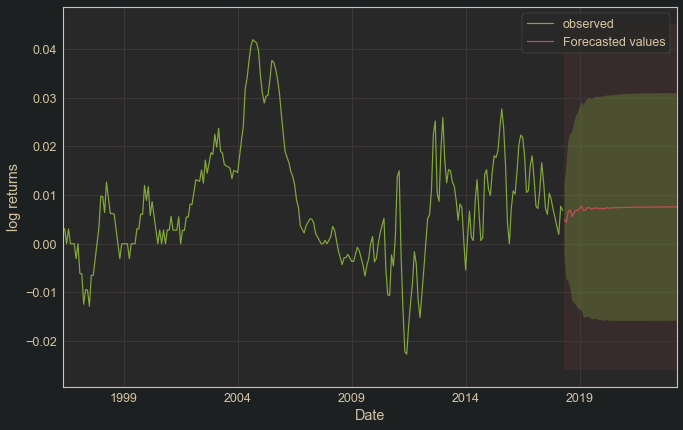

In [48]:
# Plot future predictions with confidence intervals
ax = philly_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

Philly has a strong predicted mean of returns, but the lower confidence interval stretches over the zero line, meaning that it could generate losses over the next 5 years. Perhaps less volatile zip codes would be better choices.

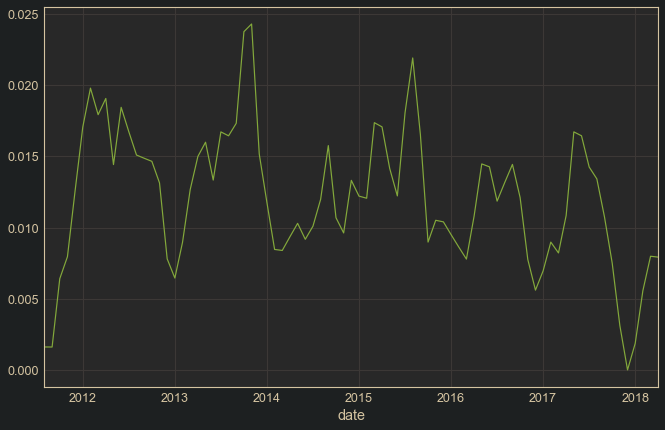

In [49]:
# Let's look now at Lehigh Acres, FL
lehigh = groups.get_group(top_five_zips.zipcode[4]).set_index('date').value.dropna()
lehigh = np.log(lehigh)
lehigh_returns = lehigh.diff().dropna()
lehigh_returns.plot()

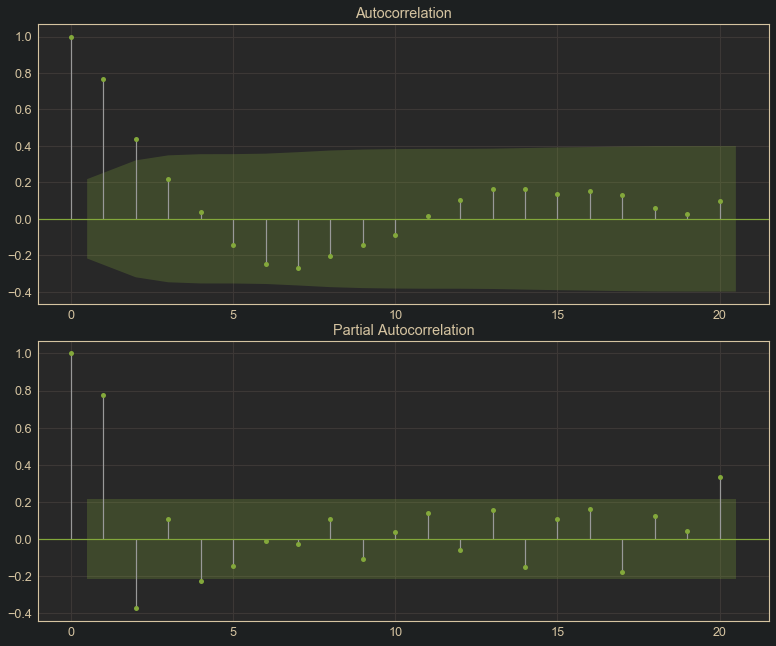

In [50]:
tsa.check_autocorrelation(lehigh_returns)

In [51]:
autoarima = r['auto.arima'](r['ts'](FloatVector(lehigh_returns), freq=12))
print(autoarima)

Series: structure(c(0.00161160389434123, 0.00160901080569964, 0.00641027836091901,  0.0079554914411144, 0.0125985918363227, 0.0170679085121481, 0.0198026272961798,  0.0179377006866677, 0.0190761470608134, 0.0144302648290289, 0.0184533270408682,  0.0167367923555233, 0.0150998064557513, 0.0148751897650445, 0.0146571577999737,  0.0131407935610568, 0.00780238028418623, 0.00645580034287008,  0.00896866998276025, 0.0126744408967294, 0.0150002812594909,  0.0160003413464427, 0.0133416169375735, 0.0167267938053133, 0.0164516048920049,  0.0173314563516396, 0.0237702193339135, 0.0243105895006153, 0.0151682214731714,  0.011758553438078, 0.00846565902454799, 0.00839459284302713,  0.00936044275956327, 0.0102987522005744, 0.00917905475899694,  0.0101010959865029, 0.0119881555599708, 0.0157638732330625, 0.0106952891167484,  0.00962471337421, 0.0133208439756611, 0.012212458029504, 0.0120651115518431,  0.0173758372539101, 0.0170790668291385, 0.0141595286036349, 0.0122272265695607,  0.0180650073976398, 0

In [52]:
# Using the functions from the tsa.py file to generate the needed components.
order, sorder, params, const = tsa.model_from_autoarima(lehigh_returns, freq=12)

model = SARIMAX(lehigh_returns, 
                order=order, 
                seasonal_order=sorder, 
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const)
res = model.fit()
res2 = model.smooth(params)
print(res.summary())

(2, 0, 2)(0, 0, 0, 0) model with intercept


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


                               SARIMAX Results                                
Dep. Variable:                  value   No. Observations:                   81
Model:               SARIMAX(2, 0, 2)   Log Likelihood                 348.905
Date:                Sun, 13 Sep 2020   AIC                           -685.809
Time:                        11:20:22   BIC                           -671.669
Sample:                    08-01-2011   HQIC                          -680.149
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0119      0.004      2.863      0.004       0.004       0.020
ar.L1          1.5327      0.272      5.627      0.000       0.999       2.067
ar.L2         -0.5627      0.239     -2.355      0.0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [53]:
print(res2.summary())

                               SARIMAX Results                                
Dep. Variable:                  value   No. Observations:                   81
Model:               SARIMAX(2, 0, 2)   Log Likelihood                 351.987
Date:                Sun, 13 Sep 2020   AIC                           -691.974
Time:                        11:20:24   BIC                           -677.834
Sample:                    08-01-2011   HQIC                          -686.313
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0117      0.001      7.931      0.000       0.009       0.015
ar.L1         -0.2590      0.166     -1.562      0.118      -0.584       0.066
ar.L2          0.4874      0.157      3.102      0.0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [54]:
# Again, we see that the coefficients generated from the auto.arima function create a superior
# fit to the data than those generated by statsmodels, with a better log likelihood and AIC score,
# as well as better significance.

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


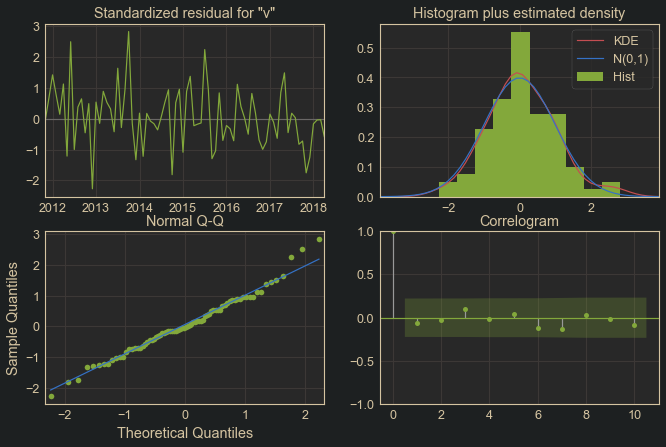

In [55]:
res2.plot_diagnostics();

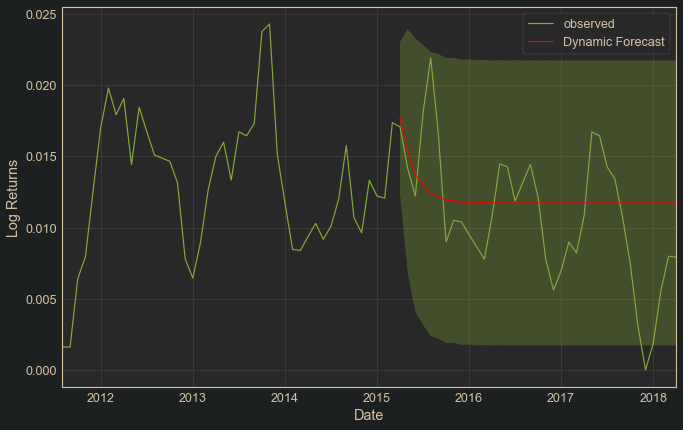

In [56]:
# Get predictions
pred = res2.get_prediction(dynamic='2015-04-01')
pred_conf = pred.conf_int().loc['2015-04':]
# Plot observed values
ax = lehigh_returns.plot(label='observed')
# Plot predicted values
pred.predicted_mean.loc['2015-04':].plot(ax=ax, label='Dynamic Forecast', color='red', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.3
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

In [57]:
periods_ahead = 60
constant = pd.Series(np.ones(periods_ahead))

In [58]:
# Let's look at a 5 year forecast with this model
prediction = res2.get_forecast(periods_ahead, exog=constant)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

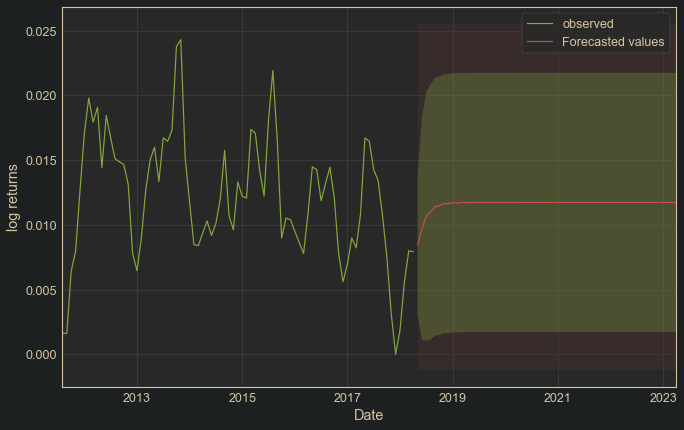

In [59]:
# Plot future predictions with confidence intervals
ax = lehigh_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [60]:
# We can see that the model has an optimistic outlook for Lehigh Acres, showing a predicted
# mean of returns over 1%, and with the 95% confidence bands encompassing only positive returns.
# The Philadelphia forecasts were not quite so optimistic, but there was more data for philly.
# Let's see what would happen if we limited the philly data over the same time window as the
# Lehigh Acres data.
lehigh_returns.index[0]

Timestamp('2011-08-01 00:00:00')

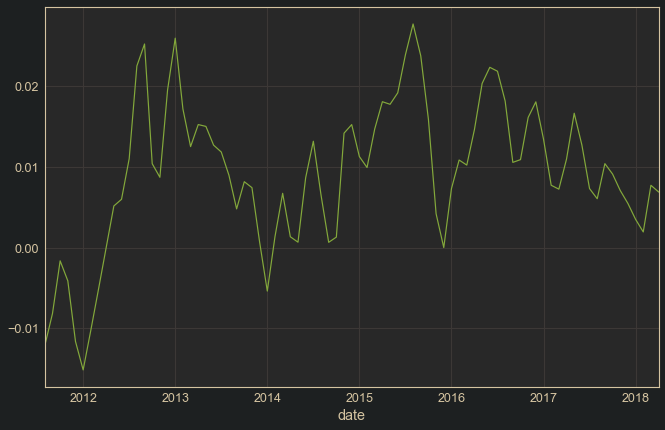

In [61]:
philly_returns_trim = philly_returns[lehigh_returns.index[0]:]
philly_returns_trim.plot();

In [62]:
# We can see how this might lead to a more optimistic forecast already, since the crash has
# been left out of the data. Let's fit a model
order, sorder, coeffs, const = tsa.model_from_autoarima(philly_returns_trim, freq=12)
model = SARIMAX(philly_returns_trim, 
                order=order, 
                seasonal_order=sorder, 
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const)
res = model.fit()
res2 = model.smooth(coeffs)
print(res.summary())

(3, 1, 2)(1, 0, 0, 12) model with no constant


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


                                      SARIMAX Results                                      
Dep. Variable:                               value   No. Observations:                   81
Model:             SARIMAX(3, 1, 2)x(1, 0, [], 12)   Log Likelihood                 279.737
Date:                             Sun, 13 Sep 2020   AIC                           -545.475
Time:                                     11:20:46   BIC                           -530.254
Sample:                                 08-01-2011   HQIC                          -539.469
                                      - 04-01-2018                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2872      0.637     -0.451      0.652      -1.536       0.962
ar.L2         -0.5621      

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


In [63]:
print(res2.summary())

                                      SARIMAX Results                                      
Dep. Variable:                               value   No. Observations:                   81
Model:             SARIMAX(3, 1, 2)x(1, 0, [], 12)   Log Likelihood                 280.011
Date:                             Sun, 13 Sep 2020   AIC                           -546.022
Time:                                     11:20:46   BIC                           -530.801
Sample:                                 08-01-2011   HQIC                          -540.017
                                      - 04-01-2018                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6881      0.152     -4.530      0.000      -0.986      -0.390
ar.L2         -0.5584      

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


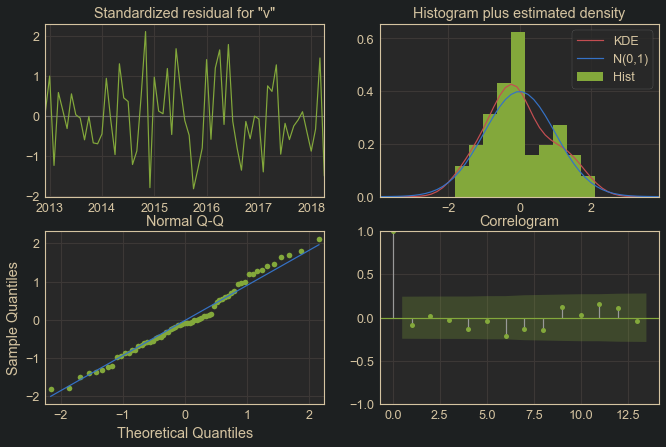

In [64]:
# Once again, using the coefficients generated from the auto.arima function has produced a much
# better model.
res2.plot_diagnostics();

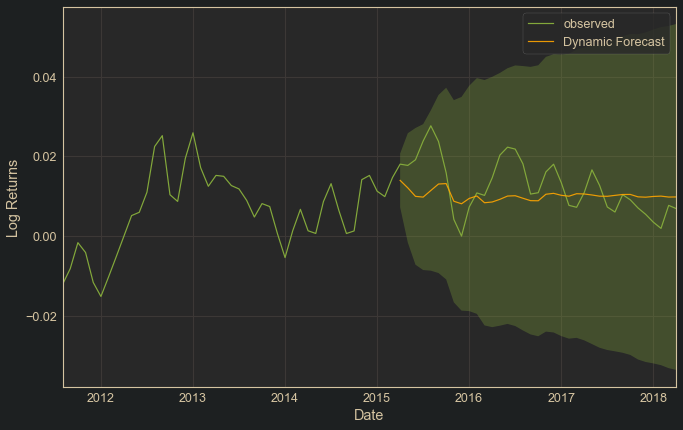

In [65]:
# Get predictions
pred = res2.get_prediction(dynamic='2015-04-01')
pred_conf = pred.conf_int().loc['2015-04':]
# Plot observed values
ax = philly_returns_trim.plot(label='observed')
# Plot predicted values
pred.predicted_mean.loc['2015-04':].plot(ax=ax, label='Dynamic Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.3
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

In [66]:
periods_ahead = 60
constant = pd.Series(np.ones(periods_ahead))

In [67]:
# Let's look at a 5 year forecast with this model
prediction = res2.get_forecast(periods_ahead, exog=constant)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

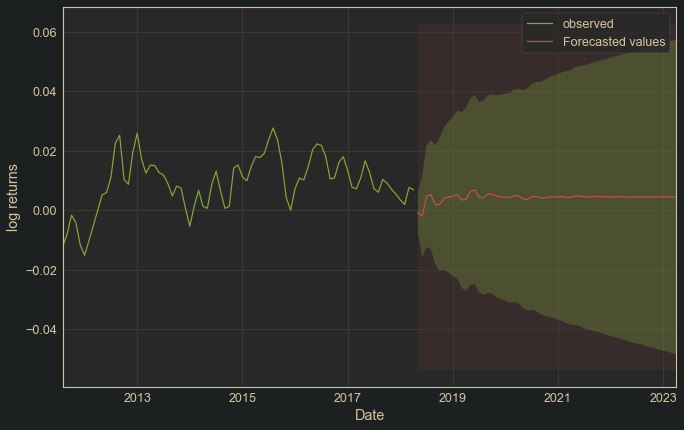

In [68]:
# Plot future predictions with confidence intervals
ax = philly_returns_trim.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [69]:
# We can see that limiting the time window did not help the uncertainty for the future of 
# philly's returns. It actually widened the confidence bands, which now go much lower in the
# next 5 years.
# It appears that the volatility in the returns stream for philly is
# generating a model that makes clear the hightened risk associated with more volatile assets.
# It may be necessary to find another zip code that is less volatile, and safer for investors.

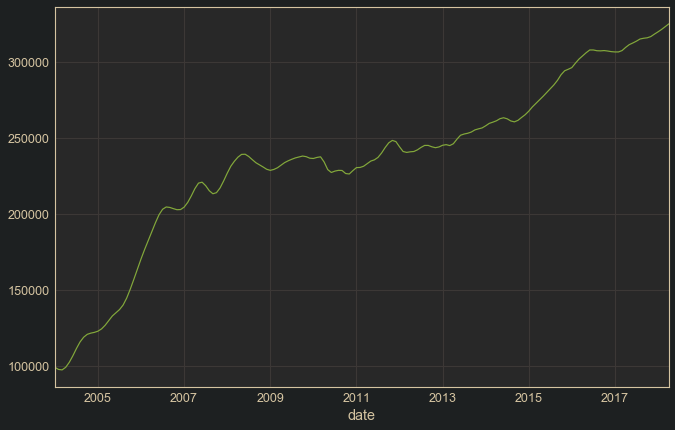

In [70]:
lincoln = groups.get_group(top_five_zips.zipcode[1]).set_index('date').value.dropna()
lincoln.plot();

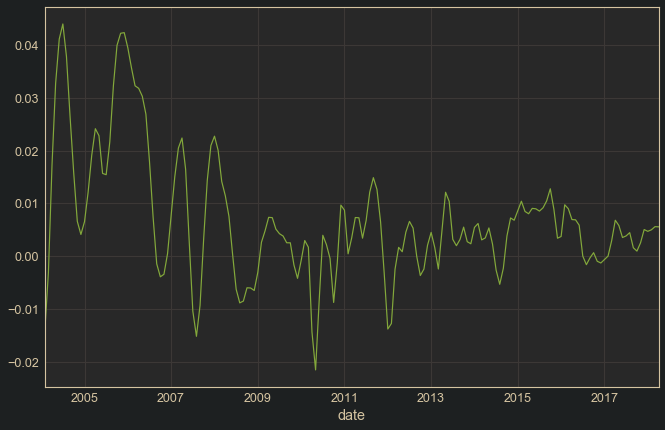

In [71]:
lincoln_returns = np.log(lincoln).diff().dropna()
lincoln_returns.plot();

In [72]:
order, sorder, coeffs, const = tsa.model_from_autoarima(lincoln_returns, freq=12)
model = SARIMAX(lincoln_returns, 
                order=order, 
                seasonal_order=sorder, 
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const)
res = model.fit()
res2 = model.smooth(coeffs)
print(res.summary())
print(res2.summary())

(2, 1, 4)(1, 0, 0, 12) model with no constant


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)


                                      SARIMAX Results                                      
Dep. Variable:                               value   No. Observations:                  171
Model:             SARIMAX(2, 1, 4)x(1, 0, [], 12)   Log Likelihood                 667.716
Date:                             Sun, 13 Sep 2020   AIC                          -1319.432
Time:                                     11:21:03   BIC                          -1295.034
Sample:                                 02-01-2004   HQIC                         -1309.523
                                      - 04-01-2018                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7433      0.690      1.077      0.281      -0.609       2.096
ar.L2         -0.2550      

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


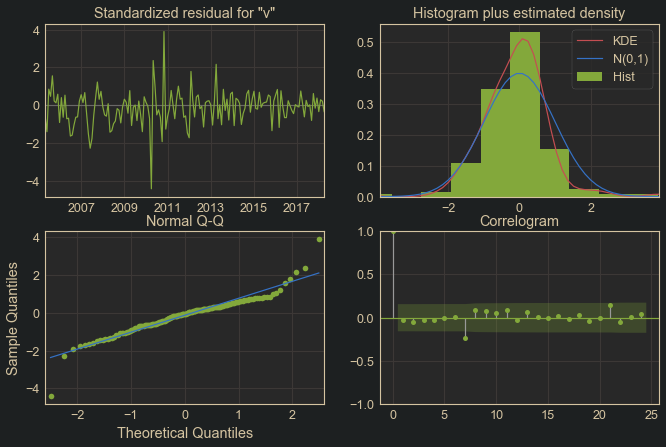

In [73]:
res2.plot_diagnostics();

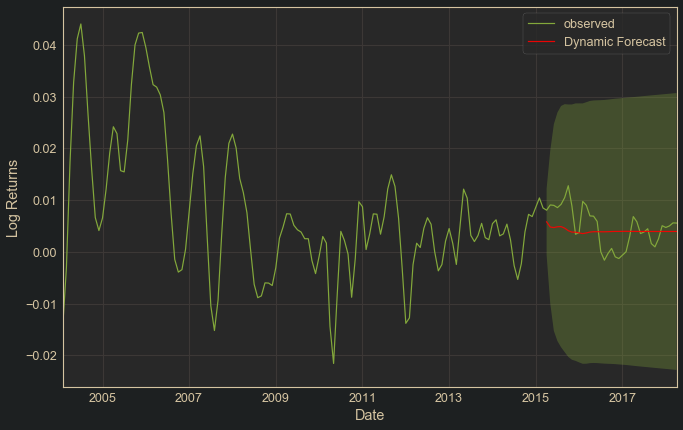

In [74]:
# Get predictions
pred = res2.get_prediction(dynamic='2015-04-01')
pred_conf = pred.conf_int().loc['2015-04':]
# Plot observed values
ax = lincoln_returns.plot(label='observed')
# Plot predicted values
pred.predicted_mean.loc['2015-04':].plot(ax=ax, label='Dynamic Forecast', color='red', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.3
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

In [75]:
periods_ahead = 60
constant = pd.Series(np.ones(periods_ahead))

In [76]:
# Let's look at a 5 year forecast with this model
prediction = res2.get_forecast(periods_ahead, exog=constant)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

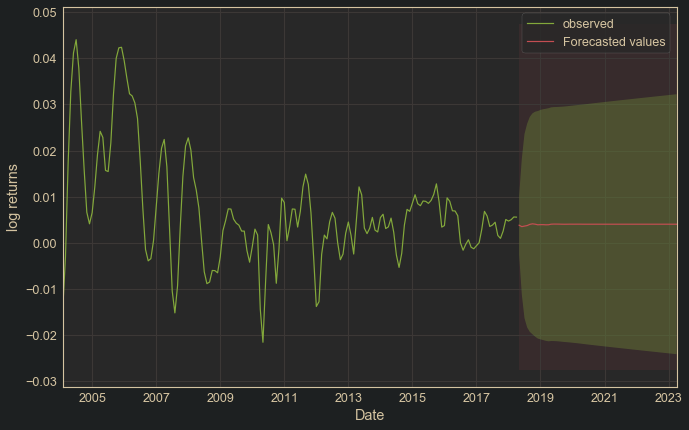

In [77]:
# Plot future predictions with confidence intervals
ax = lincoln_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [78]:
# Again, it appears as though Lincoln may be too volatile to be a safe investment.

In [79]:
top_five_zips

,zipcode,City,State,Metro,CountyName,avg_return,national_avg_return,P2R,national_p2r_avg
0,19125,Philadelphia,PA,Philadelphia,Philadelphia,0.011195,0.004491,11.20,11.44
1,68526,Lincoln,NE,Lincoln,Lancaster,0.004528,0.004491,10.45,11.44
2,15201,Pittsburgh,PA,Pittsburgh,Allegheny,0.016459,0.004491,10.46,11.44
3,73103,Oklahoma City,OK,Oklahoma City,Oklahoma,0.010975,0.004491,10.57,11.44
4,33974,Lehigh Acres,FL,Fort Myers,Lee,0.010976,0.004491,10.80,11.44


In [80]:
pittsburgh = groups.get_group(top_five_zips.zipcode[2]).set_index('date').value.dropna()
pittsburgh_returns = np.log(pittsburgh).diff().dropna()

order, sorder, coeffs, const = tsa.model_from_autoarima(pittsburgh_returns, freq=12)
model = SARIMAX(pittsburgh_returns, 
                order=order, 
                seasonal_order=sorder, 
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const)
res = model.smooth(coeffs)
print(res.summary())

(2, 1, 1)(0, 0, 2, 12) model with no constant
                                        SARIMAX Results                                        
Dep. Variable:                                   value   No. Observations:                  264
Model:             SARIMAX(2, 1, 1)x(0, 0, [1, 2], 12)   Log Likelihood                1000.521
Date:                                 Sun, 13 Sep 2020   AIC                          -1989.042
Time:                                         11:21:10   BIC                          -1968.233
Sample:                                     05-01-1996   HQIC                         -1980.654
                                          - 04-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9697      0

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


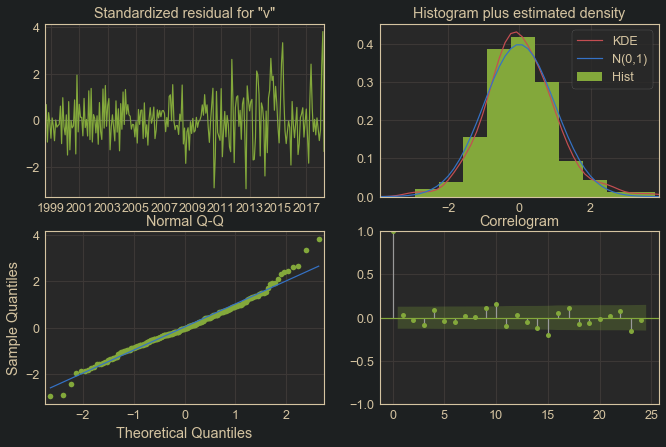

In [81]:
res.plot_diagnostics();

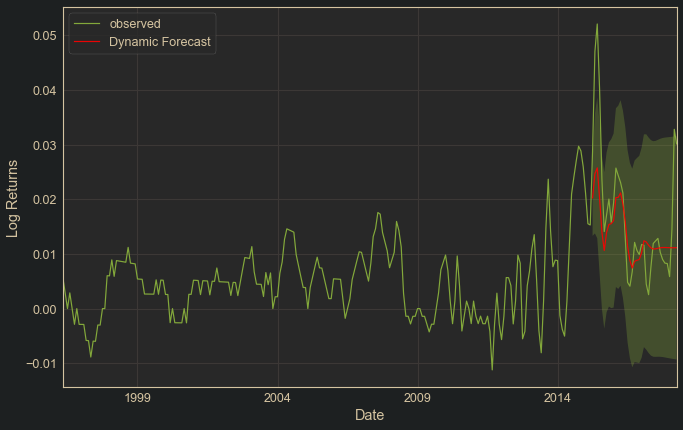

In [82]:
# Get predictions
pred = res.get_prediction(dynamic='2015-04-01')
pred_conf = pred.conf_int().loc['2015-04':]
# Plot observed values
ax = pittsburgh_returns.plot(label='observed')
# Plot predicted values
pred.predicted_mean.loc['2015-04':].plot(ax=ax, label='Dynamic Forecast', color='red', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.3
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

In [83]:
periods_ahead = 60
constant = pd.Series(np.ones(periods_ahead))

In [84]:
# Let's look at a 5 year forecast with this model
prediction = res.get_forecast(periods_ahead, exog=constant)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

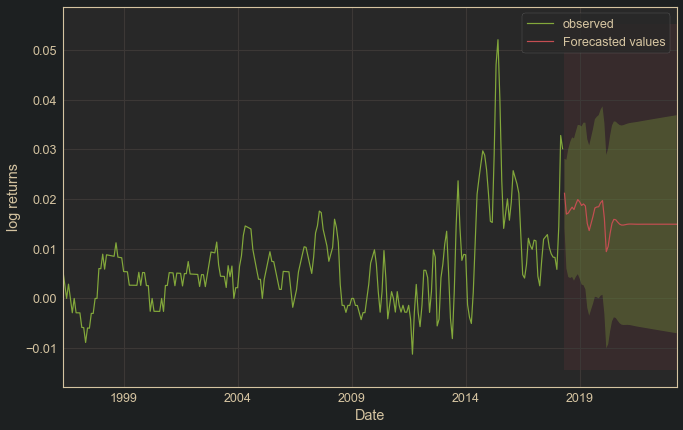

In [85]:
# Plot future predictions with confidence intervals
ax = pittsburgh_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [86]:
# The mean of forecasted returns is nice and high for pittsburgh, but the volatility makes the
# confidence intervals go over the zero line, meaning money could be lost by investing in this
# zip code. It may be dawning on me that the analysis used to find the best 5 zip codes that
# I did in the other notebook is not the best way to find the best zip codes to invest in
# Now that I have a smooth functionality to quickly model time series with the auto.arima
# function, I might try and model all zip codes and then filter for the ones with the best
# forecasted means and the lowest volatility of the models.

In [87]:
prediction.predicted_mean.mean()

0.015879702738560333

In [88]:
coeffs.loc['sigma2']

1.2521758193606227e-05

In [89]:
# I will use a starting date which is after the crash in order to avoid making comparisons
# between zip codes using different time frames. Earlier, we saw that April 2013 made a good
# starting point for the whole market, I'll start using this
start_date = '2013-04-01'
results = pd.DataFrame(columns=['sigma2', 'predicted_mean', 'lower_conf_mean'])
results

,sigma2,predicted_mean,lower_conf_mean


In [1118]:
# I think that 5 years is a good investment horizon to consider for real estate, since it 
# is long enough to rent the property, but short enough to not be trying to look too far into
# the future using our models. We will predict ahead 60 months.
periods_ahead = 60

In [1119]:
results2 = results.copy()
results2.loc[1, ['sigma2', 'predicted_mean', 'lower_conf_mean']] = np.NaN

In [1120]:
results2.loc[1]

sigma2             NaN
predicted_mean     NaN
lower_conf_mean    NaN
Name: 1, dtype: object

In [883]:
for name, group in groups:
    # Weed out already completed zips
    if name in results.index:
        continue
    
    value = group.set_index('date').loc[start_date:].value.dropna()
    
    # Weed out over expensive zip codes
    if value[-1] > 500000:
        continue
        
    returns = np.log(value).diff().dropna().asfreq('MS')
    
    try:
        order, sorder, coeffs, const = tsa.model_from_autoarima(returns, freq=12)
        model = SARIMAX(returns, order=order, seasonal_order=sorder, exog=const)
        res = model.smooth(coeffs)

        prediction = res.get_forecast(periods_ahead, exog=constant)
        pred_conf = prediction.conf_int()

        predmean = prediction.predicted_mean.mean()
        low_conf_mean = pred_conf.iloc[:, 0].mean()

        results.loc[name, 'sigma2'] = coeffs.loc['sigma2']
        results.loc[name, 'predicted_mean'] = predmean
        results.loc[name, 'lower_conf_mean'] = low_conf_mean
    except:
        results.loc[name, ['sigma2', 'predicted_mean', 'lower_conf_mean']] = np.NaN

Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in mode

No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No C

No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constan

Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (drift) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Co

Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in mode

No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) i

No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No C

No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in m

Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) i

Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Cons

No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (int

No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant i

Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in mode

Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in mode

Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (

Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept

Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (int

No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (

Constant (intercept) in model
No Constant in model
No Constant in model
Constant (drift) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (drift) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Consta

No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (

Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
N

Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (drift) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (drift) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in 

Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in m

Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept

Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant i

Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in m

Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (drift) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant

No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (

Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (interc

No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Cons

Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constan

No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constan

No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No C

Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constan

Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
C

Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constan

Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept

No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (drift) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (i

No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (drift) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant

No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) i

No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
No Constant in model
Constant (intercept) in model
No Constant in model
No Constant in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in model
Constant (intercept) in m

In [957]:
# Storing the results, since they took so long to generate.
results.to_csv('data/modeling_results.csv')

In [879]:
results.head()

,sigma2,predicted_mean,lower_conf_mean
1001,5.52597e-06,0.0021529,-0.0374847
1002,2.87826e-06,0.00263146,-0.00615394
1005,8.12122e-06,0.00534077,-0.00647338
1007,2.60922e-06,0.00253713,-0.00436197
1008,1.55104e-05,0.000122899,-0.0138978


In [1126]:
results = pd.read_csv('data/modeling_results.csv').rename(columns={'Unnamed: 0':'zipcode'}).set_index('zipcode')

In [1127]:
results.head()

,sigma2,predicted_mean,lower_conf_mean
zipcode,,,
1001,0.000006,0.002153,-0.037485
1002,0.000003,0.002631,-0.006154
1005,0.000008,0.005341,-0.006473
1007,0.000003,0.002537,-0.004362
1008,0.000016,0.000123,-0.013898


In [1146]:
best = results[results.lower_conf_mean > 0].sort_values(by='lower_conf_mean',
                                                        ascending=False
                                                       )
best_lower_conf = best[:100]
best_lower_conf

,sigma2,predicted_mean,lower_conf_mean
zipcode,,,
80002,0.000003,0.011153,0.005931
80204,0.000005,0.014510,0.005679
37129,0.000003,0.009774,0.004969
80229,0.000003,0.010630,0.004844
80017,0.000002,0.011228,0.004707
...,...,...,...
49506,0.000004,0.007789,0.001441
32927,0.000007,0.011408,0.001440
77521,0.000002,0.005553,0.001420


In [1147]:
best = results[results.lower_conf_mean > 0].sort_values(by='predicted_mean',
                                                        ascending=False
                                                       )
best_pred_mean = best[:100]
best_pred_mean

,sigma2,predicted_mean,lower_conf_mean
zipcode,,,
94621,0.000013,0.015648,0.002366
37210,0.000012,0.015510,0.001177
37207,0.000008,0.015001,0.003435
32807,0.000008,0.014975,0.004515
80204,0.000005,0.014510,0.005679
...,...,...,...
32960,0.000009,0.009710,0.000016
97236,0.000004,0.009679,0.001083
97032,0.000005,0.009676,0.001373


In [1148]:
best = results[results.lower_conf_mean > 0].sort_values(by='sigma2',
                                                        ascending=True
                                                       )
best_var = best[:100]
best_var

,sigma2,predicted_mean,lower_conf_mean
zipcode,,,
27539,0.000001,0.004432,0.000491
27523,0.000001,0.005360,0.001383
27560,0.000001,0.004836,0.001126
27513,0.000001,0.004812,0.001401
27526,0.000001,0.004533,0.001180
...,...,...,...
80120,0.000003,0.008564,0.000659
98273,0.000003,0.008659,0.002633
2148,0.000003,0.007612,0.000739


In [1149]:
# We can see that sorting the zip codes by the largest lower confidence means has given 
# a nice balance of high predicted means and low volatility. Since these zip codes have
# the best outlooks even on the lower end of their confidence interval, we should
# investigate these.
# Let's start by looking at the first one
test = groups.get_group(best_lower_conf.index[0]).set_index('date')
test.head()

,zipcode,City,State,Metro,CountyName,value
date,,,,,,
1996-04-01,80002,Arvada,CO,Denver,Jefferson,116000.0
1996-05-01,80002,Arvada,CO,Denver,Jefferson,116300.0
1996-06-01,80002,Arvada,CO,Denver,Jefferson,116700.0
1996-07-01,80002,Arvada,CO,Denver,Jefferson,117000.0
1996-08-01,80002,Arvada,CO,Denver,Jefferson,117400.0


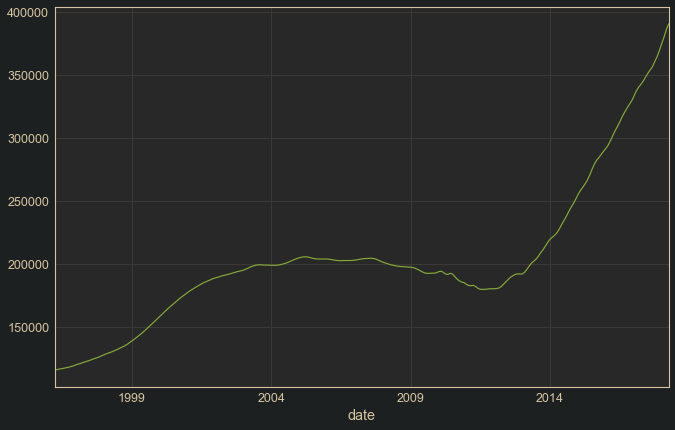

In [1150]:
# We can see that this is a zip code from the Denver metro
test.value.plot()

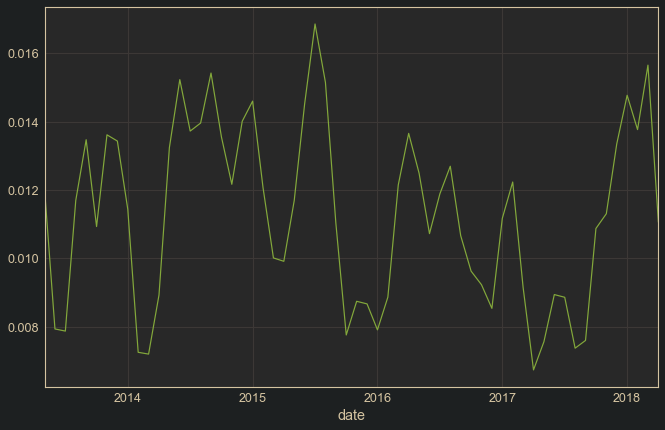

In [1151]:
test_returns = np.log(test.value.loc[start_date:]).diff().dropna()
test_returns.plot();

In [1152]:
autoarima = r['auto.arima'](r['ts'](FloatVector(test_returns), freq=12))
print(autoarima)

Series: structure(c(0.0120241929668019, 0.00793654959573686, 0.00787405643090544,  0.0116960397631907, 0.0134746985833605, 0.010934266295564, 0.0136184307103147,  0.0134354580657376, 0.0114391547071371, 0.00725297830501503,  0.00720075118558228, 0.00892863074430217, 0.0132452267500192,  0.0152342445718485, 0.01372822933069, 0.0139625708144955, 0.0154266140379633,  0.0135609228352891, 0.0121705356202551, 0.0140142433748132, 0.0146045619308399,  0.0120741486311609, 0.0100154920408873, 0.00991617583873428,  0.0116960397631907, 0.0145226905419289, 0.0168625696439921, 0.0151518050206025,  0.0110380326679564, 0.00776018003666401, 0.00874590147126675,  0.00867007338454329, 0.00791061734850729, 0.00886772523157298,  0.0121499975923847, 0.0136600491546126, 0.0124960521137414, 0.0107265777386427,  0.0118915108491304, 0.0126985833371265, 0.0106684413169233, 0.00962889874675099,  0.00923083477553099, 0.00853924066583289, 0.0111733005981254,  0.0122371322595711, 0.00915405772174616, 0.0067379777405

In [1153]:
order, sorder, coeffs, const = tsa.model_from_autoarima(test_returns, freq=12)
model = SARIMAX(test_returns, 
                order=order, 
                seasonal_order=sorder, 
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const)
res = model.smooth(coeffs)
print(res.summary())

(0, 0, 2)(0, 0, 0, 0) model with intercept
                               SARIMAX Results                                
Dep. Variable:                  value   No. Observations:                   60
Model:               SARIMAX(0, 0, 2)   Log Likelihood                 282.480
Date:                Sun, 13 Sep 2020   AIC                           -556.960
Time:                        09:45:10   BIC                           -548.788
Sample:                    05-01-2013   HQIC                          -553.784
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0112      0.001     17.117      0.000       0.010       0.013
ma.L1          1.1088      0.143      7.736      0.000       0.828       1.390
ma.L2    

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


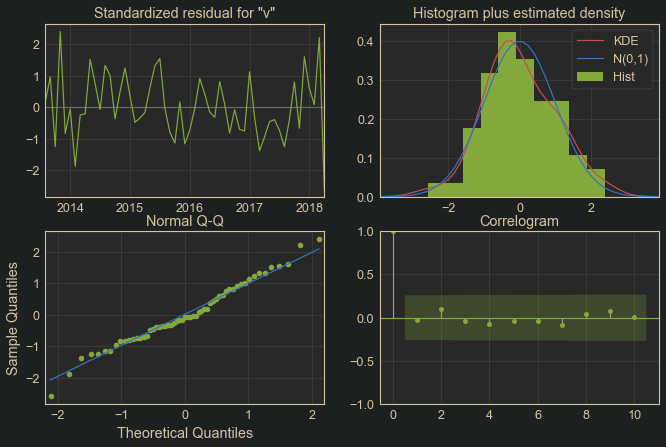

In [1154]:
res.plot_diagnostics();

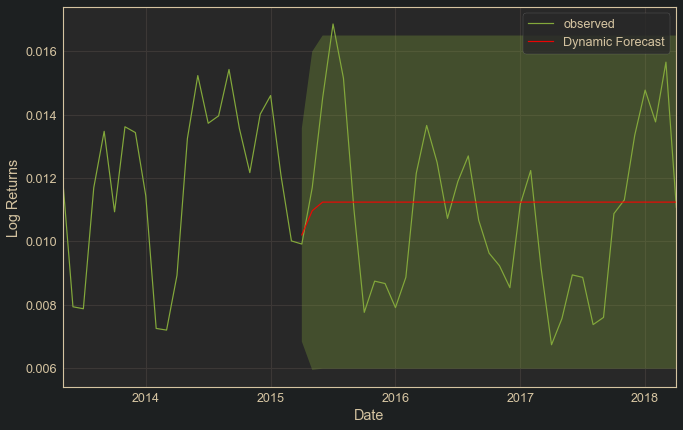

In [1155]:
# Get predictions
pred = res.get_prediction(dynamic='2015-04-01')
pred_conf = pred.conf_int().loc['2015-04':]
# Plot observed values
ax = test_returns.plot(label='observed')
# Plot predicted values
pred.predicted_mean.loc['2015-04':].plot(ax=ax, label='Dynamic Forecast', color='red', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.3
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

In [1156]:
periods_ahead = 60
constant = pd.Series(np.ones(periods_ahead))

In [1157]:
# Let's look at a 5 year forecast with this model
prediction = res.get_forecast(periods_ahead, exog=constant)

# Get confidence intervals of forecasts
pred_conf = prediction.conf_int()

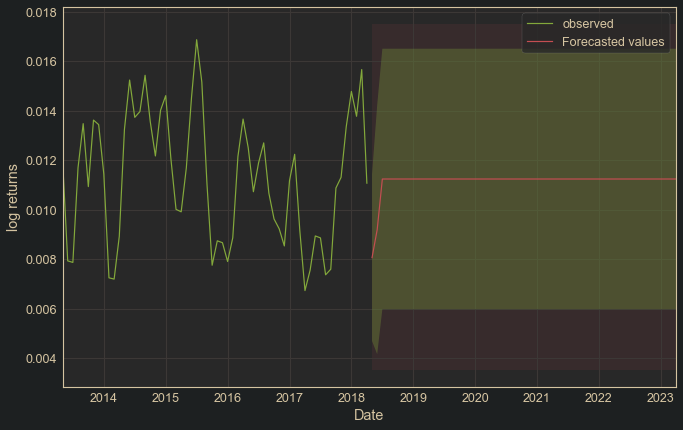

In [1158]:
# Plot future predictions with confidence intervals
ax = test_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax)

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_xlabel('Date')
ax.set_ylabel('log returns')
plt.legend()
plt.show()

In [1160]:
# We can see that this zipcode has a very optimistic forecast into the next 5 years, with the
# lower confidence band at around .6% returns per month, not bad.

In [60]:
# Now that we have our fastest growing and least volatile zip codes, as determined by
# model comparisons based on data since 2013-04-01, we need to take into account which of our
# new list of top performers is most profitable through renting. To do this, we will reload
# our Price-to-Rent data, and use it to filter our results.
p2r = pd.read_csv('data/price_to_rent.csv')

In [61]:
p2r.head()

,Region Name,Region Name (group),National Average,P2R,Zhvi
0,"Yuma, AZ",Other,11.44,12.18,"$134,200"
1,"Yuba City, CA",Other,11.44,14.90,"$249,400"
2,"Youngstown, OH",Other,11.44,8.86,"$85,400"
3,"York, PA",Other,11.44,10.55,"$163,600"
4,"Yakima, WA",Other,11.44,13.51,"$181,700"


In [1162]:
group = groups.get_group(best_lower_conf.index[0])
group['Region Name'] = group['Metro'] + ', ' + group['State']
group

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,zipcode,City,State,Metro,CountyName,date,value,Region Name
5505,80002,Arvada,CO,Denver,Jefferson,1996-04-01,116000.0,"Denver, CO"
20228,80002,Arvada,CO,Denver,Jefferson,1996-05-01,116300.0,"Denver, CO"
34951,80002,Arvada,CO,Denver,Jefferson,1996-06-01,116700.0,"Denver, CO"
49674,80002,Arvada,CO,Denver,Jefferson,1996-07-01,117000.0,"Denver, CO"
64397,80002,Arvada,CO,Denver,Jefferson,1996-08-01,117400.0,"Denver, CO"
...,...,...,...,...,...,...,...,...
3833485,80002,Arvada,CO,Denver,Jefferson,2017-12-01,369500.0,"Denver, CO"
3848208,80002,Arvada,CO,Denver,Jefferson,2018-01-01,375000.0,"Denver, CO"
3862931,80002,Arvada,CO,Denver,Jefferson,2018-02-01,380200.0,"Denver, CO"
3877654,80002,Arvada,CO,Denver,Jefferson,2018-03-01,386200.0,"Denver, CO"


In [1167]:
zipcode_info = pd.DataFrame()

for zipcode in best_lower_conf.index:
    group = groups.get_group(zipcode)
    group['Region Name'] = group['Metro'] + ', ' + group['State']
    zipcode_info = pd.concat([zipcode_info,
                              pd.DataFrame(group.iloc[0][['Region Name', 'zipcode', 'City', 'State']]).T
                             ], axis=0)
    
zipcode_info.head()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,Region Name,zipcode,City,State
5505,"Denver, CO",80002,Arvada,CO
2155,"Denver, CO",80204,Denver,CO
505,"Nashville, TN",37129,Murfreesboro,TN
942,"Denver, CO",80229,Thornton,CO
2431,"Denver, CO",80017,Aurora,CO


In [1174]:
joined = best_lower_conf.merge(zipcode_info, 
                               left_index=True, 
                               left_on='zipcode', 
                               right_on='zipcode')
joined.head()

,zipcode,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State
5505,80002,0.000003,0.011153,0.005931,"Denver, CO",Arvada,CO
2155,80204,0.000005,0.014510,0.005679,"Denver, CO",Denver,CO
505,37129,0.000003,0.009774,0.004969,"Nashville, TN",Murfreesboro,TN
942,80229,0.000003,0.010630,0.004844,"Denver, CO",Thornton,CO
2431,80017,0.000002,0.011228,0.004707,"Denver, CO",Aurora,CO


In [1175]:
joined2 = joined.merge(p2r[['Region Name', 'P2R', 'National Average']], 
                       left_index=True,
                       left_on='Region Name',
                       right_on='Region Name',
                       how='left'
                      )
joined2.head(15)

,zipcode,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
433.0,80002,0.000003,0.011153,0.005931,"Denver, CO",Arvada,CO,14.65,11.44
433.0,80204,0.000005,0.014510,0.005679,"Denver, CO",Denver,CO,14.65,11.44
213.0,37129,0.000003,0.009774,0.004969,"Nashville, TN",Murfreesboro,TN,12.05,11.44
433.0,80229,0.000003,0.010630,0.004844,"Denver, CO",Thornton,CO,14.65,11.44
433.0,80017,0.000002,0.011228,0.004707,"Denver, CO",Aurora,CO,14.65,11.44
433.0,80260,0.000002,0.009902,0.004596,"Denver, CO",Thornton,CO,14.65,11.44
185.0,32807,0.000008,0.014975,0.004515,"Orlando, FL",Orlando,FL,11.83,11.44
433.0,80223,0.000004,0.012346,0.004431,"Denver, CO",Denver,CO,14.65,11.44
366.0,80634,0.000002,0.008358,0.004385,"Greeley, CO",Greeley,CO,14.08,11.44
240.0,33025,0.000005,0.010202,0.004143,"Miami-Fort Lauderdale, FL",Miramar,FL,10.98,11.44


In [1177]:
joined2.P2R.isna().sum()

7

In [1176]:
# We can see that many of our top contenders considering the mean of the lower confidence limit
# are well above the national average price-to-rent ratio. This means that while the outlook for
# capital appreciation is good, the ability to profit off of renting the properties in these
# areas during the holding period is less attractive. Since capital appreciation projections
# could be thrown off by future macroeconomic events that negatively impact the real estate
# market, it would be good to know that the zip codes being invested in had good profitability
# on renting out properites. Let's filter down our list to see how many of our contenders have
# p2r that is below the national average
profitable_rent = joined2[joined2.P2R < joined2['National Average']]
profitable_rent

,zipcode,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
240.0,33025,0.000005,0.010202,0.004143,"Miami-Fort Lauderdale, FL",Miramar,FL,10.98,11.44
62.0,33713,0.000009,0.014169,0.004027,"Tampa, FL",Saint Petersburg,FL,11.05,11.44
240.0,33055,0.000009,0.014399,0.003847,"Miami-Fort Lauderdale, FL",Miami Gardens,FL,10.98,11.44
158.0,34952,0.000006,0.012106,0.003659,"Port St. Lucie, FL",Port Saint Lucie,FL,11.05,11.44
390.0,33936,0.000008,0.013868,0.002645,"Fort Myers, FL",Lehigh Acres,FL,10.80,11.44
158.0,34984,0.000005,0.011580,0.002589,"Port St. Lucie, FL",Port Saint Lucie,FL,11.05,11.44
240.0,33462,0.000006,0.012005,0.002545,"Miami-Fort Lauderdale, FL",Lantana,FL,10.98,11.44
240.0,33417,0.000007,0.011310,0.002382,"Miami-Fort Lauderdale, FL",Century Village,FL,10.98,11.44
431.0,48080,0.000006,0.010506,0.002347,"Detroit, MI",Saint Clair Shores,MI,9.63,11.44
431.0,48180,0.000007,0.010289,0.002304,"Detroit, MI",Taylor,MI,9.63,11.44


In [114]:
zip_list = [33025, 33713, 33055, 34952, 33936]

In [151]:
hurt_zip = 33936
hurt_zip = groups.get_group(hurt_zip).set_index('date').value.dropna()
hurt_zip_returns = np.log(hurt_zip).diff().dropna()
hurt_zip_returns.to_csv('data/hurt_zip.csv')

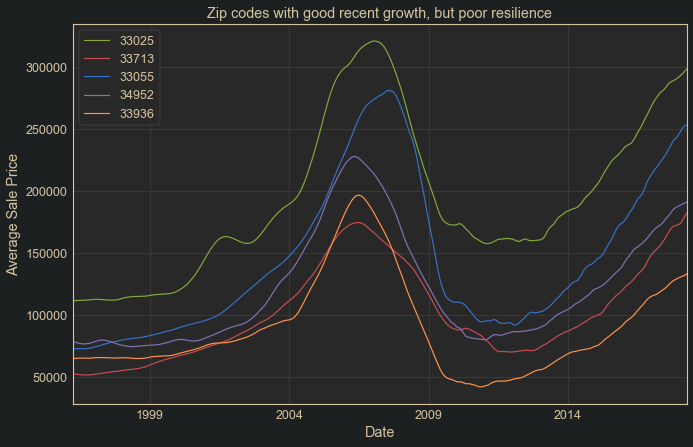

In [117]:
# We see a good number of contenders here, though many of them are in similar locations,
# mostly in Florida. We had been hoping to diversify our investments to avoid position
# concentration risk, that is, to ensure that if something negatively impacts a local real
# estate market, that we do not have all of our eggs in that basket.

# Let's take a look at some of these zips
for i, zipcode in enumerate(zip_list):
    group = groups.get_group(zipcode).set_index('date').value
    group.plot(label=zipcode)
    if (i+1) % 5 == 0 or i == len(zip_list):
        plt.ylabel('Average Sale Price')
        plt.xlabel('Date')
        plt.title('Zip codes with good recent growth, but poor resilience')
        plt.legend()
        plt.show()

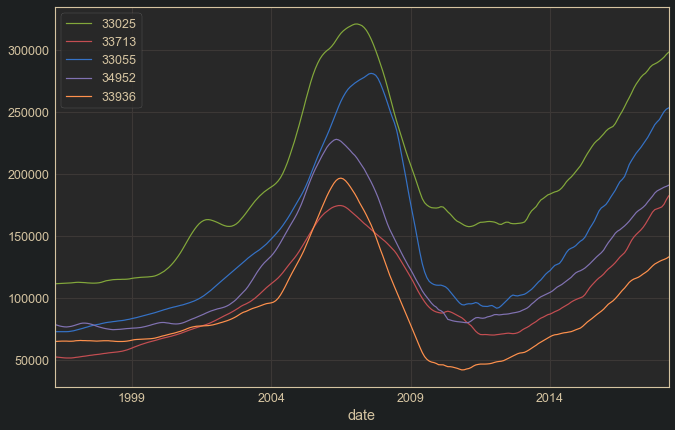

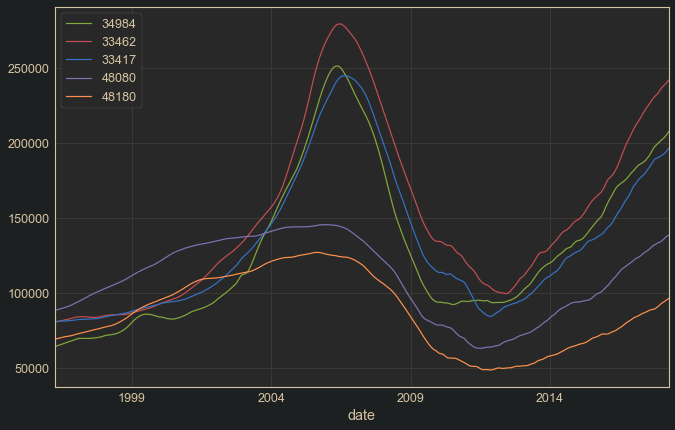

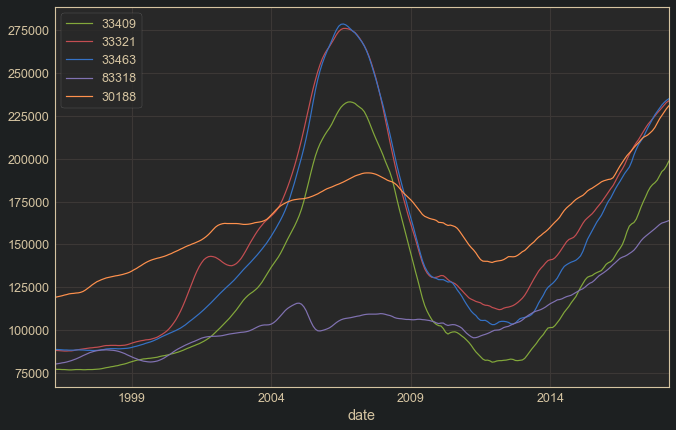

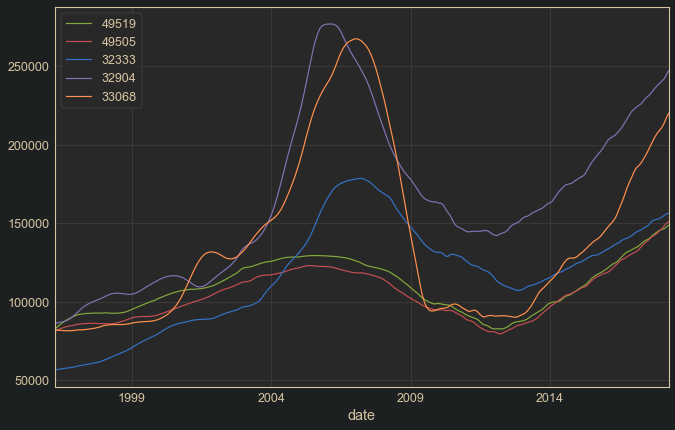

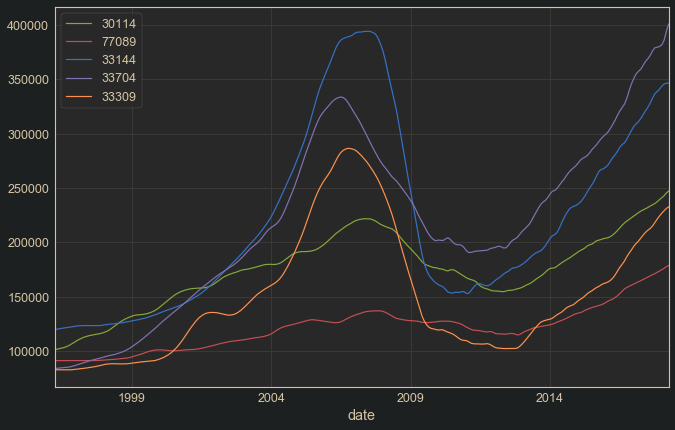

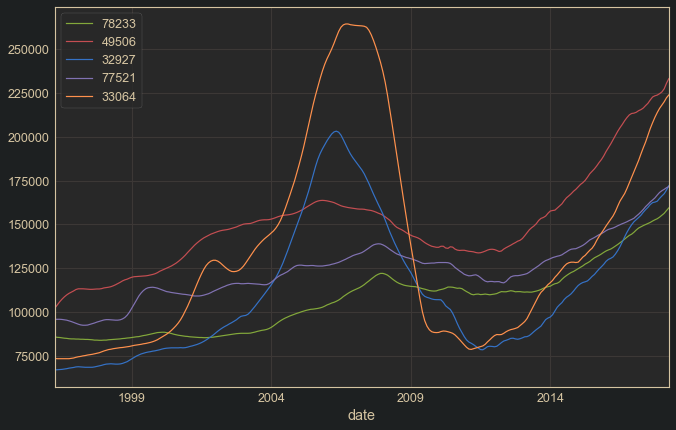

In [1180]:
# We see a good number of contenders here, though many of them are in similar locations,
# mostly in Florida. We had been hoping to diversify our investments to avoid position
# concentration risk, that is, to ensure that if something negatively impacts a local real
# estate market, that we do not have all of our eggs in that basket.

# Let's take a look at some of these zips
for i, zipcode in enumerate(profitable_rent.zipcode):
    group = groups.get_group(zipcode).set_index('date').value
    group.plot(label=zipcode)
    if (i+1) % 5 == 0 or i == len(profitable_rent):
        plt.legend()
        plt.show()

In [ ]:
# We can see that filtering based on the modeling results that ignored the time before and
# during the crash has led us to have some zip codes in our list that handled the crash
# extremely poorly. Many on this list were worth less after the crash than they were before it.
# The logic behind why the time window was limited to after the crash still stands, however,
# since fitting the models over a time window that contains different regimes of market 
# conditions, with heteroscedasticity present, is not appropriate. However, we do not want to
# invest in zip codes that are not resilient during the crash. We can select zip codes from this
# list which showed resilience during the crash.
good_zips = [83318, 77089, 49519, 30114, 78233, ]

In [1181]:
# We can see Lehigh Acres has appeared on this list, but this time, it is a zip code which had
# complete data over the entire time period of the data, unlike the Lehigh Acres zip codes we
# selected in the introductory notebook. This tells me that it is risky to trust the statistics
# or models generated for zip codes which do not have data over the course of the crash, because
# there is no way to know how these zip codes handled the crash. As we can see from the above
# charts, some zip codes were absolutely annihilated by the housing crash, and any investor who
# entered the market before it happened would have been taken on a terrible ride, as the value
# of their assets was reduced by large factors. In order to make the best possible
# recommendations, it may be best to ignore zip codes with incomplete data, and also to compare
# the sigma2 and confidence intervals generated from models which are fit over this time period
# as well. Although there will be heteroscedasticity in this data, the models will be fitted
# trying to find coefficients and confidence intervals which maximize the likelihood of the
# data during these periods. I would like to see how the results of these model comparisons
# play out, so I will repeat the modeling process, but this time using the whole time period,
# and also ignoring zip codes with missing data.

In [90]:
results_new = pd.DataFrame(columns=['sigma2', 'predicted_mean', 'lower_conf_mean'])

In [91]:
for name, group in groups:
    # Weed out already completed zips
    if name in results_new.index:
        continue
        
    # Weed out zip codes with missing data
    if group.set_index('date').value.isna().sum() > 0:
        continue
    
    value = group.set_index('date').value.dropna()
    
    # Weed out over expensive zip codes
    if value[-1] > 500000:
        continue
        
    print(name)
    returns = np.log(value).diff().dropna().asfreq('MS')
    
    try:
        order, sorder, coeffs, const = tsa.model_from_autoarima(returns, freq=12)
        model = SARIMAX(returns, 
                        order=order, 
                        seasonal_order=sorder, 
                        enforce_invertibility=False,
                        enforce_stationarity=False,
                        exog=const)
        res = model.smooth(coeffs)

        prediction = res.get_forecast(periods_ahead, exog=constant)
        pred_conf = prediction.conf_int()

        predmean = prediction.predicted_mean.mean()
        low_conf_mean = pred_conf.iloc[:, 0].mean()

        results_new.loc[name, 'sigma2'] = coeffs.loc['sigma2']
        results_new.loc[name, 'predicted_mean'] = predmean
        results_new.loc[name, 'lower_conf_mean'] = low_conf_mean
    except:
        results_new.loc[name, ['sigma2', 'predicted_mean', 'lower_conf_mean']] = np.NaN

1001
(3, 1, 1)(0, 0, 2, 12) model with no constant
1002
(0, 1, 3)(0, 0, 2, 12) model with no constant
1005
(2, 1, 1)(0, 0, 2, 12) model with no constant
1007
(4, 1, 3)(1, 0, 1, 12) model with no constant
1008
(0, 1, 3)(0, 0, 1, 12) model with no constant
1010
(0, 1, 3)(0, 0, 2, 12) model with no constant
1011
(2, 0, 3)(0, 0, 1, 12) model with intercept
1013
(2, 1, 3)(1, 0, 1, 12) model with no constant
1020
(0, 1, 3)(2, 0, 1, 12) model with no constant
1026
(1, 0, 2)(0, 0, 2, 12) model with intercept
1027
(2, 1, 3)(1, 0, 1, 12) model with no constant
1028
(5, 1, 1)(0, 0, 2, 12) model with no constant
1030
(2, 1, 3)(0, 0, 2, 12) model with drift
1033
(2, 1, 3)(0, 0, 1, 12) model with no constant
1034
(0, 1, 1)(1, 0, 1, 12) model with no constant
1035
(2, 1, 5)(0, 0, 2, 12) model with no constant
1036
(0, 1, 3)(1, 0, 1, 12) model with no constant
1038
(4, 1, 4)(0, 0, 1, 12) model with drift
1040
(0, 1, 1)(0, 0, 2, 12) model with no constant
1050
(0, 1, 3)(1, 0, 2, 12) model with no const

(2, 1, 3)(0, 0, 2, 12) model with no constant
1824
(1, 1, 4)(0, 0, 0, 0) model with no constant
1826
(2, 1, 4)(0, 0, 2, 12) model with no constant
1827
(4, 1, 1)(0, 0, 2, 12) model with no constant
1830
(0, 1, 3)(0, 0, 1, 12) model with no constant
1832
(2, 1, 2)(0, 0, 2, 12) model with no constant
1833
(3, 1, 2)(0, 0, 2, 12) model with no constant
1835
(0, 1, 3)(1, 0, 1, 12) model with no constant
1841
(0, 1, 3)(0, 0, 2, 12) model with no constant
1843
(2, 1, 1)(2, 0, 1, 12) model with no constant
1844
(3, 1, 3)(0, 0, 0, 0) model with no constant
1850
(2, 1, 2)(0, 0, 2, 12) model with no constant
1851
(2, 1, 0)(0, 0, 0, 0) model with no constant
1852
(2, 1, 1)(0, 0, 1, 12) model with no constant
1854
(1, 1, 3)(2, 0, 2, 12) model with drift
1860
(3, 1, 2)(0, 0, 1, 12) model with no constant
1862
(2, 1, 2)(0, 0, 2, 12) model with no constant
1863
(3, 1, 3)(0, 0, 2, 12) model with no constant
1876
(4, 1, 2)(2, 0, 1, 12) model with no constant
1879
(2, 1, 2)(0, 0, 2, 12) model with no con

(1, 1, 4)(0, 0, 1, 12) model with no constant
2886
(2, 1, 0)(1, 0, 2, 12) model with no constant
2888
(0, 1, 4)(0, 0, 2, 12) model with no constant
2889
(4, 1, 4)(2, 0, 1, 12) model with drift
2891
(0, 1, 3)(0, 0, 2, 12) model with no constant
2892
(1, 1, 3)(2, 0, 2, 12) model with drift
2893
(2, 1, 5)(0, 0, 2, 12) model with no constant
2895
(4, 1, 2)(1, 0, 2, 12) model with no constant
2896
(0, 1, 3)(0, 0, 2, 12) model with no constant
2898
(0, 1, 4)(0, 0, 2, 12) model with no constant
2904
(0, 1, 3)(0, 0, 2, 12) model with no constant
2905
(3, 1, 3)(0, 0, 2, 12) model with no constant
2907
(2, 1, 0)(0, 0, 2, 12) model with no constant
2908
(3, 1, 2)(0, 0, 2, 12) model with no constant
2909
(2, 1, 3)(1, 0, 1, 12) model with no constant
2910
(0, 1, 3)(0, 0, 2, 12) model with no constant
2911
(0, 1, 1)(1, 0, 1, 12) model with no constant
2914
(2, 1, 3)(0, 0, 2, 12) model with no constant
2915
(5, 1, 1)(0, 0, 2, 12) model with drift
2916
(2, 1, 0)(0, 0, 2, 12) model with no constant
291

(2, 1, 3)(0, 0, 1, 12) model with no constant
3810
(5, 1, 4)(0, 0, 2, 12) model with no constant
3811
(0, 1, 3)(0, 0, 2, 12) model with no constant
3812
(4, 1, 1)(0, 0, 2, 12) model with no constant
3813
(2, 1, 3)(0, 0, 2, 12) model with no constant
3814
(0, 1, 5)(0, 0, 2, 12) model with no constant
3816
(4, 1, 3)(0, 0, 1, 12) model with no constant
3818
(5, 1, 1)(0, 0, 2, 12) model with no constant
3819
(2, 1, 0)(0, 0, 2, 12) model with no constant
3820
(0, 1, 3)(1, 0, 1, 12) model with no constant
3823
(2, 1, 2)(0, 0, 0, 0) model with drift
3824
(5, 1, 2)(0, 0, 1, 12) model with no constant
3825
(0, 1, 3)(0, 0, 2, 12) model with no constant
3826
(2, 1, 1)(2, 0, 2, 12) model with drift
3827
(2, 1, 1)(0, 0, 2, 12) model with no constant
3830
(0, 1, 4)(0, 0, 2, 12) model with no constant
3833
(2, 1, 2)(0, 0, 1, 12) model with drift
3836
(0, 1, 3)(0, 0, 1, 12) model with no constant
3837
(4, 1, 1)(0, 0, 1, 12) model with no constant
3839
(4, 1, 2)(2, 0, 0, 12) model with no constant
3840

(3, 1, 3)(0, 0, 2, 12) model with no constant
6095
(2, 1, 1)(0, 0, 2, 12) model with no constant
6098
(2, 1, 1)(0, 0, 2, 12) model with no constant
6105
(0, 1, 3)(0, 0, 2, 12) model with no constant
6106
(2, 1, 1)(0, 0, 2, 12) model with no constant
6109
(1, 1, 3)(1, 0, 2, 12) model with no constant
6112
(3, 1, 5)(0, 0, 2, 12) model with no constant
6114
(1, 1, 3)(0, 0, 2, 12) model with no constant
6118
(4, 1, 5)(0, 0, 1, 12) model with no constant
6226
(5, 1, 1)(0, 0, 2, 12) model with no constant
6231
(4, 1, 5)(0, 0, 1, 12) model with no constant
6232
(3, 1, 3)(0, 0, 1, 12) model with no constant
6235
(0, 1, 3)(0, 0, 0, 0) model with no constant
6238
(4, 1, 4)(0, 0, 2, 12) model with no constant
6248
(0, 1, 3)(0, 0, 2, 12) model with no constant
6249
(5, 1, 0)(0, 0, 2, 12) model with no constant
6250
(4, 1, 4)(0, 0, 2, 12) model with no constant
6254
(2, 1, 3)(0, 0, 2, 12) model with drift
6256
(2, 1, 3)(0, 0, 2, 12) model with no constant
6260
(0, 1, 3)(0, 0, 1, 12) model with drif

(2, 1, 3)(0, 0, 2, 12) model with no constant
7410
(2, 1, 3)(0, 0, 2, 12) model with no constant
7416
(3, 1, 2)(0, 0, 2, 12) model with no constant
7418
(2, 1, 0)(1, 0, 0, 12) model with no constant
7419
(2, 1, 1)(0, 0, 2, 12) model with no constant
7420
(3, 1, 3)(0, 0, 2, 12) model with no constant
7421
(0, 1, 3)(0, 0, 2, 12) model with no constant
7422
(2, 1, 1)(0, 0, 2, 12) model with no constant
7424
(2, 1, 2)(0, 0, 2, 12) model with no constant
7432
(2, 1, 3)(0, 0, 0, 0) model with no constant
7435
(5, 1, 3)(1, 0, 1, 12) model with no constant
7436
(3, 1, 3)(0, 0, 2, 12) model with no constant
7438
(3, 1, 3)(0, 0, 1, 12) model with drift
7439
(3, 1, 3)(0, 0, 2, 12) model with no constant
7440
(2, 1, 3)(2, 0, 2, 12) model with drift
7442
(4, 1, 2)(0, 0, 1, 12) model with no constant
7444
(0, 1, 3)(1, 0, 1, 12) model with no constant
7456
(0, 1, 3)(0, 0, 2, 12) model with no constant
7457
(5, 1, 1)(0, 0, 2, 12) model with no constant
7460
(0, 1, 3)(0, 0, 2, 12) model with no constan

(0, 1, 3)(0, 0, 2, 12) model with no constant
8078
(2, 1, 0)(0, 0, 2, 12) model with no constant
8079
(2, 1, 3)(0, 0, 1, 12) model with no constant
8080
(2, 1, 0)(0, 0, 2, 12) model with no constant
8081
(2, 1, 3)(0, 0, 2, 12) model with no constant
8083
(2, 1, 2)(0, 0, 2, 12) model with no constant
8084
(2, 1, 3)(1, 0, 1, 12) model with no constant
8085
(3, 1, 0)(0, 0, 2, 12) model with drift
8086
(0, 1, 3)(1, 0, 1, 12) model with no constant
8087
(3, 1, 3)(0, 0, 2, 12) model with no constant
8088
(4, 1, 3)(0, 0, 1, 12) model with no constant
8089
(0, 1, 3)(0, 0, 2, 12) model with no constant
8090
(2, 1, 0)(0, 0, 2, 12) model with no constant
8091
(0, 1, 3)(0, 0, 2, 12) model with no constant
8092
(0, 1, 3)(0, 0, 2, 12) model with no constant
8093
(4, 1, 2)(0, 0, 2, 12) model with no constant
8094
(1, 1, 4)(0, 0, 2, 12) model with no constant
8096
(0, 1, 3)(0, 0, 1, 12) model with no constant
8097
(0, 1, 3)(0, 0, 2, 12) model with no constant
8098
(3, 1, 4)(0, 0, 1, 12) model with no 

(3, 1, 3)(0, 0, 1, 12) model with drift
10509
(5, 1, 2)(0, 0, 2, 12) model with no constant
10512
(2, 1, 5)(0, 0, 2, 12) model with no constant
10516
(0, 1, 1)(0, 0, 0, 0) model with drift
10523
(5, 1, 1)(0, 0, 1, 12) model with no constant
10524
(0, 1, 3)(0, 0, 1, 12) model with no constant
10526
(5, 1, 2)(0, 0, 1, 12) model with no constant
10537
(5, 1, 1)(0, 0, 1, 12) model with no constant
10541
(0, 1, 3)(0, 0, 2, 12) model with no constant
10547
(0, 1, 3)(0, 0, 2, 12) model with no constant
10553
(4, 1, 0)(1, 0, 0, 12) model with no constant
10562
(0, 1, 3)(0, 0, 1, 12) model with no constant
10566
(3, 1, 4)(0, 0, 1, 12) model with drift
10567
(2, 1, 1)(0, 0, 2, 12) model with no constant
10579
(5, 1, 4)(0, 0, 2, 12) model with no constant
10588
(5, 1, 3)(0, 0, 1, 12) model with no constant
10589
(3, 1, 2)(0, 0, 2, 12) model with no constant
10598
(0, 1, 3)(0, 0, 2, 12) model with no constant
10603
(0, 1, 3)(0, 0, 2, 12) model with no constant
10701
(2, 1, 2)(0, 0, 2, 12) model wi

(4, 1, 2)(0, 0, 2, 12) model with no constant
11941
(4, 1, 4)(0, 0, 1, 12) model with drift
11949
(2, 1, 1)(0, 0, 2, 12) model with no constant
11950
(0, 1, 3)(0, 0, 2, 12) model with no constant
11953
(0, 1, 3)(0, 0, 1, 12) model with no constant
11955
(2, 1, 4)(0, 0, 2, 12) model with no constant
11961
(2, 1, 2)(0, 0, 2, 12) model with no constant
11967
(3, 1, 2)(0, 0, 2, 12) model with no constant
11980
(2, 1, 1)(0, 0, 2, 12) model with no constant
12009
(1, 1, 3)(0, 0, 2, 12) model with no constant
12015
(2, 1, 0)(0, 0, 2, 12) model with no constant
12018
(1, 1, 3)(0, 0, 2, 12) model with no constant
12019
(2, 1, 1)(0, 0, 2, 12) model with no constant
12020
(0, 1, 3)(1, 0, 0, 12) model with no constant
12023
(2, 0, 3)(0, 0, 2, 12) model with intercept
12027
(1, 1, 3)(2, 0, 0, 12) model with no constant
12029
(2, 1, 3)(0, 0, 0, 0) model with no constant
12033
(4, 1, 5)(0, 0, 1, 12) model with no constant
12037
(5, 1, 1)(0, 0, 2, 12) model with no constant
12043
(2, 1, 0)(1, 0, 1, 12

(3, 1, 3)(1, 0, 1, 12) model with no constant
12575
(0, 1, 3)(1, 0, 1, 12) model with no constant
12577
(0, 1, 3)(0, 0, 2, 12) model with no constant
12578
(5, 1, 5)(1, 0, 1, 12) model with no constant
12580
(1, 1, 4)(0, 0, 2, 12) model with no constant
12581
(2, 1, 2)(0, 0, 2, 12) model with no constant
12582
(0, 1, 3)(1, 0, 1, 12) model with no constant
12583
(3, 1, 2)(0, 0, 1, 12) model with no constant
12586
(4, 1, 4)(2, 0, 2, 12) model with drift
12589
(2, 1, 0)(0, 0, 2, 12) model with no constant
12590
(3, 1, 2)(2, 0, 2, 12) model with no constant
12594
(0, 1, 3)(0, 0, 1, 12) model with no constant
12601
(2, 1, 2)(0, 0, 2, 12) model with no constant
12603
(2, 1, 2)(2, 0, 1, 12) model with no constant
12720
(4, 1, 4)(0, 0, 2, 12) model with no constant
12721
(2, 1, 3)(0, 0, 2, 12) model with no constant
12726
(5, 1, 2)(0, 0, 2, 12) model with no constant
12729
(3, 1, 4)(0, 0, 2, 12) model with no constant
12737
(0, 1, 4)(0, 0, 2, 12) model with no constant
12740
(1, 1, 3)(0, 0, 2,

13354
(3, 0, 2)(1, 0, 2, 12) model with intercept
13357
(3, 0, 0)(0, 0, 2, 12) model with intercept
13365
(2, 0, 3)(0, 0, 2, 12) model with intercept
13403
(5, 0, 3)(1, 0, 1, 12) model with intercept
13407
(4, 1, 3)(2, 0, 1, 12) model with no constant
13408
(3, 0, 0)(2, 0, 1, 12) model with intercept
13409
(1, 1, 3)(2, 0, 1, 12) model with no constant
13411
(0, 1, 3)(0, 0, 2, 12) model with no constant
13413
(1, 0, 4)(0, 0, 1, 12) model with intercept
13416
(3, 0, 3)(2, 0, 1, 12) model with intercept
13417
(3, 0, 0)(0, 0, 2, 12) model with intercept
13420
(0, 1, 3)(0, 0, 2, 12) model with no constant
13421
(2, 0, 3)(0, 0, 2, 12) model with intercept
13424
(1, 0, 1)(0, 0, 2, 12) model with intercept
13431
(2, 1, 1)(0, 0, 2, 12) model with drift
13438
(1, 0, 3)(0, 0, 2, 12) model with intercept
13439
(1, 1, 3)(0, 0, 2, 12) model with no constant
13440
(1, 0, 3)(0, 0, 1, 12) model with intercept
13456
(3, 0, 2)(0, 0, 2, 12) model with intercept
13459
(1, 1, 3)(2, 0, 2, 12) model with no c

(0, 1, 4)(0, 0, 2, 12) model with drift
14305
(2, 0, 2)(0, 0, 2, 12) model with intercept
14411
(2, 0, 2)(1, 0, 1, 12) model with intercept
14414
(1, 0, 1)(0, 0, 2, 12) model with intercept
14418
(4, 0, 3)(0, 0, 2, 12) model with intercept
14420
(1, 0, 1)(1, 0, 1, 12) model with no constant
14423
(3, 0, 2)(0, 0, 1, 12) model with intercept
14424
(5, 1, 2)(2, 0, 1, 12) model with no constant
14425
(1, 0, 2)(0, 0, 1, 12) model with intercept
14428
(4, 0, 0)(0, 0, 2, 12) model with intercept
14432
(3, 0, 1)(1, 0, 1, 12) model with intercept
14433
(1, 0, 1)(0, 0, 2, 12) model with intercept
14435
(5, 0, 4)(0, 0, 2, 12) model with intercept
14437
(2, 0, 4)(0, 0, 0, 0) model with intercept
14445
(1, 0, 2)(0, 0, 1, 12) model with intercept
14450
(2, 0, 2)(0, 0, 1, 12) model with intercept
14454
(2, 1, 5)(0, 0, 2, 12) model with no constant
14456
(1, 0, 1)(0, 0, 1, 12) model with intercept
14464
(2, 0, 2)(0, 0, 2, 12) model with intercept
14466
(3, 0, 0)(0, 0, 2, 12) model with intercept
14467

(1, 0, 3)(0, 0, 1, 12) model with no constant
15035
(1, 0, 2)(0, 0, 2, 12) model with no constant
15037
(3, 0, 5)(0, 0, 2, 12) model with intercept
15042
(1, 0, 3)(0, 0, 1, 12) model with intercept
15044
(2, 0, 1)(0, 0, 2, 12) model with intercept
15045
(1, 0, 3)(0, 0, 2, 12) model with no constant
15046
(1, 0, 3)(0, 0, 2, 12) model with intercept
15050
(3, 0, 2)(0, 0, 2, 12) model with no constant
15052
(1, 0, 3)(0, 0, 2, 12) model with intercept
15057
(2, 1, 3)(0, 0, 1, 12) model with no constant
15061
(4, 0, 2)(1, 0, 1, 12) model with intercept
15063
(2, 1, 0)(0, 0, 1, 12) model with no constant
15065
(1, 0, 2)(0, 0, 2, 12) model with intercept
15066
(5, 0, 1)(0, 0, 2, 12) model with intercept
15068
(3, 1, 2)(2, 0, 0, 12) model with no constant
15071
(1, 0, 3)(0, 0, 2, 12) model with intercept
15074
(2, 1, 0)(0, 0, 1, 12) model with no constant
15083
(2, 1, 1)(0, 0, 2, 12) model with no constant
15084
(1, 0, 1)(0, 0, 2, 12) model with intercept
15085
(2, 1, 0)(0, 0, 2, 12) model wit

(2, 1, 3)(0, 0, 2, 12) model with drift
16052
(1, 1, 3)(1, 0, 2, 12) model with no constant
16053
(3, 1, 2)(0, 0, 2, 12) model with no constant
16055
(0, 1, 3)(2, 0, 0, 12) model with drift
16056
(1, 1, 3)(0, 0, 2, 12) model with no constant
16057
(3, 1, 3)(1, 0, 1, 12) model with drift
16059
(2, 1, 2)(0, 0, 1, 12) model with drift
16061
(2, 1, 3)(0, 0, 1, 12) model with no constant
16063
(1, 1, 4)(1, 0, 2, 12) model with no constant
16066
(2, 1, 2)(2, 0, 0, 12) model with no constant
16101
(2, 0, 1)(1, 0, 1, 12) model with no constant
16105
(2, 0, 2)(0, 0, 1, 12) model with intercept
16117
(2, 0, 2)(0, 0, 0, 0) model with intercept
16121
(0, 1, 3)(0, 0, 2, 12) model with no constant
16123
(3, 0, 3)(0, 0, 2, 12) model with intercept
16124
(2, 1, 3)(0, 0, 2, 12) model with drift
16125
(1, 1, 5)(0, 0, 2, 12) model with no constant
16127
(2, 1, 2)(1, 0, 0, 12) model with drift
16130
(3, 1, 4)(0, 0, 2, 12) model with no constant
16133
(0, 1, 3)(2, 0, 0, 12) model with no constant
16134
(0,

(3, 1, 1)(1, 0, 1, 12) model with no constant
17104
(1, 0, 3)(0, 0, 2, 12) model with no constant
17109
(2, 1, 1)(1, 0, 1, 12) model with no constant
17110
(1, 1, 2)(0, 0, 2, 12) model with no constant
17111
(1, 1, 3)(0, 0, 2, 12) model with no constant
17112
(4, 1, 4)(2, 0, 1, 12) model with no constant
17113
(1, 0, 1)(0, 0, 2, 12) model with intercept
17201
(4, 0, 2)(2, 0, 2, 12) model with no constant
17202
(3, 0, 5)(0, 0, 2, 12) model with intercept
17222
(2, 0, 2)(0, 0, 2, 12) model with no constant
17237
(4, 0, 1)(2, 0, 2, 12) model with no constant
17240
(3, 1, 3)(1, 0, 1, 12) model with no constant
17241
(5, 1, 2)(2, 0, 1, 12) model with no constant
17257
(3, 0, 2)(2, 0, 1, 12) model with no constant
17268
(3, 0, 2)(2, 0, 2, 12) model with intercept
17301
(0, 1, 3)(0, 0, 2, 12) model with no constant
17302
(4, 1, 1)(0, 0, 2, 12) model with no constant
17304
(3, 1, 5)(0, 0, 2, 12) model with no constant
17307
(0, 1, 3)(0, 0, 2, 12) model with no constant
17309
(5, 1, 1)(1, 0, 1,

(1, 1, 3)(0, 0, 2, 12) model with no constant
18077
(0, 1, 3)(0, 0, 2, 12) model with no constant
18078
(2, 1, 3)(0, 0, 1, 12) model with no constant
18080
(2, 1, 1)(0, 0, 2, 12) model with no constant
18088
(5, 1, 1)(1, 0, 1, 12) model with no constant
18091
(2, 1, 1)(0, 0, 2, 12) model with no constant
18092
(4, 1, 5)(1, 0, 2, 12) model with no constant
18102
(5, 1, 0)(0, 0, 2, 12) model with no constant
18103
(0, 1, 4)(1, 0, 1, 12) model with no constant
18104
(0, 1, 3)(0, 0, 2, 12) model with no constant
18106
(0, 1, 3)(0, 0, 1, 12) model with no constant
18109
(1, 1, 3)(0, 0, 2, 12) model with no constant
18201
(4, 0, 2)(1, 0, 1, 12) model with no constant
18202
(3, 0, 2)(0, 0, 2, 12) model with no constant
18210
(3, 1, 3)(2, 0, 2, 12) model with no constant
18214
(3, 0, 2)(0, 0, 2, 12) model with no constant
18222
(1, 1, 2)(1, 0, 2, 12) model with no constant
18224
(2, 0, 2)(0, 0, 2, 12) model with no constant
18229
(2, 1, 2)(0, 0, 1, 12) model with no constant
18235
(0, 1, 2)(0,

(2, 1, 2)(1, 0, 1, 12) model with no constant
19086
(0, 1, 5)(0, 0, 2, 12) model with no constant
19090
(0, 1, 3)(0, 0, 2, 12) model with no constant
19094
(0, 1, 3)(0, 0, 1, 12) model with no constant
19095
(3, 1, 3)(0, 0, 2, 12) model with no constant
19107
(1, 1, 5)(2, 0, 1, 12) model with no constant
19111
(2, 1, 0)(0, 0, 2, 12) model with no constant
19114
(0, 1, 3)(1, 0, 1, 12) model with no constant
19115
(0, 1, 3)(0, 0, 2, 12) model with no constant
19116
(2, 1, 4)(0, 0, 1, 12) model with no constant
19119
(1, 1, 4)(0, 0, 1, 12) model with no constant
19120
(2, 1, 1)(0, 0, 2, 12) model with no constant
19123
(2, 1, 3)(0, 0, 2, 12) model with no constant
19124
(2, 1, 0)(0, 0, 1, 12) model with no constant
19125
(3, 0, 2)(1, 0, 0, 12) model with intercept
19126
(4, 0, 2)(0, 0, 2, 12) model with intercept
19127
(2, 1, 1)(0, 0, 1, 12) model with no constant
19128
(0, 1, 3)(1, 0, 1, 12) model with no constant
19129
(5, 1, 1)(0, 0, 2, 12) model with no constant
19130
(0, 1, 3)(2, 0, 

(2, 1, 3)(0, 0, 1, 12) model with no constant
20181
(4, 1, 0)(0, 0, 2, 12) model with no constant
20186
(0, 1, 3)(0, 0, 2, 12) model with no constant
20187
(0, 1, 3)(0, 0, 1, 12) model with no constant
20198
(1, 1, 3)(0, 0, 1, 12) model with drift
20601
(2, 1, 2)(0, 0, 2, 12) model with no constant
20602
(3, 1, 2)(0, 0, 2, 12) model with no constant
20603
(5, 1, 1)(0, 0, 2, 12) model with no constant
20607
(5, 0, 0)(0, 0, 1, 12) model with no constant
20609
(1, 1, 3)(0, 0, 2, 12) model with no constant
20613
(2, 0, 2)(0, 0, 2, 12) model with intercept
20616
(3, 1, 3)(0, 0, 1, 12) model with no constant
20618
(2, 1, 1)(0, 0, 2, 12) model with no constant
20619
(5, 1, 3)(0, 0, 2, 12) model with no constant
20621
(0, 1, 1)(0, 0, 0, 0) model with no constant
20622
(3, 1, 3)(0, 0, 1, 12) model with drift
20623
(2, 1, 1)(0, 0, 2, 12) model with no constant
20625
(4, 0, 3)(0, 0, 2, 12) model with intercept
20634
(0, 1, 3)(1, 0, 2, 12) model with no constant
20636
(1, 1, 5)(0, 0, 2, 12) model 

(3, 1, 3)(0, 0, 2, 12) model with no constant
21207
(2, 1, 1)(0, 0, 2, 12) model with no constant
21208
(2, 1, 2)(0, 0, 1, 12) model with no constant
21209
(0, 1, 5)(0, 0, 2, 12) model with no constant
21211
(2, 1, 0)(1, 0, 0, 12) model with no constant
21212
(0, 1, 3)(0, 0, 2, 12) model with no constant
21214
(3, 0, 5)(0, 0, 2, 12) model with no constant
21215
(1, 0, 2)(0, 0, 2, 12) model with no constant
21218
(1, 0, 3)(0, 0, 2, 12) model with no constant
21219
(2, 1, 2)(0, 0, 1, 12) model with drift
21220
(2, 1, 3)(0, 0, 2, 12) model with no constant
21221
(3, 1, 1)(0, 0, 2, 12) model with no constant
21222
(1, 1, 4)(0, 0, 2, 12) model with no constant
21224
(2, 1, 1)(0, 0, 2, 12) model with no constant
21226
(2, 1, 3)(0, 0, 2, 12) model with no constant
21227
(2, 1, 1)(0, 0, 2, 12) model with no constant
21228
(2, 1, 3)(0, 0, 2, 12) model with no constant
21229
(4, 1, 1)(1, 0, 1, 12) model with no constant
21230
(0, 1, 4)(1, 0, 1, 12) model with no constant
21231
(2, 1, 3)(1, 0, 0,

(0, 1, 3)(1, 0, 2, 12) model with no constant
22624
(0, 1, 4)(0, 0, 0, 0) model with no constant
22630
(2, 1, 1)(0, 0, 0, 0) model with no constant
22637
(2, 1, 3)(0, 0, 1, 12) model with no constant
22642
(2, 1, 0)(0, 0, 2, 12) model with no constant
22644
(3, 1, 2)(0, 0, 2, 12) model with no constant
22645
(3, 1, 3)(0, 0, 2, 12) model with no constant
22652
(3, 1, 3)(2, 0, 1, 12) model with no constant
22655
(2, 1, 1)(2, 0, 1, 12) model with no constant
22656
(2, 1, 0)(0, 0, 2, 12) model with no constant
22657
(1, 1, 4)(1, 0, 1, 12) model with no constant
22660
(0, 1, 3)(0, 0, 2, 12) model with no constant
22664
(2, 1, 1)(0, 0, 2, 12) model with no constant
22701
(4, 1, 1)(0, 0, 1, 12) model with no constant
22712
(0, 1, 3)(1, 0, 2, 12) model with no constant
22713
(1, 1, 4)(0, 0, 1, 12) model with no constant
22728
(2, 1, 1)(0, 0, 2, 12) model with no constant
22734
(3, 1, 2)(0, 0, 2, 12) model with no constant
22735
(2, 1, 2)(0, 0, 2, 12) model with no constant
22737
(1, 1, 3)(0, 0

(0, 1, 3)(0, 0, 2, 12) model with no constant
23704
(0, 1, 1)(0, 0, 1, 12) model with no constant
23707
(0, 1, 4)(0, 0, 2, 12) model with no constant
23831
(3, 1, 3)(0, 0, 2, 12) model with no constant
23832
(2, 1, 1)(0, 0, 2, 12) model with no constant
23834
(0, 1, 2)(1, 0, 1, 12) model with no constant
23836
(2, 1, 1)(0, 0, 0, 0) model with no constant
23838
(2, 1, 3)(0, 0, 2, 12) model with no constant
23860
(3, 1, 4)(1, 0, 2, 12) model with drift
23898
(1, 1, 3)(0, 0, 0, 0) model with no constant
24012
(3, 1, 4)(0, 0, 2, 12) model with no constant
24014
(4, 1, 3)(0, 0, 2, 12) model with no constant
24015
(4, 1, 2)(0, 0, 2, 12) model with no constant
24017
(1, 1, 4)(0, 0, 2, 12) model with no constant
24018
(3, 1, 3)(0, 0, 2, 12) model with no constant
24019
(3, 1, 2)(0, 0, 2, 12) model with no constant
24059
(2, 1, 5)(2, 0, 1, 12) model with drift
24060
(2, 1, 2)(2, 0, 2, 12) model with no constant
24064
(1, 1, 3)(2, 0, 1, 12) model with no constant
24065
(4, 1, 3)(0, 0, 2, 12) mod

(3, 0, 2)(0, 0, 1, 12) model with intercept
26571
(1, 0, 1)(0, 0, 2, 12) model with intercept
26582
(1, 0, 4)(1, 0, 1, 12) model with intercept
26588
(3, 0, 0)(0, 0, 2, 12) model with intercept
26591
(1, 0, 1)(0, 0, 2, 12) model with intercept
27006
(1, 1, 3)(2, 0, 0, 12) model with no constant
27009
(1, 1, 4)(0, 0, 2, 12) model with no constant
27012
(4, 1, 5)(1, 0, 0, 12) model with no constant
27013
(3, 0, 2)(1, 0, 2, 12) model with intercept
27017
(0, 1, 3)(1, 0, 2, 12) model with drift
27019
(2, 1, 2)(0, 0, 2, 12) model with no constant
27021
(0, 1, 1)(1, 0, 1, 12) model with no constant
27023
(2, 0, 2)(0, 0, 1, 12) model with intercept
27025
(3, 1, 0)(1, 0, 2, 12) model with no constant
27027
(2, 1, 1)(0, 0, 2, 12) model with no constant
27028
(1, 1, 3)(0, 0, 2, 12) model with no constant
27030
(0, 1, 3)(0, 0, 0, 0) model with no constant
27040
(1, 0, 2)(0, 0, 2, 12) model with intercept
27041
(3, 1, 5)(0, 0, 2, 12) model with no constant
27043
(2, 1, 2)(2, 0, 1, 12) model with n

(1, 1, 4)(2, 0, 2, 12) model with no constant
27712
(3, 1, 4)(1, 0, 0, 12) model with no constant
27713
(1, 1, 3)(1, 0, 1, 12) model with no constant
27801
(2, 1, 2)(0, 0, 2, 12) model with no constant
27803
(2, 1, 2)(0, 0, 2, 12) model with no constant
27804
(2, 1, 2)(2, 0, 2, 12) model with no constant
27822
(2, 1, 2)(0, 0, 2, 12) model with no constant
27828
(2, 1, 3)(0, 0, 1, 12) model with drift
27851
(2, 1, 2)(0, 0, 1, 12) model with no constant
27852
(2, 1, 1)(1, 0, 2, 12) model with no constant
27864
(2, 1, 2)(2, 0, 1, 12) model with drift
27880
(1, 1, 3)(2, 0, 2, 12) model with no constant
27886
(1, 1, 3)(0, 0, 2, 12) model with no constant
27893
(1, 1, 2)(0, 0, 0, 0) model with no constant
27896
(3, 1, 3)(0, 0, 2, 12) model with no constant
27909
(1, 1, 3)(2, 0, 2, 12) model with no constant
27929
(2, 1, 2)(0, 0, 2, 12) model with no constant
27950
(3, 1, 2)(1, 0, 1, 12) model with drift
28012
(1, 1, 3)(0, 0, 2, 12) model with no constant
28016
(1, 0, 3)(0, 0, 1, 12) model wi

(3, 0, 1)(0, 0, 2, 12) model with intercept
28594
(2, 1, 2)(0, 0, 2, 12) model with no constant
28601
(2, 1, 3)(1, 0, 1, 12) model with no constant
28602
(1, 0, 1)(1, 0, 1, 12) model with intercept
28605
(1, 1, 3)(0, 0, 1, 12) model with drift
28607
(1, 1, 4)(0, 0, 2, 12) model with drift
28609
(2, 0, 2)(0, 0, 0, 0) model with no constant
28610
(2, 0, 1)(0, 0, 2, 12) model with intercept
28611
(2, 0, 3)(0, 0, 0, 0) model with no constant
28613
(4, 1, 4)(2, 0, 2, 12) model with no constant
28618
(4, 1, 3)(0, 0, 1, 12) model with no constant
28625
(2, 1, 5)(2, 0, 2, 12) model with no constant
28630
(4, 1, 3)(2, 0, 0, 12) model with no constant
28638
(0, 1, 2)(0, 0, 0, 0) model with no constant
28645
(2, 1, 1)(2, 0, 1, 12) model with no constant
28650
(2, 0, 2)(0, 0, 1, 12) model with intercept
28658
(2, 0, 3)(0, 0, 1, 12) model with no constant
28673
(2, 1, 0)(0, 0, 1, 12) model with no constant
28677
(4, 1, 3)(0, 0, 2, 12) model with no constant
28678
(1, 0, 4)(1, 0, 1, 12) model with i

(1, 1, 4)(2, 0, 0, 12) model with no constant
29445
(3, 1, 2)(0, 0, 2, 12) model with drift
29449
(4, 1, 2)(1, 0, 1, 12) model with no constant
29450
(0, 1, 4)(0, 0, 2, 12) model with no constant
29455
(4, 1, 2)(0, 0, 2, 12) model with no constant
29456
(2, 1, 2)(0, 0, 1, 12) model with no constant
29461
(2, 1, 2)(0, 0, 2, 12) model with no constant
29466
(2, 1, 3)(0, 0, 2, 12) model with no constant
29470
(5, 0, 0)(0, 0, 1, 12) model with intercept
29472
(3, 0, 3)(0, 0, 2, 12) model with intercept
29483
(2, 1, 2)(0, 0, 2, 12) model with no constant
29485
(2, 1, 4)(2, 0, 2, 12) model with no constant
29486
(5, 1, 2)(0, 0, 2, 12) model with drift
29487
(2, 1, 1)(0, 0, 1, 12) model with no constant
29488
(1, 0, 1)(2, 0, 1, 12) model with no constant
29501
(2, 1, 2)(1, 0, 2, 12) model with drift
29505
(2, 1, 2)(1, 0, 2, 12) model with drift
29506
(0, 1, 3)(1, 0, 1, 12) model with drift
29511
(2, 0, 3)(0, 0, 2, 12) model with intercept
29526
(2, 1, 0)(2, 0, 1, 12) model with no constant
29

(2, 1, 1)(0, 0, 2, 12) model with no constant
30147
(1, 1, 3)(0, 0, 2, 12) model with no constant
30152
(0, 1, 3)(0, 0, 2, 12) model with no constant
30161
(1, 1, 3)(0, 0, 2, 12) model with no constant
30165
(5, 0, 1)(0, 0, 2, 12) model with no constant
30173
(0, 1, 1)(0, 0, 1, 12) model with no constant
30176
(3, 1, 3)(0, 0, 0, 0) model with no constant
30180
(1, 1, 3)(0, 0, 2, 12) model with no constant
30183
(2, 1, 3)(0, 0, 1, 12) model with no constant
30185
(4, 0, 0)(0, 0, 2, 12) model with intercept
30187
(2, 1, 3)(2, 0, 1, 12) model with no constant
30188
(1, 1, 3)(1, 0, 2, 12) model with no constant
30189
(2, 1, 0)(0, 0, 1, 12) model with no constant
30205
(5, 1, 1)(0, 0, 2, 12) model with no constant
30213
(0, 1, 3)(0, 0, 2, 12) model with no constant
30214
(4, 1, 5)(0, 0, 2, 12) model with no constant
30215
(0, 1, 4)(0, 0, 0, 0) model with no constant
30216
(2, 1, 1)(0, 0, 2, 12) model with no constant
30220
(0, 1, 4)(0, 0, 2, 12) model with no constant
30224
(5, 1, 3)(0, 0, 

(3, 1, 3)(0, 0, 2, 12) model with no constant
31308
(1, 1, 3)(1, 0, 1, 12) model with no constant
31312
(2, 1, 1)(0, 0, 2, 12) model with no constant
31320
(1, 1, 3)(0, 0, 2, 12) model with no constant
31321
(3, 1, 1)(1, 0, 1, 12) model with drift
31322
(3, 1, 3)(0, 0, 1, 12) model with no constant
31324
(1, 1, 3)(0, 0, 2, 12) model with no constant
31326
(1, 1, 3)(0, 0, 2, 12) model with no constant
31328
(2, 1, 4)(0, 0, 0, 0) model with no constant
31329
(0, 1, 3)(2, 0, 1, 12) model with no constant
31401
(1, 1, 3)(0, 0, 1, 12) model with no constant
31404
(5, 1, 3)(0, 0, 2, 12) model with no constant
31405
(0, 1, 3)(0, 0, 1, 12) model with no constant
31406
(2, 1, 1)(0, 0, 2, 12) model with no constant
31408
(3, 0, 2)(0, 0, 1, 12) model with intercept
31410
(4, 1, 4)(0, 0, 2, 12) model with no constant
31411
(2, 1, 1)(0, 0, 0, 0) model with no constant
31419
(2, 1, 3)(0, 0, 1, 12) model with no constant
31501
(2, 1, 0)(1, 0, 2, 12) model with no constant
31503
(4, 1, 1)(1, 0, 2, 12)

(3, 1, 0)(1, 0, 2, 12) model with no constant
32351
(2, 1, 0)(0, 0, 1, 12) model with no constant
32352
(2, 1, 2)(0, 0, 2, 12) model with no constant
32358
(3, 1, 2)(0, 0, 1, 12) model with no constant
32359
(2, 1, 0)(0, 0, 0, 0) model with no constant
32401
(3, 1, 1)(0, 0, 2, 12) model with no constant
32404
(3, 1, 2)(2, 0, 1, 12) model with no constant
32405
(0, 1, 3)(0, 0, 0, 0) model with no constant
32407
(2, 1, 2)(0, 0, 2, 12) model with no constant
32408
(1, 1, 3)(0, 0, 2, 12) model with no constant
32409
(1, 1, 3)(2, 0, 1, 12) model with no constant
32413
(2, 1, 4)(1, 0, 0, 12) model with no constant
32420
(0, 1, 4)(0, 0, 2, 12) model with no constant
32428
(0, 1, 1)(2, 0, 2, 12) model with no constant
32431
(2, 1, 0)(0, 0, 2, 12) model with no constant
32433
(2, 1, 1)(0, 0, 2, 12) model with no constant
32439
(2, 1, 4)(0, 0, 2, 12) model with no constant
32440
(3, 1, 0)(2, 0, 1, 12) model with no constant
32442
(2, 1, 4)(0, 0, 0, 0) model with no constant
32443
(5, 1, 0)(0, 0,

(2, 1, 1)(0, 0, 2, 12) model with no constant
32953
(4, 1, 2)(0, 0, 2, 12) model with no constant
32955
(2, 1, 2)(2, 0, 0, 12) model with no constant
32958
(0, 1, 2)(2, 0, 2, 12) model with no constant
32960
(1, 1, 3)(0, 0, 2, 12) model with no constant
32962
(4, 1, 0)(0, 0, 2, 12) model with no constant
32966
(2, 1, 1)(1, 0, 2, 12) model with no constant
32967
(0, 1, 3)(2, 0, 1, 12) model with no constant
32968
(1, 0, 3)(1, 0, 2, 12) model with no constant
32976
(2, 1, 1)(0, 0, 1, 12) model with no constant
33004
(0, 1, 1)(0, 0, 2, 12) model with no constant
33009
(3, 1, 2)(1, 0, 1, 12) model with no constant
33010
(0, 1, 3)(0, 0, 2, 12) model with no constant
33012
(3, 1, 2)(0, 0, 2, 12) model with no constant
33014
(1, 1, 2)(0, 0, 2, 12) model with no constant
33015
(0, 1, 1)(0, 0, 2, 12) model with no constant
33016
(3, 0, 0)(0, 0, 1, 12) model with intercept
33018
(4, 1, 2)(0, 0, 0, 0) model with no constant
33020
(1, 1, 2)(0, 0, 2, 12) model with no constant
33021
(2, 1, 2)(0, 0,

(1, 1, 3)(0, 0, 1, 12) model with no constant
33559
(2, 1, 0)(0, 0, 2, 12) model with no constant
33563
(2, 1, 0)(0, 0, 2, 12) model with no constant
33565
(2, 1, 1)(0, 0, 2, 12) model with no constant
33566
(3, 1, 0)(0, 0, 2, 12) model with no constant
33567
(0, 1, 3)(0, 0, 2, 12) model with no constant
33569
(0, 1, 1)(0, 0, 2, 12) model with no constant
33570
(4, 1, 0)(0, 0, 2, 12) model with no constant
33572
(4, 1, 3)(2, 0, 1, 12) model with no constant
33573
(2, 1, 2)(0, 0, 2, 12) model with drift
33576
(1, 1, 3)(0, 0, 2, 12) model with no constant
33578
(0, 1, 3)(1, 0, 0, 12) model with no constant
33579
(1, 1, 1)(0, 0, 1, 12) model with no constant
33584
(0, 1, 1)(0, 0, 2, 12) model with no constant
33592
(3, 1, 5)(0, 0, 2, 12) model with no constant
33594
(0, 1, 1)(0, 0, 0, 0) model with no constant
33596
(3, 1, 2)(0, 0, 2, 12) model with no constant
33597
(0, 1, 3)(0, 0, 2, 12) model with no constant
33598
(2, 1, 3)(1, 0, 1, 12) model with no constant
33602
(2, 1, 0)(0, 0, 1, 

(3, 1, 2)(1, 0, 1, 12) model with no constant
34233
(3, 1, 2)(0, 0, 2, 12) model with no constant
34234
(2, 1, 2)(0, 0, 2, 12) model with no constant
34235
(0, 1, 1)(1, 0, 1, 12) model with no constant
34237
(2, 1, 2)(0, 0, 2, 12) model with no constant
34239
(1, 1, 2)(1, 0, 2, 12) model with no constant
34243
(0, 1, 1)(0, 0, 1, 12) model with no constant
34251
(2, 1, 2)(0, 0, 1, 12) model with no constant
34266
(3, 1, 2)(0, 0, 2, 12) model with drift
34269
(2, 1, 1)(0, 0, 2, 12) model with no constant
34286
(4, 0, 0)(2, 0, 1, 12) model with intercept
34287
(4, 0, 2)(0, 0, 1, 12) model with no constant
34420
(2, 0, 3)(0, 0, 2, 12) model with no constant
34428
(4, 1, 0)(1, 0, 2, 12) model with no constant
34429
(5, 1, 3)(1, 0, 0, 12) model with no constant
34431
(3, 1, 0)(0, 0, 1, 12) model with no constant
34432
(3, 1, 3)(1, 0, 1, 12) model with no constant
34433
(0, 1, 3)(2, 0, 2, 12) model with no constant
34434
(4, 0, 2)(0, 0, 0, 0) model with intercept
34436
(2, 1, 3)(1, 0, 1, 12) 

(3, 1, 1)(1, 0, 2, 12) model with no constant
35186
(1, 0, 3)(0, 0, 2, 12) model with intercept
35205
(5, 0, 2)(0, 0, 2, 12) model with intercept
35209
(2, 0, 4)(0, 0, 2, 12) model with intercept
35210
(2, 1, 5)(0, 0, 2, 12) model with no constant
35214
(0, 1, 3)(0, 0, 2, 12) model with no constant
35215
(4, 1, 2)(0, 0, 2, 12) model with no constant
35216
(3, 1, 1)(1, 0, 2, 12) model with no constant
35222
(0, 1, 3)(0, 0, 2, 12) model with no constant
35226
(2, 1, 3)(0, 0, 2, 12) model with no constant
35235
(5, 1, 3)(0, 0, 1, 12) model with no constant
35242
(5, 0, 3)(0, 0, 2, 12) model with intercept
35243
(3, 0, 2)(0, 0, 1, 12) model with intercept
35244
(2, 1, 3)(1, 0, 2, 12) model with no constant
35401
(1, 0, 3)(1, 0, 1, 12) model with no constant
35404
(1, 0, 3)(0, 0, 1, 12) model with no constant
35405
(1, 0, 1)(2, 0, 2, 12) model with intercept
35406
(4, 0, 0)(0, 0, 1, 12) model with intercept
35444
(1, 0, 2)(0, 0, 2, 12) model with intercept
35452
(3, 0, 2)(0, 0, 1, 12) model

(3, 0, 3)(1, 0, 2, 12) model with no constant
37127
(2, 1, 3)(1, 0, 0, 12) model with no constant
37128
(3, 1, 4)(2, 0, 2, 12) model with drift
37129
(1, 1, 3)(0, 0, 2, 12) model with no constant
37130
(2, 1, 1)(1, 0, 0, 12) model with no constant
37134
(4, 0, 3)(0, 0, 2, 12) model with intercept
37135
(2, 1, 5)(0, 0, 2, 12) model with no constant
37137
(0, 1, 3)(2, 0, 2, 12) model with no constant
37138
(2, 1, 0)(0, 0, 1, 12) model with no constant
37142
(1, 0, 3)(0, 0, 2, 12) model with intercept
37143
(2, 1, 2)(0, 0, 2, 12) model with no constant
37144
(0, 1, 4)(0, 0, 2, 12) model with no constant
37145
(1, 0, 2)(2, 0, 1, 12) model with intercept
37146
(2, 1, 5)(0, 0, 2, 12) model with no constant
37148
(2, 0, 1)(0, 0, 2, 12) model with intercept
37149
(4, 0, 2)(0, 0, 2, 12) model with intercept
37150
(3, 1, 3)(0, 0, 1, 12) model with no constant
37153
(2, 1, 2)(0, 0, 2, 12) model with no constant
37160
(2, 1, 0)(0, 0, 2, 12) model with no constant
37166
(2, 1, 0)(0, 0, 0, 0) model 

(1, 0, 5)(0, 0, 2, 12) model with intercept
37807
(0, 1, 2)(0, 0, 2, 12) model with no constant
37813
(2, 1, 1)(1, 0, 2, 12) model with no constant
37814
(1, 0, 3)(1, 0, 2, 12) model with intercept
37818
(2, 0, 2)(0, 0, 2, 12) model with intercept
37820
(4, 0, 2)(1, 0, 1, 12) model with intercept
37821
(1, 0, 2)(1, 0, 1, 12) model with intercept
37826
(2, 0, 3)(2, 0, 1, 12) model with intercept
37829
(1, 1, 2)(1, 0, 1, 12) model with no constant
37830
(1, 0, 3)(0, 0, 2, 12) model with no constant
37840
(3, 0, 0)(0, 0, 2, 12) model with intercept
37846
(2, 0, 4)(0, 0, 2, 12) model with intercept
37847
(4, 0, 2)(0, 0, 1, 12) model with intercept
37849
(2, 1, 4)(0, 0, 1, 12) model with no constant
37853
(3, 0, 2)(0, 0, 2, 12) model with intercept
37854
(2, 1, 1)(0, 0, 2, 12) model with no constant
37857
(2, 0, 0)(0, 0, 2, 12) model with intercept
37860
(3, 1, 0)(0, 0, 2, 12) model with no constant
37861
(1, 0, 3)(0, 0, 2, 12) model with intercept
37862
(3, 1, 3)(0, 0, 2, 12) model with no

(3, 1, 1)(2, 0, 2, 12) model with no constant
38544
(3, 0, 0)(0, 0, 2, 12) model with intercept
38547
(1, 0, 3)(0, 0, 2, 12) model with intercept
38555
(1, 1, 3)(0, 0, 2, 12) model with no constant
38558
(5, 1, 3)(1, 0, 1, 12) model with no constant
38559
(3, 0, 2)(0, 0, 2, 12) model with intercept
38560
(2, 1, 2)(0, 0, 2, 12) model with no constant
38563
(3, 1, 2)(0, 0, 2, 12) model with no constant
38568
(3, 1, 3)(0, 0, 2, 12) model with no constant
38570
(2, 1, 2)(0, 0, 1, 12) model with no constant
38571
(1, 0, 2)(1, 0, 0, 12) model with intercept
38572
(2, 1, 3)(0, 0, 1, 12) model with drift
38573
(2, 1, 3)(1, 0, 2, 12) model with no constant
38574
(3, 0, 3)(0, 0, 1, 12) model with intercept
38580
(1, 0, 3)(0, 0, 2, 12) model with intercept
38581
(4, 0, 0)(0, 0, 0, 0) model with intercept
38582
(2, 0, 2)(0, 0, 2, 12) model with intercept
38583
(0, 1, 3)(2, 0, 1, 12) model with no constant
38587
(2, 0, 3)(1, 0, 2, 12) model with intercept
38632
(3, 0, 3)(0, 0, 2, 12) model with int

(1, 0, 1)(0, 0, 1, 12) model with intercept
41063
(2, 0, 2)(0, 0, 2, 12) model with intercept
41071
(1, 1, 3)(0, 0, 2, 12) model with no constant
41073
(0, 1, 3)(0, 0, 1, 12) model with no constant
41075
(4, 0, 2)(0, 0, 2, 12) model with intercept
41076
(1, 1, 5)(2, 0, 1, 12) model with no constant
41080
(5, 0, 2)(0, 0, 1, 12) model with intercept
41091
(2, 1, 2)(0, 0, 2, 12) model with no constant
41094
(2, 1, 3)(2, 0, 1, 12) model with no constant
41097
(1, 1, 3)(1, 0, 1, 12) model with no constant
41101
(0, 1, 4)(0, 0, 2, 12) model with no constant
41102
(3, 1, 3)(0, 0, 1, 12) model with no constant
41129
(2, 1, 3)(1, 0, 2, 12) model with no constant
42001
(2, 0, 3)(0, 0, 2, 12) model with intercept
42003
(1, 0, 4)(0, 0, 2, 12) model with no constant
42020
(2, 0, 3)(0, 0, 0, 0) model with no constant
42025
(2, 0, 0)(1, 0, 0, 12) model with intercept
42029
(2, 0, 2)(0, 0, 0, 0) model with intercept
42044
(3, 0, 1)(2, 0, 1, 12) model with intercept
42048
(0, 1, 4)(2, 0, 1, 12) model w

(4, 1, 3)(0, 0, 0, 0) model with no constant
43558
(0, 1, 3)(0, 0, 2, 12) model with no constant
43560
(4, 1, 0)(2, 0, 1, 12) model with no constant
43566
(2, 1, 3)(0, 0, 2, 12) model with no constant
43567
(2, 1, 2)(0, 0, 0, 0) model with no constant
43570
(0, 1, 0)(0, 0, 2, 12) model with no constant
43571
(0, 1, 1)(0, 0, 1, 12) model with no constant
43606
(0, 1, 3)(0, 0, 2, 12) model with no constant
43611
(1, 1, 2)(0, 0, 0, 0) model with no constant
43612
(2, 1, 2)(0, 0, 1, 12) model with no constant
43613
(3, 1, 4)(0, 0, 0, 0) model with no constant
43614
(2, 1, 3)(1, 0, 1, 12) model with no constant
43615
(3, 1, 3)(0, 0, 2, 12) model with no constant
43616
(3, 1, 3)(1, 0, 2, 12) model with no constant
43617
(2, 1, 0)(0, 0, 2, 12) model with no constant
43623
(0, 1, 3)(0, 0, 2, 12) model with no constant
43701
(3, 1, 3)(0, 0, 0, 0) model with no constant
43725
(2, 1, 1)(0, 0, 0, 0) model with no constant
43762
(2, 1, 3)(0, 0, 0, 0) model with drift
43777
(2, 1, 1)(0, 0, 2, 12) mo

(0, 1, 3)(0, 0, 2, 12) model with no constant
44321
(4, 0, 3)(0, 0, 2, 12) model with intercept
44333
(5, 1, 2)(0, 0, 2, 12) model with no constant
44401
(3, 0, 4)(0, 0, 2, 12) model with intercept
44402
(4, 0, 0)(0, 0, 2, 12) model with intercept
44403
(2, 1, 1)(0, 0, 2, 12) model with no constant
44406
(3, 0, 2)(0, 0, 1, 12) model with intercept
44408
(0, 1, 3)(1, 0, 2, 12) model with no constant
44410
(1, 0, 1)(0, 0, 2, 12) model with intercept
44412
(0, 1, 4)(0, 0, 2, 12) model with no constant
44413
(4, 1, 2)(0, 0, 2, 12) model with drift
44420
(1, 1, 2)(0, 0, 2, 12) model with no constant
44423
(1, 0, 3)(0, 0, 0, 0) model with intercept
44425
(1, 0, 1)(0, 0, 1, 12) model with no constant
44428
(1, 0, 3)(0, 0, 2, 12) model with intercept
44429
(0, 0, 4)(1, 0, 2, 12) model with no constant
44431
(2, 1, 3)(0, 0, 0, 0) model with drift
44432
(2, 1, 2)(0, 0, 2, 12) model with no constant
44437
(0, 1, 3)(0, 0, 2, 12) model with no constant
44440
(2, 0, 5)(0, 0, 1, 12) model with interc

(0, 1, 3)(0, 0, 2, 12) model with no constant
45240
(0, 1, 3)(0, 0, 1, 12) model with no constant
45241
(3, 1, 3)(0, 0, 0, 0) model with no constant
45242
(3, 1, 3)(0, 0, 2, 12) model with no constant
45243
(2, 1, 0)(0, 0, 2, 12) model with no constant
45244
(0, 1, 3)(0, 0, 2, 12) model with no constant
45245
(1, 1, 3)(0, 0, 2, 12) model with no constant
45246
(0, 1, 3)(0, 0, 2, 12) model with no constant
45247
(0, 1, 3)(0, 0, 2, 12) model with no constant
45248
(2, 1, 3)(0, 0, 0, 0) model with no constant
45249
(1, 0, 3)(0, 0, 2, 12) model with no constant
45251
(2, 1, 1)(0, 0, 2, 12) model with no constant
45252
(0, 1, 3)(0, 0, 2, 12) model with no constant
45255
(2, 1, 1)(2, 0, 1, 12) model with no constant
45302
(5, 0, 0)(0, 0, 0, 0) model with intercept
45306
(1, 0, 3)(1, 0, 1, 12) model with intercept
45308
(3, 0, 2)(0, 0, 2, 12) model with no constant
45309
(1, 0, 3)(0, 0, 2, 12) model with no constant
45312
(1, 0, 3)(0, 0, 1, 12) model with intercept
45315
(0, 1, 3)(1, 0, 2, 12

(2, 0, 3)(0, 0, 2, 12) model with intercept
46217
(1, 0, 2)(1, 0, 2, 12) model with no constant
46219
(1, 1, 2)(0, 0, 2, 12) model with drift
46220
(3, 0, 4)(2, 0, 0, 12) model with intercept
46221
(3, 0, 0)(0, 0, 2, 12) model with no constant
46224
(4, 0, 2)(0, 0, 1, 12) model with no constant
46226
(1, 0, 3)(0, 0, 2, 12) model with no constant
46227
(2, 0, 5)(0, 0, 2, 12) model with intercept
46228
(4, 1, 3)(0, 0, 2, 12) model with no constant
46229
(1, 1, 3)(1, 0, 1, 12) model with no constant
46231
(2, 1, 2)(1, 0, 2, 12) model with no constant
46234
(5, 0, 2)(1, 0, 1, 12) model with no constant
46235
(2, 1, 4)(0, 0, 2, 12) model with no constant
46236
(4, 0, 2)(0, 0, 2, 12) model with no constant
46237
(1, 0, 2)(2, 0, 1, 12) model with no constant
46239
(2, 1, 2)(1, 0, 2, 12) model with no constant
46240
(1, 0, 2)(0, 0, 2, 12) model with intercept
46250
(1, 0, 3)(0, 0, 2, 12) model with intercept
46254
(2, 1, 1)(0, 0, 2, 12) model with no constant
46256
(3, 0, 0)(0, 0, 2, 12) model

(2, 1, 2)(1, 0, 2, 12) model with no constant
46947
(1, 1, 2)(0, 0, 2, 12) model with no constant
46952
(2, 1, 2)(0, 0, 2, 12) model with no constant
46953
(2, 1, 1)(1, 0, 2, 12) model with no constant
46962
(2, 1, 2)(0, 0, 0, 0) model with no constant
46970
(1, 1, 2)(1, 0, 2, 12) model with no constant
46974
(1, 1, 2)(1, 0, 2, 12) model with no constant
46975
(2, 1, 4)(2, 0, 0, 12) model with no constant
46979
(1, 1, 3)(0, 0, 2, 12) model with no constant
46982
(2, 1, 1)(0, 0, 2, 12) model with no constant
46985
(2, 1, 2)(1, 0, 2, 12) model with no constant
46986
(0, 1, 3)(0, 0, 2, 12) model with no constant
46987
(0, 1, 4)(0, 0, 2, 12) model with no constant
46989
(2, 1, 1)(0, 0, 2, 12) model with no constant
46991
(5, 1, 1)(2, 0, 0, 12) model with no constant
46992
(0, 1, 0)(0, 0, 2, 12) model with no constant
46994
(0, 1, 5)(0, 0, 2, 12) model with no constant
46996
(2, 1, 2)(0, 0, 2, 12) model with no constant
47001
(3, 0, 3)(1, 0, 1, 12) model with intercept
47006
(2, 1, 3)(2, 0,

(2, 1, 2)(0, 0, 2, 12) model with no constant
48001
(5, 1, 3)(0, 0, 2, 12) model with no constant
48003
(1, 1, 3)(0, 0, 2, 12) model with no constant
48005
(2, 1, 2)(0, 0, 2, 12) model with drift
48015
(2, 1, 1)(0, 0, 2, 12) model with no constant
48017
(2, 1, 2)(0, 0, 2, 12) model with no constant
48021
(3, 1, 2)(0, 0, 2, 12) model with no constant
48025
(0, 1, 3)(0, 0, 2, 12) model with no constant
48026
(0, 1, 3)(0, 0, 2, 12) model with no constant
48033
(0, 1, 4)(0, 0, 1, 12) model with no constant
48034
(2, 1, 3)(0, 0, 1, 12) model with no constant
48039
(2, 1, 1)(0, 0, 1, 12) model with no constant
48040
(5, 1, 3)(0, 0, 1, 12) model with drift
48042
(1, 1, 3)(0, 0, 2, 12) model with no constant
48043
(2, 1, 4)(0, 0, 2, 12) model with no constant
48044
(2, 0, 2)(0, 0, 2, 12) model with no constant
48045
(0, 1, 3)(0, 0, 2, 12) model with no constant
48047
(2, 1, 4)(1, 0, 1, 12) model with no constant
48049
(4, 1, 2)(0, 0, 1, 12) model with no constant
48050
(0, 1, 3)(0, 0, 1, 12) m

(0, 1, 3)(0, 0, 2, 12) model with no constant
48415
(2, 1, 4)(0, 0, 1, 12) model with no constant
48420
(2, 1, 1)(0, 0, 2, 12) model with no constant
48421
(4, 0, 0)(1, 0, 1, 12) model with no constant
48423
(3, 1, 1)(1, 0, 1, 12) model with no constant
48428
(0, 1, 3)(0, 0, 2, 12) model with no constant
48430
(1, 1, 3)(0, 0, 2, 12) model with no constant
48433
(4, 1, 0)(1, 0, 1, 12) model with no constant
48436
(5, 1, 1)(0, 0, 2, 12) model with no constant
48438
(5, 1, 2)(0, 0, 2, 12) model with no constant
48439
(0, 1, 3)(0, 0, 2, 12) model with no constant
48442
(2, 1, 3)(0, 0, 2, 12) model with no constant
48446
(2, 0, 1)(0, 0, 2, 12) model with no constant
48449
(2, 1, 1)(0, 0, 2, 12) model with no constant
48451
(2, 1, 3)(1, 0, 1, 12) model with no constant
48455
(2, 1, 3)(0, 0, 2, 12) model with no constant
48457
(1, 0, 3)(0, 0, 2, 12) model with no constant
48462
(0, 1, 1)(0, 0, 2, 12) model with no constant
48463
(5, 0, 2)(0, 0, 2, 12) model with intercept
48473
(0, 1, 4)(0, 0

(4, 0, 0)(0, 0, 1, 12) model with intercept
49242
(3, 1, 5)(0, 0, 2, 12) model with drift
49246
(2, 1, 3)(0, 0, 1, 12) model with no constant
49247
(3, 1, 5)(0, 0, 2, 12) model with no constant
49249
(3, 1, 1)(0, 0, 2, 12) model with no constant
49250
(1, 1, 4)(1, 0, 2, 12) model with no constant
49251
(4, 1, 3)(0, 0, 1, 12) model with drift
49252
(2, 1, 4)(2, 0, 0, 12) model with no constant
49255
(5, 1, 0)(0, 0, 0, 0) model with no constant
49259
(3, 1, 3)(0, 0, 1, 12) model with no constant
49264
(5, 1, 2)(0, 0, 2, 12) model with no constant
49265
(5, 1, 1)(2, 0, 1, 12) model with no constant
49266
(2, 1, 3)(1, 0, 2, 12) model with no constant
49267
(4, 1, 2)(0, 0, 2, 12) model with no constant
49269
(2, 1, 0)(0, 0, 1, 12) model with no constant
49270
(0, 1, 3)(2, 0, 0, 12) model with no constant
49271
(2, 1, 3)(2, 0, 1, 12) model with no constant
49272
(5, 0, 0)(0, 0, 2, 12) model with no constant
49274
(2, 1, 1)(0, 0, 2, 12) model with no constant
49277
(5, 0, 0)(0, 0, 1, 12) mode

(2, 1, 1)(0, 0, 2, 12) model with no constant
50166
(1, 0, 5)(0, 0, 2, 12) model with intercept
50169
(3, 0, 0)(1, 0, 1, 12) model with intercept
50170
(1, 1, 3)(1, 0, 1, 12) model with no constant
50201
(3, 1, 3)(1, 0, 2, 12) model with no constant
50208
(1, 1, 4)(2, 0, 0, 12) model with no constant
50210
(5, 0, 2)(0, 0, 2, 12) model with intercept
50211
(1, 0, 3)(0, 0, 2, 12) model with intercept
50212
(4, 0, 2)(0, 0, 2, 12) model with intercept
50226
(2, 0, 2)(0, 0, 0, 0) model with intercept
50228
(0, 1, 3)(2, 0, 0, 12) model with no constant
50236
(2, 1, 3)(1, 0, 2, 12) model with no constant
50237
(2, 1, 0)(0, 0, 2, 12) model with no constant
50244
(3, 1, 3)(1, 0, 2, 12) model with drift
50247
(0, 1, 3)(0, 0, 2, 12) model with no constant
50248
(5, 1, 1)(2, 0, 1, 12) model with no constant
50261
(2, 0, 2)(0, 0, 2, 12) model with intercept
50263
(2, 0, 1)(0, 0, 2, 12) model with intercept
50265
(0, 1, 3)(2, 0, 1, 12) model with no constant
50266
(3, 0, 2)(0, 0, 0, 0) model with in

(2, 0, 2)(1, 0, 2, 12) model with no constant
53072
(4, 1, 4)(0, 0, 2, 12) model with no constant
53073
(5, 0, 0)(0, 0, 2, 12) model with intercept
53074
(2, 0, 2)(1, 0, 2, 12) model with no constant
53075
(1, 0, 3)(0, 0, 2, 12) model with no constant
53076
(3, 1, 4)(0, 0, 2, 12) model with no constant
53078
(4, 0, 0)(0, 0, 2, 12) model with intercept
53080
(0, 1, 5)(0, 0, 2, 12) model with no constant
53086
(3, 1, 0)(0, 0, 2, 12) model with no constant
53089
(2, 1, 5)(0, 0, 2, 12) model with no constant
53090
(5, 1, 4)(0, 0, 0, 0) model with no constant
53091
(2, 0, 2)(0, 0, 2, 12) model with intercept
53092
(2, 0, 5)(0, 0, 2, 12) model with intercept
53093
(5, 0, 0)(0, 0, 2, 12) model with intercept
53094
(4, 0, 2)(0, 0, 2, 12) model with intercept
53095
(2, 1, 3)(0, 0, 2, 12) model with no constant
53097
(1, 0, 3)(0, 0, 2, 12) model with intercept
53103
(1, 1, 2)(0, 0, 2, 12) model with no constant
53104
(4, 1, 4)(0, 0, 2, 12) model with no constant
53108
(5, 0, 2)(0, 0, 2, 12) mode

(2, 1, 2)(0, 0, 2, 12) model with no constant
54013
(5, 1, 1)(2, 0, 2, 12) model with no constant
54014
(3, 0, 1)(0, 0, 2, 12) model with intercept
54015
(4, 1, 4)(0, 0, 2, 12) model with no constant
54016
(1, 1, 5)(1, 0, 1, 12) model with no constant
54017
(2, 1, 2)(0, 0, 2, 12) model with drift
54021
(2, 1, 2)(1, 0, 2, 12) model with no constant
54023
(1, 1, 5)(1, 0, 1, 12) model with no constant
54025
(5, 1, 4)(0, 0, 2, 12) model with no constant
54028
(4, 1, 3)(1, 0, 2, 12) model with no constant
54082
(0, 1, 5)(0, 0, 1, 12) model with no constant
54106
(1, 0, 3)(0, 0, 2, 12) model with no constant
54110
(3, 0, 0)(0, 0, 1, 12) model with intercept
54113
(3, 0, 2)(0, 0, 2, 12) model with intercept
54115
(2, 0, 2)(0, 0, 2, 12) model with intercept
54126
(3, 0, 2)(0, 0, 2, 12) model with intercept
54129
(2, 0, 2)(1, 0, 1, 12) model with intercept
54130
(3, 0, 2)(1, 0, 1, 12) model with intercept
54136
(3, 0, 0)(0, 0, 2, 12) model with intercept
54140
(1, 0, 3)(0, 0, 2, 12) model with 

(0, 1, 4)(1, 0, 0, 12) model with no constant
55068
(2, 1, 3)(0, 0, 0, 0) model with no constant
55069
(0, 1, 3)(0, 0, 2, 12) model with no constant
55070
(0, 1, 3)(2, 0, 1, 12) model with no constant
55071
(2, 1, 2)(0, 0, 1, 12) model with drift
55073
(2, 1, 3)(0, 0, 2, 12) model with no constant
55074
(0, 1, 3)(0, 0, 1, 12) model with no constant
55075
(2, 1, 1)(0, 0, 2, 12) model with no constant
55076
(5, 1, 4)(0, 0, 2, 12) model with no constant
55077
(0, 1, 3)(1, 0, 2, 12) model with no constant
55079
(2, 1, 1)(0, 0, 2, 12) model with no constant
55080
(2, 1, 1)(0, 0, 2, 12) model with no constant
55082
(4, 1, 1)(0, 0, 1, 12) model with no constant
55084
(5, 1, 0)(0, 0, 2, 12) model with no constant
55088
(4, 1, 4)(0, 0, 1, 12) model with no constant
55089
(2, 0, 5)(0, 0, 2, 12) model with intercept
55092
(1, 1, 3)(0, 0, 0, 0) model with no constant
55102
(3, 1, 2)(0, 0, 1, 12) model with drift
55103
(0, 1, 5)(1, 0, 1, 12) model with no constant
55104
(0, 1, 3)(0, 0, 1, 12) model

(4, 0, 1)(0, 0, 2, 12) model with intercept
55744
(3, 1, 3)(0, 0, 0, 0) model with no constant
55746
(3, 0, 2)(0, 0, 2, 12) model with intercept
55751
(2, 1, 0)(0, 0, 2, 12) model with no constant
55753
(1, 0, 2)(0, 0, 0, 0) model with no constant
55768
(1, 0, 3)(0, 0, 1, 12) model with intercept
55769
(2, 0, 4)(0, 0, 0, 0) model with no constant
55775
(1, 0, 4)(0, 0, 2, 12) model with intercept
55779
(1, 1, 5)(0, 0, 2, 12) model with no constant
55792
(4, 0, 1)(0, 0, 2, 12) model with intercept
55797
(2, 0, 2)(0, 0, 2, 12) model with intercept
55802
(2, 0, 3)(0, 0, 1, 12) model with intercept
55803
(3, 1, 4)(2, 0, 2, 12) model with drift
55804
(0, 1, 3)(2, 0, 2, 12) model with no constant
55805
(2, 1, 0)(0, 0, 1, 12) model with no constant
55806
(0, 1, 4)(2, 0, 1, 12) model with no constant
55807
(1, 1, 4)(2, 0, 0, 12) model with no constant
55808
(2, 1, 3)(0, 0, 2, 12) model with no constant
55810
(2, 1, 2)(0, 0, 2, 12) model with drift
55811
(1, 1, 2)(2, 0, 1, 12) model with no cons

(0, 0, 5)(0, 0, 2, 12) model with intercept
59412
(3, 0, 4)(0, 0, 2, 12) model with intercept
59421
(1, 0, 5)(0, 0, 1, 12) model with intercept
59601
(4, 0, 0)(0, 0, 2, 12) model with intercept
59602
(2, 0, 2)(0, 0, 2, 12) model with intercept
59635
(2, 0, 2)(1, 0, 2, 12) model with intercept
59639
(3, 0, 2)(1, 0, 1, 12) model with no constant
59711
(1, 0, 3)(0, 0, 0, 0) model with no constant
59714
(4, 0, 0)(0, 0, 0, 0) model with intercept
59715
(2, 1, 1)(0, 0, 2, 12) model with no constant
59718
(5, 0, 2)(0, 0, 2, 12) model with intercept
59741
(0, 1, 5)(0, 0, 2, 12) model with no constant
59752
(3, 1, 3)(1, 0, 0, 12) model with no constant
59758
(5, 0, 0)(0, 0, 2, 12) model with intercept
59801
(3, 0, 2)(0, 0, 0, 0) model with intercept
59802
(1, 0, 4)(0, 0, 2, 12) model with intercept
59803
(4, 1, 0)(0, 0, 2, 12) model with no constant
59804
(0, 1, 1)(0, 0, 0, 0) model with no constant
59808
(2, 1, 0)(1, 0, 1, 12) model with no constant
59823
(2, 0, 2)(0, 0, 0, 0) model with inter

(4, 1, 3)(0, 0, 2, 12) model with drift
60402
(2, 1, 2)(2, 0, 0, 12) model with no constant
60403
(5, 1, 2)(0, 0, 1, 12) model with no constant
60404
(4, 1, 2)(0, 0, 0, 0) model with no constant
60406
(0, 1, 3)(0, 0, 2, 12) model with no constant
60407
(2, 1, 1)(0, 0, 1, 12) model with no constant
60408
(2, 0, 2)(0, 0, 1, 12) model with intercept
60409
(2, 1, 1)(0, 0, 2, 12) model with no constant
60410
(0, 1, 3)(0, 0, 1, 12) model with no constant
60411
(1, 1, 3)(0, 0, 2, 12) model with no constant
60415
(0, 1, 3)(0, 0, 2, 12) model with no constant
60416
(1, 1, 3)(0, 0, 2, 12) model with no constant
60417
(3, 0, 2)(0, 0, 2, 12) model with intercept
60420
(0, 1, 1)(2, 0, 2, 12) model with no constant
60421
(4, 1, 2)(0, 0, 2, 12) model with drift
60422
(2, 1, 3)(0, 0, 2, 12) model with no constant
60423
(2, 1, 3)(1, 0, 1, 12) model with no constant
60424
(3, 1, 3)(0, 0, 1, 12) model with no constant
60429
(0, 1, 3)(0, 0, 2, 12) model with no constant
60430
(2, 1, 1)(1, 0, 1, 12) model 

(3, 0, 0)(0, 0, 2, 12) model with intercept
61072
(3, 0, 0)(0, 0, 2, 12) model with intercept
61073
(4, 0, 2)(0, 0, 2, 12) model with no constant
61080
(1, 0, 3)(1, 0, 1, 12) model with intercept
61081
(5, 0, 1)(2, 0, 1, 12) model with intercept
61088
(2, 1, 1)(0, 0, 2, 12) model with no constant
61103
(1, 1, 5)(0, 0, 2, 12) model with no constant
61107
(3, 1, 1)(0, 0, 2, 12) model with no constant
61108
(2, 1, 0)(0, 0, 1, 12) model with no constant
61109
(3, 1, 1)(0, 0, 2, 12) model with no constant
61111
(1, 0, 4)(0, 0, 0, 0) model with no constant
61114
(2, 1, 1)(0, 0, 2, 12) model with no constant
61115
(3, 0, 0)(0, 0, 2, 12) model with no constant
61201
(3, 0, 2)(1, 0, 1, 12) model with intercept
61230
(4, 0, 2)(2, 0, 1, 12) model with no constant
61232
(4, 0, 2)(0, 0, 2, 12) model with intercept
61240
(1, 0, 3)(0, 0, 2, 12) model with intercept
61244
(1, 0, 1)(0, 0, 2, 12) model with no constant
61250
(3, 0, 2)(0, 0, 2, 12) model with no constant
61252
(1, 1, 4)(2, 0, 1, 12) mode

(2, 0, 4)(0, 0, 2, 12) model with intercept
62265
(2, 1, 3)(1, 0, 1, 12) model with drift
62269
(2, 1, 0)(0, 0, 2, 12) model with no constant
62281
(1, 1, 3)(2, 0, 2, 12) model with no constant
62285
(1, 0, 2)(0, 0, 2, 12) model with intercept
62293
(2, 1, 0)(0, 0, 1, 12) model with no constant
62294
(3, 1, 1)(2, 0, 2, 12) model with no constant
62301
(3, 1, 5)(2, 0, 0, 12) model with no constant
62305
(3, 0, 3)(0, 0, 2, 12) model with intercept
62320
(1, 0, 2)(0, 0, 2, 12) model with intercept
62338
(4, 0, 1)(0, 0, 2, 12) model with intercept
62347
(3, 0, 3)(0, 0, 2, 12) model with intercept
62351
(2, 0, 2)(2, 0, 1, 12) model with intercept
62360
(1, 0, 2)(0, 0, 2, 12) model with intercept
62411
(2, 0, 5)(2, 0, 1, 12) model with intercept
62420
(4, 1, 0)(1, 0, 1, 12) model with no constant
62424
(4, 0, 2)(1, 0, 1, 12) model with intercept
62442
(2, 1, 2)(2, 0, 2, 12) model with no constant
62467
(5, 0, 1)(0, 0, 2, 12) model with intercept
62520
(4, 1, 3)(2, 0, 1, 12) model with no con

(3, 0, 0)(2, 0, 0, 12) model with intercept
64050
(3, 1, 1)(0, 0, 1, 12) model with no constant
64052
(1, 1, 2)(0, 0, 2, 12) model with no constant
64054
(5, 1, 1)(0, 0, 1, 12) model with no constant
64055
(0, 1, 1)(0, 0, 2, 12) model with no constant
64056
(2, 1, 1)(0, 0, 1, 12) model with no constant
64057
(1, 1, 3)(0, 0, 1, 12) model with no constant
64058
(2, 1, 1)(0, 0, 2, 12) model with no constant
64060
(4, 0, 1)(0, 0, 2, 12) model with intercept
64061
(3, 1, 5)(0, 0, 2, 12) model with no constant
64063
(2, 1, 1)(1, 0, 1, 12) model with no constant
64064
(2, 1, 3)(0, 0, 2, 12) model with no constant
64068
(1, 1, 3)(0, 0, 2, 12) model with no constant
64070
(4, 0, 3)(0, 0, 1, 12) model with intercept
64075
(2, 1, 4)(0, 0, 1, 12) model with no constant
64078
(2, 1, 3)(0, 0, 2, 12) model with no constant
64079
(2, 0, 2)(2, 0, 0, 12) model with intercept
64080
(3, 1, 4)(0, 0, 1, 12) model with no constant
64081
(2, 1, 2)(0, 0, 1, 12) model with no constant
64082
(2, 1, 3)(0, 0, 2, 1

(2, 1, 3)(1, 0, 2, 12) model with no constant
66013
(3, 1, 4)(0, 0, 2, 12) model with no constant
66018
(3, 1, 0)(1, 0, 1, 12) model with no constant
66021
(2, 1, 2)(1, 0, 1, 12) model with no constant
66025
(2, 1, 0)(0, 0, 2, 12) model with drift
66030
(2, 1, 3)(2, 0, 2, 12) model with no constant
66032
(5, 1, 1)(0, 0, 2, 12) model with no constant
66040
(0, 1, 3)(0, 0, 2, 12) model with no constant
66043
(1, 1, 1)(0, 0, 0, 0) model with drift
66044
(1, 1, 4)(1, 0, 2, 12) model with no constant
66046
(2, 1, 0)(2, 0, 1, 12) model with no constant
66047
(3, 1, 3)(0, 0, 2, 12) model with drift
66048
(2, 1, 1)(0, 0, 2, 12) model with no constant
66049
(4, 1, 3)(0, 0, 2, 12) model with no constant
66050
(2, 1, 3)(1, 0, 0, 12) model with drift
66052
(2, 1, 0)(0, 0, 2, 12) model with no constant
66053
(3, 1, 4)(1, 0, 1, 12) model with drift
66054
(2, 1, 4)(0, 0, 0, 0) model with no constant
66061
(2, 1, 4)(2, 0, 2, 12) model with no constant
66062
(0, 1, 4)(2, 0, 2, 12) model with no constan

(3, 1, 2)(1, 0, 1, 12) model with no constant
67665
(1, 1, 3)(0, 0, 2, 12) model with no constant
67846
(2, 1, 1)(2, 0, 0, 12) model with no constant
67851
(2, 0, 0)(0, 0, 2, 12) model with intercept
67901
(2, 0, 2)(0, 0, 1, 12) model with intercept
68002
(2, 0, 2)(0, 0, 2, 12) model with intercept
68005
(0, 1, 3)(0, 0, 2, 12) model with no constant
68008
(5, 0, 2)(0, 0, 2, 12) model with intercept
68023
(5, 0, 1)(0, 0, 2, 12) model with intercept
68025
(2, 0, 4)(1, 0, 2, 12) model with intercept
68028
(2, 1, 0)(0, 0, 2, 12) model with no constant
68031
(2, 0, 2)(0, 0, 2, 12) model with intercept
68046
(3, 0, 0)(0, 0, 2, 12) model with intercept
68059
(2, 0, 4)(0, 0, 2, 12) model with intercept
68064
(2, 0, 4)(0, 0, 1, 12) model with no constant
68069
(3, 0, 2)(0, 0, 2, 12) model with intercept
68104
(4, 1, 2)(2, 0, 1, 12) model with no constant
68105
(1, 1, 2)(2, 0, 1, 12) model with no constant
68106
(2, 1, 3)(2, 0, 2, 12) model with no constant
68107
(4, 0, 3)(2, 0, 1, 12) model wit

(0, 1, 2)(0, 0, 0, 0) model with no constant
70739
(2, 1, 2)(2, 0, 2, 12) model with no constant
70748
(2, 1, 1)(0, 0, 0, 0) model with no constant
70764
(2, 0, 2)(0, 0, 0, 0) model with intercept
70767
(5, 1, 3)(0, 0, 2, 12) model with no constant
70769
(2, 1, 2)(2, 0, 1, 12) model with no constant
70770
(0, 1, 3)(0, 0, 1, 12) model with no constant
70774
(4, 1, 1)(2, 0, 0, 12) model with drift
70775
(1, 1, 3)(0, 0, 2, 12) model with no constant
70777
(2, 1, 3)(0, 0, 2, 12) model with no constant
70778
(4, 1, 4)(2, 0, 2, 12) model with no constant
70785
(0, 1, 1)(0, 0, 2, 12) model with no constant
70788
(2, 1, 2)(0, 0, 2, 12) model with drift
70791
(2, 1, 2)(2, 0, 1, 12) model with no constant
70805
(0, 1, 3)(1, 0, 2, 12) model with drift
70806
(2, 1, 2)(2, 0, 1, 12) model with no constant
70808
(2, 1, 2)(0, 0, 2, 12) model with no constant
70809
(2, 1, 1)(2, 0, 0, 12) model with no constant
70810
(2, 1, 1)(2, 0, 2, 12) model with no constant
70811
(4, 1, 0)(1, 0, 1, 12) model with n

(3, 0, 3)(0, 0, 2, 12) model with intercept
73034
(5, 0, 0)(1, 0, 1, 12) model with no constant
73036
(3, 0, 1)(1, 0, 1, 12) model with intercept
73044
(4, 0, 0)(2, 0, 1, 12) model with no constant
73045
(2, 0, 2)(0, 0, 2, 12) model with intercept
73049
(4, 0, 0)(0, 0, 1, 12) model with intercept
73051
(2, 0, 3)(0, 0, 2, 12) model with intercept
73052
(3, 1, 3)(0, 0, 2, 12) model with no constant
73055
(2, 1, 2)(2, 0, 0, 12) model with drift
73057
(0, 1, 2)(0, 0, 1, 12) model with no constant
73059
(1, 1, 3)(1, 0, 1, 12) model with no constant
73064
(3, 0, 4)(2, 0, 1, 12) model with intercept
73065
(2, 0, 2)(2, 0, 2, 12) model with intercept
73067
(4, 0, 4)(0, 0, 0, 0) model with intercept
73068
(0, 1, 4)(0, 0, 2, 12) model with no constant
73069
(1, 1, 3)(1, 0, 2, 12) model with no constant
73071
(2, 0, 2)(0, 0, 2, 12) model with intercept
73072
(1, 1, 2)(0, 0, 1, 12) model with no constant
73075
(3, 1, 2)(0, 0, 1, 12) model with no constant
73078
(2, 0, 3)(0, 0, 2, 12) model with int

(2, 0, 3)(2, 0, 1, 12) model with intercept
74601
(1, 0, 2)(1, 0, 2, 12) model with no constant
74604
(1, 0, 2)(0, 0, 2, 12) model with intercept
74631
(0, 1, 2)(1, 0, 2, 12) model with no constant
74647
(2, 1, 2)(0, 0, 1, 12) model with no constant
74653
(1, 0, 5)(0, 0, 0, 0) model with intercept
74701
(0, 1, 0)(0, 0, 2, 12) model with no constant
74726
(1, 0, 4)(0, 0, 2, 12) model with intercept
74728
(0, 1, 0)(0, 0, 1, 12) model with no constant
74729
(3, 0, 1)(1, 0, 2, 12) model with intercept
74730
(2, 1, 3)(1, 0, 2, 12) model with no constant
74733
(2, 1, 0)(0, 0, 2, 12) model with no constant
74740
(5, 1, 1)(0, 0, 1, 12) model with no constant
74745
(1, 0, 0)(0, 0, 2, 12) model with intercept
74764
(2, 0, 3)(2, 0, 2, 12) model with intercept
74801
(3, 0, 0)(1, 0, 1, 12) model with intercept
74804
(2, 0, 2)(0, 0, 2, 12) model with intercept
74820
(5, 0, 4)(0, 0, 1, 12) model with intercept
74825
(3, 0, 4)(0, 0, 2, 12) model with intercept
74834
(2, 0, 3)(0, 0, 2, 12) model with i

(2, 0, 2)(0, 0, 2, 12) model with intercept
75428
(5, 1, 2)(0, 0, 2, 12) model with drift
75440
(5, 1, 3)(1, 0, 1, 12) model with no constant
75442
(5, 1, 2)(0, 0, 1, 12) model with drift
75446
(1, 1, 2)(0, 0, 2, 12) model with no constant
75452
(1, 1, 2)(0, 0, 2, 12) model with no constant
75453
(3, 1, 4)(0, 0, 2, 12) model with no constant
75454
(3, 1, 3)(0, 0, 2, 12) model with no constant
75455
(2, 0, 0)(2, 0, 2, 12) model with intercept
75457
(2, 0, 2)(0, 0, 0, 0) model with no constant
75462
(2, 0, 0)(0, 0, 2, 12) model with intercept
75473
(2, 1, 0)(0, 0, 2, 12) model with no constant
75474
(4, 0, 2)(0, 0, 2, 12) model with no constant
75480
(5, 0, 0)(0, 0, 1, 12) model with intercept
75490
(3, 0, 2)(0, 0, 2, 12) model with intercept
75496
(5, 0, 0)(0, 0, 0, 0) model with no constant
75501
(3, 1, 3)(0, 0, 2, 12) model with drift
75503
(2, 1, 1)(1, 0, 2, 12) model with no constant
75551
(2, 1, 2)(2, 0, 2, 12) model with no constant
75559
(1, 1, 4)(0, 0, 2, 12) model with no const

(2, 1, 2)(0, 0, 1, 12) model with no constant
76137
(1, 1, 2)(0, 0, 0, 0) model with no constant
76140
(2, 1, 1)(0, 0, 2, 12) model with no constant
76148
(3, 1, 3)(0, 0, 2, 12) model with no constant
76164
(3, 0, 5)(0, 0, 2, 12) model with intercept
76177
(1, 1, 3)(0, 0, 1, 12) model with no constant
76179
(2, 1, 1)(1, 0, 1, 12) model with no constant
76180
(1, 1, 3)(0, 0, 2, 12) model with no constant
76182
(5, 1, 2)(0, 0, 2, 12) model with no constant
76201
(2, 1, 1)(0, 0, 2, 12) model with no constant
76205
(0, 1, 3)(0, 0, 2, 12) model with no constant
76207
(3, 1, 4)(0, 0, 2, 12) model with no constant
76208
(2, 1, 0)(0, 0, 2, 12) model with no constant
76209
(3, 1, 3)(0, 0, 2, 12) model with no constant
76210
(2, 1, 3)(0, 0, 2, 12) model with no constant
76226
(1, 0, 3)(1, 0, 0, 12) model with intercept
76227
(1, 1, 3)(1, 0, 2, 12) model with no constant
76230
(5, 1, 2)(0, 0, 2, 12) model with no constant
76240
(3, 1, 3)(0, 0, 2, 12) model with no constant
76244
(1, 1, 3)(0, 0, 2

(3, 1, 1)(0, 0, 2, 12) model with no constant
77083
(2, 1, 3)(1, 0, 2, 12) model with no constant
77084
(2, 1, 3)(0, 0, 2, 12) model with no constant
77085
(4, 1, 3)(0, 0, 2, 12) model with no constant
77086
(3, 1, 3)(2, 0, 1, 12) model with no constant
77087
(3, 1, 4)(0, 0, 2, 12) model with no constant
77088
(5, 1, 2)(1, 0, 2, 12) model with no constant
77089
(0, 1, 3)(0, 0, 2, 12) model with no constant
77090
(2, 1, 2)(0, 0, 2, 12) model with no constant
77091
(3, 0, 2)(0, 0, 2, 12) model with intercept
77092
(3, 1, 3)(2, 0, 2, 12) model with no constant
77093
(3, 0, 2)(1, 0, 1, 12) model with no constant
77094
(0, 1, 3)(0, 0, 2, 12) model with no constant
77095
(2, 1, 0)(0, 0, 2, 12) model with no constant
77096
(2, 0, 5)(2, 0, 1, 12) model with intercept
77099
(4, 1, 1)(0, 0, 2, 12) model with no constant
77301
(2, 1, 1)(0, 0, 1, 12) model with no constant
77302
(4, 0, 0)(0, 0, 2, 12) model with intercept
77303
(1, 0, 1)(0, 0, 2, 12) model with intercept
77304
(5, 1, 2)(0, 0, 1, 1

(3, 1, 0)(0, 0, 1, 12) model with no constant
77856
(1, 0, 5)(0, 0, 2, 12) model with intercept
77859
(1, 0, 0)(0, 0, 1, 12) model with intercept
77864
(2, 0, 3)(1, 0, 1, 12) model with intercept
77871
(5, 0, 1)(0, 0, 2, 12) model with intercept
77879
(1, 0, 1)(0, 0, 2, 12) model with intercept
77901
(3, 0, 3)(0, 0, 0, 0) model with intercept
77904
(1, 0, 1)(0, 0, 0, 0) model with intercept
77905
(2, 0, 2)(0, 0, 2, 12) model with intercept
77957
(0, 1, 3)(0, 0, 2, 12) model with no constant
77963
(1, 0, 2)(0, 0, 0, 0) model with intercept
77964
(1, 0, 1)(0, 0, 0, 0) model with intercept
77968
(3, 0, 3)(0, 0, 2, 12) model with intercept
77975
(2, 0, 0)(0, 0, 2, 12) model with intercept
77979
(0, 1, 3)(0, 0, 0, 0) model with no constant
77982
(4, 0, 0)(0, 0, 1, 12) model with intercept
77983
(2, 0, 2)(0, 0, 2, 12) model with intercept
77984
(2, 1, 3)(0, 0, 1, 12) model with no constant
77995
(3, 0, 5)(0, 0, 2, 12) model with intercept
78003
(0, 1, 0)(0, 0, 2, 12) model with no constant
7

(2, 1, 0)(1, 0, 1, 12) model with no constant
78620
(2, 1, 3)(0, 0, 2, 12) model with no constant
78621
(0, 1, 3)(0, 0, 2, 12) model with no constant
78623
(3, 0, 3)(1, 0, 1, 12) model with intercept
78624
(0, 1, 3)(0, 0, 2, 12) model with no constant
78626
(2, 1, 5)(0, 0, 1, 12) model with no constant
78628
(1, 0, 3)(0, 0, 2, 12) model with intercept
78629
(1, 0, 1)(2, 0, 1, 12) model with intercept
78633
(1, 0, 2)(0, 0, 2, 12) model with intercept
78634
(2, 1, 5)(1, 0, 2, 12) model with no constant
78636
(4, 1, 2)(1, 0, 1, 12) model with no constant
78639
(4, 0, 0)(0, 0, 2, 12) model with intercept
78640
(4, 1, 1)(1, 0, 0, 12) model with no constant
78641
(4, 0, 2)(0, 0, 2, 12) model with intercept
78642
(1, 1, 3)(0, 0, 2, 12) model with no constant
78643
(4, 0, 2)(2, 0, 2, 12) model with intercept
78644
(2, 1, 0)(2, 0, 1, 12) model with no constant
78645
(0, 1, 4)(0, 0, 1, 12) model with no constant
78648
(1, 1, 0)(0, 0, 0, 0) model with no constant
78652
(0, 1, 3)(0, 0, 2, 12) mode

(4, 1, 4)(0, 0, 1, 12) model with no constant
80019
(2, 1, 2)(0, 0, 1, 12) model with no constant
80020
(1, 1, 2)(0, 0, 2, 12) model with no constant
80021
(2, 1, 0)(0, 0, 1, 12) model with no constant
80022
(0, 1, 5)(0, 0, 1, 12) model with no constant
80026
(2, 1, 2)(1, 0, 2, 12) model with no constant
80030
(2, 1, 2)(0, 0, 1, 12) model with no constant
80031
(4, 1, 3)(0, 0, 2, 12) model with no constant
80033
(2, 1, 1)(0, 0, 2, 12) model with no constant
80102
(4, 1, 3)(0, 0, 2, 12) model with no constant
80103
(0, 1, 4)(1, 0, 1, 12) model with drift
80104
(2, 1, 1)(2, 0, 0, 12) model with no constant
80105
(5, 1, 2)(0, 0, 1, 12) model with drift
80106
(0, 1, 3)(0, 0, 2, 12) model with no constant
80107
(1, 1, 4)(0, 0, 2, 12) model with no constant
80109
(2, 1, 0)(1, 0, 0, 12) model with no constant
80110
(0, 1, 4)(0, 0, 2, 12) model with no constant
80112
(3, 1, 3)(0, 0, 2, 12) model with no constant
80113
(2, 1, 2)(0, 0, 1, 12) model with no constant
80117
(3, 1, 4)(0, 0, 2, 12) m

(3, 1, 3)(0, 0, 2, 12) model with no constant
81132
(1, 0, 2)(0, 0, 2, 12) model with intercept
81137
(0, 1, 3)(0, 0, 0, 0) model with no constant
81144
(3, 1, 2)(1, 0, 1, 12) model with no constant
81154
(1, 1, 2)(1, 0, 1, 12) model with no constant
81201
(4, 0, 2)(2, 0, 1, 12) model with no constant
81211
(2, 1, 2)(0, 0, 2, 12) model with no constant
81230
(0, 1, 4)(0, 0, 0, 0) model with no constant
81236
(5, 1, 3)(0, 0, 2, 12) model with drift
81301
(2, 1, 3)(0, 0, 1, 12) model with no constant
81303
(0, 1, 3)(0, 0, 2, 12) model with no constant
81321
(2, 1, 4)(1, 0, 1, 12) model with no constant
81323
(1, 0, 3)(0, 0, 2, 12) model with intercept
81326
(5, 1, 1)(0, 0, 1, 12) model with no constant
81328
(0, 1, 3)(0, 0, 1, 12) model with no constant
81401
(1, 0, 3)(0, 0, 0, 0) model with no constant
81403
(1, 0, 3)(0, 0, 2, 12) model with intercept
81425
(1, 1, 3)(1, 0, 1, 12) model with no constant
81501
(3, 1, 3)(0, 0, 1, 12) model with no constant
81503
(2, 1, 2)(0, 0, 1, 12) mode

(3, 0, 4)(0, 0, 1, 12) model with intercept
84041
(3, 0, 2)(0, 0, 2, 12) model with intercept
84042
(5, 0, 0)(0, 0, 0, 0) model with no constant
84043
(2, 0, 4)(0, 0, 2, 12) model with intercept
84044
(2, 1, 2)(0, 0, 2, 12) model with no constant
84045
(3, 0, 2)(0, 0, 2, 12) model with intercept
84047
(5, 1, 2)(0, 0, 2, 12) model with no constant
84049
(5, 0, 0)(0, 0, 1, 12) model with intercept
84050
(1, 0, 3)(0, 0, 0, 0) model with no constant
84054
(5, 0, 0)(0, 0, 2, 12) model with intercept
84057
(3, 1, 2)(0, 0, 2, 12) model with no constant
84058
(2, 1, 2)(1, 0, 2, 12) model with no constant
84062
(2, 1, 2)(0, 0, 2, 12) model with no constant
84065
(1, 0, 4)(0, 0, 1, 12) model with intercept
84067
(4, 0, 0)(1, 0, 2, 12) model with no constant
84070
(5, 0, 4)(0, 0, 2, 12) model with intercept
84074
(2, 0, 2)(1, 0, 2, 12) model with intercept
84075
(5, 0, 5)(0, 0, 2, 12) model with intercept
84078
(2, 0, 1)(1, 0, 2, 12) model with intercept
84081
(5, 0, 1)(0, 0, 2, 12) model with in

(4, 0, 0)(0, 0, 2, 12) model with intercept
85254
(5, 1, 4)(1, 0, 1, 12) model with no constant
85257
(1, 0, 2)(0, 0, 2, 12) model with no constant
85263
(0, 1, 3)(0, 0, 1, 12) model with no constant
85268
(4, 1, 2)(0, 0, 1, 12) model with no constant
85281
(2, 1, 4)(0, 0, 2, 12) model with no constant
85282
(4, 0, 5)(0, 0, 2, 12) model with no constant
85283
(3, 0, 2)(1, 0, 2, 12) model with no constant
85284
(2, 0, 2)(2, 0, 2, 12) model with no constant
85286
(2, 0, 2)(0, 0, 2, 12) model with no constant
85295
(2, 0, 2)(0, 0, 2, 12) model with no constant
85296
(2, 0, 2)(0, 0, 2, 12) model with no constant
85297
(1, 0, 4)(0, 0, 2, 12) model with no constant
85298
(3, 1, 0)(0, 0, 2, 12) model with no constant
85302
(4, 0, 0)(0, 0, 0, 0) model with no constant
85303
(2, 0, 0)(0, 0, 2, 12) model with no constant
85304
(2, 0, 3)(0, 0, 2, 12) model with no constant
85305
(1, 0, 1)(0, 0, 2, 12) model with no constant
85306
(4, 0, 0)(0, 0, 2, 12) model with no constant
85307
(2, 0, 0)(0, 0,

(2, 1, 0)(0, 0, 2, 12) model with no constant
87111
(3, 0, 2)(0, 0, 2, 12) model with intercept
87112
(3, 0, 2)(0, 0, 2, 12) model with intercept
87113
(3, 0, 2)(0, 0, 1, 12) model with intercept
87114
(2, 0, 2)(0, 0, 0, 0) model with intercept
87120
(1, 0, 3)(0, 0, 0, 0) model with no constant
87121
(3, 0, 0)(0, 0, 1, 12) model with no constant
87123
(2, 1, 5)(0, 0, 2, 12) model with no constant
87124
(1, 0, 3)(0, 0, 2, 12) model with no constant
87144
(2, 0, 2)(0, 0, 2, 12) model with no constant
87301
(2, 1, 3)(0, 0, 2, 12) model with no constant
87401
(1, 0, 2)(1, 0, 2, 12) model with intercept
87413
(1, 0, 2)(1, 0, 1, 12) model with no constant
87417
(1, 0, 2)(0, 0, 2, 12) model with intercept
87501
(2, 1, 3)(0, 0, 2, 12) model with no constant
87505
(2, 0, 2)(0, 0, 2, 12) model with intercept
87507
(4, 0, 2)(0, 0, 2, 12) model with intercept
87508
(2, 0, 2)(0, 0, 2, 12) model with intercept
87540
(1, 1, 5)(0, 0, 1, 12) model with no constant
87544
(4, 0, 2)(0, 0, 2, 12) model wit

(2, 1, 3)(0, 0, 2, 12) model with no constant
91763
(2, 1, 2)(1, 0, 2, 12) model with no constant
91764
(3, 1, 4)(0, 0, 2, 12) model with no constant
91766
(2, 1, 2)(0, 0, 0, 0) model with no constant
91767
(1, 1, 5)(1, 0, 2, 12) model with drift
91768
(0, 1, 5)(0, 0, 2, 12) model with no constant
91786
(0, 1, 1)(0, 0, 2, 12) model with no constant
91906
(0, 1, 3)(0, 0, 2, 12) model with no constant
91911
(0, 1, 3)(0, 0, 2, 12) model with no constant
91916
(5, 1, 2)(0, 0, 2, 12) model with drift
91945
(2, 1, 2)(0, 0, 2, 12) model with drift
91950
(2, 1, 1)(0, 0, 2, 12) model with no constant
91962
(3, 1, 3)(0, 0, 1, 12) model with drift
91977
(0, 1, 1)(0, 0, 2, 12) model with no constant
92004
(5, 0, 2)(0, 0, 0, 0) model with no constant
92027
(2, 1, 2)(0, 0, 2, 12) model with no constant
92036
(1, 1, 3)(0, 0, 2, 12) model with no constant
92083
(1, 1, 2)(0, 0, 2, 12) model with no constant
92102
(2, 1, 2)(0, 0, 0, 0) model with drift
92105
(3, 1, 2)(1, 0, 1, 12) model with no constant

(2, 0, 2)(0, 0, 2, 12) model with no constant
93305
(3, 0, 2)(0, 0, 2, 12) model with no constant
93306
(3, 0, 3)(2, 0, 1, 12) model with intercept
93307
(4, 0, 0)(0, 0, 2, 12) model with no constant
93308
(3, 0, 2)(0, 0, 0, 0) model with no constant
93309
(3, 1, 2)(0, 0, 2, 12) model with no constant
93311
(2, 0, 3)(0, 0, 2, 12) model with no constant
93312
(4, 0, 0)(0, 0, 0, 0) model with no constant
93313
(5, 0, 0)(0, 0, 2, 12) model with no constant
93314
(2, 1, 2)(0, 0, 1, 12) model with no constant
93426
(1, 1, 3)(0, 0, 2, 12) model with no constant
93434
(2, 1, 0)(0, 0, 1, 12) model with no constant
93436
(3, 1, 4)(0, 0, 1, 12) model with no constant
93445
(4, 1, 2)(0, 0, 1, 12) model with no constant
93446
(2, 1, 2)(0, 0, 2, 12) model with drift
93451
(2, 1, 2)(2, 0, 2, 12) model with drift
93453
(1, 1, 3)(0, 0, 2, 12) model with no constant
93454
(4, 1, 3)(0, 0, 2, 12) model with no constant
93455
(2, 1, 2)(0, 0, 1, 12) model with drift
93458
(3, 1, 2)(0, 0, 1, 12) model with 

(2, 1, 3)(0, 0, 2, 12) model with no constant
95482
(3, 1, 2)(0, 0, 2, 12) model with no constant
95485
(1, 0, 4)(0, 0, 1, 12) model with no constant
95490
(2, 1, 2)(0, 0, 2, 12) model with no constant
95501
(1, 1, 3)(0, 0, 1, 12) model with no constant
95503
(1, 1, 3)(2, 0, 0, 12) model with no constant
95519
(1, 1, 3)(2, 0, 2, 12) model with drift
95521
(1, 1, 3)(0, 0, 2, 12) model with drift
95524
(3, 1, 0)(0, 0, 1, 12) model with no constant
95536
(5, 0, 3)(0, 0, 2, 12) model with intercept
95540
(1, 1, 4)(1, 0, 2, 12) model with no constant
95562
(1, 0, 3)(0, 0, 0, 0) model with no constant
95570
(4, 0, 2)(0, 0, 0, 0) model with intercept
95602
(2, 1, 4)(0, 0, 1, 12) model with no constant
95603
(3, 1, 4)(0, 0, 2, 12) model with no constant
95605
(2, 1, 0)(0, 0, 1, 12) model with no constant
95608
(2, 1, 2)(0, 0, 1, 12) model with no constant
95610
(0, 1, 1)(0, 0, 2, 12) model with no constant
95614
(2, 1, 5)(0, 0, 2, 12) model with no constant
95619
(1, 1, 3)(0, 0, 2, 12) model w

(2, 1, 2)(1, 0, 2, 12) model with no constant
97015
(2, 0, 2)(0, 0, 2, 12) model with intercept
97016
(1, 0, 4)(0, 0, 1, 12) model with no constant
97017
(1, 0, 3)(0, 0, 2, 12) model with intercept
97018
(5, 0, 2)(0, 0, 2, 12) model with intercept
97019
(5, 0, 2)(0, 0, 2, 12) model with intercept
97022
(3, 1, 3)(0, 0, 2, 12) model with no constant
97023
(3, 1, 2)(0, 0, 2, 12) model with no constant
97024
(0, 1, 3)(0, 0, 2, 12) model with no constant
97026
(3, 1, 3)(0, 0, 2, 12) model with no constant
97027
(0, 1, 3)(0, 0, 2, 12) model with no constant
97028
(4, 0, 0)(0, 0, 2, 12) model with no constant
97030
(0, 1, 5)(0, 0, 2, 12) model with no constant
97031
(4, 0, 0)(1, 0, 1, 12) model with intercept
97032
(2, 1, 1)(0, 0, 2, 12) model with no constant
97038
(0, 1, 3)(0, 0, 2, 12) model with no constant
97041
(2, 1, 2)(1, 0, 2, 12) model with no constant
97042
(1, 0, 3)(0, 0, 2, 12) model with intercept
97045
(3, 0, 3)(0, 0, 2, 12) model with intercept
97048
(5, 0, 3)(0, 0, 2, 12) mod

(4, 1, 2)(0, 0, 2, 12) model with no constant
97601
(3, 0, 4)(0, 0, 2, 12) model with no constant
97603
(2, 1, 2)(2, 0, 2, 12) model with drift
97623
(4, 0, 0)(1, 0, 1, 12) model with intercept
97701
(4, 0, 2)(0, 0, 2, 12) model with intercept
97702
(1, 0, 3)(2, 0, 0, 12) model with no constant
97707
(2, 0, 2)(1, 0, 1, 12) model with no constant
97739
(3, 0, 3)(0, 0, 1, 12) model with no constant
97741
(3, 0, 1)(0, 0, 1, 12) model with no constant
97754
(3, 0, 1)(0, 0, 2, 12) model with no constant
97756
(2, 0, 2)(2, 0, 1, 12) model with intercept
97759
(2, 0, 3)(1, 0, 1, 12) model with intercept
97760
(3, 0, 3)(0, 0, 1, 12) model with intercept
97850
(2, 0, 2)(0, 0, 2, 12) model with intercept
97883
(2, 0, 2)(0, 0, 2, 12) model with intercept
97913
(0, 1, 3)(2, 0, 1, 12) model with no constant
97914
(1, 0, 4)(0, 0, 0, 0) model with no constant
97918
(2, 1, 1)(2, 0, 0, 12) model with drift
98001
(0, 1, 3)(0, 0, 2, 12) model with no constant
98002
(1, 1, 3)(0, 0, 2, 12) model with no co

(5, 0, 0)(0, 0, 1, 12) model with intercept
98563
(2, 0, 2)(0, 0, 2, 12) model with intercept
98564
(5, 0, 0)(0, 0, 2, 12) model with intercept
98568
(5, 0, 2)(0, 0, 1, 12) model with intercept
98569
(5, 0, 0)(2, 0, 0, 12) model with no constant
98570
(2, 1, 2)(0, 0, 2, 12) model with no constant
98576
(5, 0, 1)(0, 0, 2, 12) model with intercept
98579
(2, 1, 1)(0, 0, 2, 12) model with no constant
98580
(2, 0, 2)(1, 0, 1, 12) model with intercept
98584
(4, 0, 2)(0, 0, 1, 12) model with intercept
98588
(1, 0, 2)(0, 0, 2, 12) model with intercept
98589
(3, 0, 0)(0, 0, 2, 12) model with intercept
98592
(5, 0, 0)(0, 0, 0, 0) model with no constant
98595
(4, 0, 3)(0, 0, 2, 12) model with intercept
98596
(1, 0, 3)(0, 0, 2, 12) model with no constant
98597
(2, 1, 2)(0, 0, 2, 12) model with no constant
98601
(3, 1, 4)(0, 0, 2, 12) model with no constant
98604
(3, 0, 3)(0, 0, 1, 12) model with no constant
98607
(1, 1, 3)(2, 0, 2, 12) model with no constant
98610
(2, 1, 3)(1, 0, 1, 12) model with

In [492]:
# Create DataFrame to store results2 for comparison
results2 = pd.DataFrame(columns=['sigma2', 'predicted_mean', 'lower_conf_mean'])
i = 0

for name, group in groups:
    # A printout to keep track of where we are in loop
    print(i, '-', name)
    i += 1
        
    # Filter out zip codes with missing data
    if group.set_index('date').value.isna().sum() > 0:
        print('Skipped due to incomplete data')
        continue
    
    value = group.set_index('date').value.dropna()
    
    # Filter out overly expensive zip codes
    if value[-1] > 500000:
        print('Skipped due to average sales price over $500,000')
        continue
    
    # Create the log returns series
    returns = np.log(value).diff().dropna().asfreq('MS')
    
    try:
        order, sorder, coeffs, const = tsa.model_from_autoarima(returns, freq=12)
        model = SARIMAX(returns, 
                        order=order, 
                        seasonal_order=sorder, 
                        enforce_invertibility=False,
                        enforce_stationarity=False,
                        exog=const)
        res = model.smooth(coeffs)

        prediction = res.get_forecast(periods_ahead, exog=constant)
        pred_conf = prediction.conf_int()

        predmean = prediction.predicted_mean.mean()
        low_conf_mean = pred_conf.iloc[:, 0].mean()

        results2.loc[name, 'sigma2'] = coeffs.loc['sigma2']
        results2.loc[name, 'predicted_mean'] = predmean
        results2.loc[name, 'lower_conf_mean'] = low_conf_mean
    except:
        results2.loc[name, ['sigma2', 'predicted_mean', 'lower_conf_mean']] = np.NaN
        
    
    if i >= 5:
        break

0 - 1001
(3, 1, 1)(0, 0, 2, 12) model with no constant
1 - 1002
(0, 1, 3)(0, 0, 2, 12) model with no constant
2 - 1005
(2, 1, 1)(0, 0, 2, 12) model with no constant
3 - 1007
(4, 1, 3)(1, 0, 1, 12) model with no constant
4 - 1008
(0, 1, 3)(0, 0, 1, 12) model with no constant


In [92]:
results_new.head()

,sigma2,predicted_mean,lower_conf_mean
1001,2.52379e-06,0.00169112,-0.0107489
1002,2.35066e-06,0.00303839,-0.0114496
1005,6.08878e-06,0.00321618,-0.0178006
1007,2.25602e-06,0.00147551,-0.00833525
1008,7.79792e-06,0.00335979,-0.011446


In [165]:
results_new.to_csv('data/modeling_results2.csv')

In [94]:
results_new[results_new.lower_conf_mean > 0]

,sigma2,predicted_mean,lower_conf_mean
37020,5.18759e-06,0.0157915,0.00206525
37085,6.64555e-06,0.016801,0.00133025
37129,1.97235e-06,0.0097288,0.00067956
37130,3.03423e-06,0.0109124,0.00146294
40291,1.28967e-06,0.00610765,0.000547315
41073,4.07746e-06,0.00981555,0.000868054
46996,4.35946e-06,0.0119502,0.00111861
47138,9.37204e-06,0.0243983,0.000207093
47460,5.19021e-06,0.0218326,0.00516044
72837,6.45291e-06,0.0277214,0.0050618


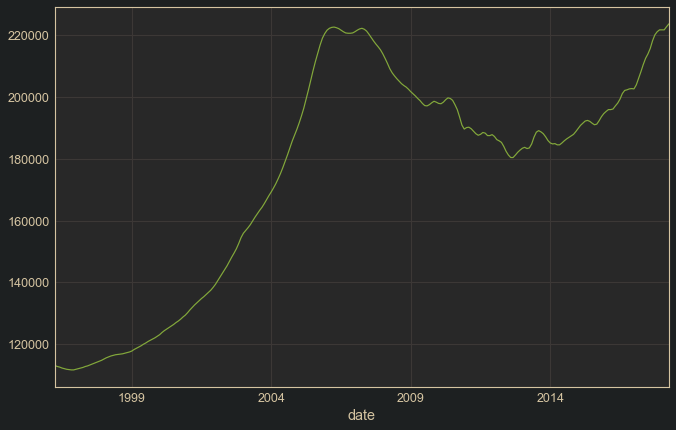

In [95]:
groups.get_group(results_new.index[0]).set_index('date').value.plot()

In [496]:
export = results_new.sort_values(by='lower_conf_mean', ascending=False).head()

In [55]:
results_new = pd.read_csv('data/modeling_results2.csv').rename(columns={'Unnamed: 0':''}).set_index('')
results_new.head()

,sigma2,predicted_mean,lower_conf_mean
,,,
1001,0.000003,0.001691,-0.010749
1002,0.000002,0.003038,-0.011450
1005,0.000006,0.003216,-0.017801
1007,0.000002,0.001476,-0.008335
1008,0.000008,0.003360,-0.011446


In [56]:
sorted_results = results_new.sort_values(by='lower_conf_mean', ascending=False)
sorted_results.head()

,sigma2,predicted_mean,lower_conf_mean
,,,
73529,0.000014,0.043537,0.008327
47460,0.000005,0.021833,0.005160
72837,0.000006,0.027721,0.005062
74855,0.000011,0.026970,0.004056
74948,0.000008,0.018968,0.003673


In [497]:
export

,sigma2,predicted_mean,lower_conf_mean
73529,1.43546e-05,0.0435375,0.00832742
47460,5.19021e-06,0.0218326,0.00516044
72837,6.45291e-06,0.0277214,0.0050618
74855,1.07743e-05,0.0269697,0.00405584
74948,7.54015e-06,0.0189675,0.00367256


In [74]:
import dataframe_image as di

In [499]:
di.export(export, 'images/results_head.png')

In [100]:
best_lower_conf = results_new.sort_values(by='lower_conf_mean', ascending=False)[:100]
best_lower_conf.head()

,sigma2,predicted_mean,lower_conf_mean
73529,1.43546e-05,0.0435375,0.00832742
47460,5.19021e-06,0.0218326,0.00516044
72837,6.45291e-06,0.0277214,0.0050618
74855,1.07743e-05,0.0269697,0.00405584
74948,7.54015e-06,0.0189675,0.00367256


In [101]:
zipcode_info = pd.DataFrame()

for zipcode in best_lower_conf.index:
    group = groups.get_group(zipcode)
    group['Region Name'] = group['Metro'] + ', ' + group['State']
    zipcode_info = pd.concat([zipcode_info,
                              pd.DataFrame(group.iloc[0][['Region Name', 'zipcode', 'City', 'State']]).T
                             ], axis=0)
    
zipcode_info.head()

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """


,Region Name,zipcode,City,State
10847,"Duncan, OK",73529,Comanche,OK
7807,"Bloomington, IN",47460,Spencer,IN
9155,"Russellville, AR",72837,Dover,AR
11004,"Oklahoma City, OK",74855,Meeker,OK
7803,"Fort Smith, OK",74948,Muldrow,OK


In [63]:
len(sorted_results.index)

12063

In [73]:
# Take our top 200 contenders and create empty dataframe for zipcode info
top200 = sorted_results.iloc[:200]
zipcode_info = pd.DataFrame()

# Generate a zipcode info dataframe row by row
for zipcode in top200.index:
    group = groups.get_group(zipcode)
    group['Region Name'] = group['Metro'] + ', ' + group['State']
    zipcode_info = pd.concat([zipcode_info,
                              pd.DataFrame(group.iloc[0][['Region Name', 
                                                          'zipcode', 
                                                          'City', 
                                                          'State']]).T
                             ], axis=0)
    
# Merge the desired P2R columns to the zipcode info dataframe
zipcode_info = zipcode_info.merge(p2r[['Region Name', 'P2R', 'National Average']], 
                                  left_index=True,
                                  left_on='Region Name',
                                  right_on='Region Name',
                                  how='left'
                                 )

# Merge the zipcode info to our top 200 results and set index to zipcode
results_new = top200.merge(zipcode_info,
                           left_index=True,
                           right_on='zipcode'
                          ).set_index('zipcode')

results_new.head()

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
73529,0.000014,0.043537,0.008327,"Duncan, OK",Comanche,OK,NaN,NaN
47460,0.000005,0.021833,0.005160,"Bloomington, IN",Spencer,IN,10.50,11.44
72837,0.000006,0.027721,0.005062,"Russellville, AR",Dover,AR,NaN,NaN
74855,0.000011,0.026970,0.004056,"Oklahoma City, OK",Meeker,OK,10.57,11.44
74948,0.000008,0.018968,0.003673,"Fort Smith, OK",Muldrow,OK,NaN,NaN


In [75]:
export = results_new.head()
di.export(export, 'images/results_merged.png')

In [76]:
profitable_rent = results_new[results_new['P2R'] < results_new['National Average']]
profitable_rent.head(10)

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
47460,0.000005,0.021833,0.005160,"Bloomington, IN",Spencer,IN,10.50,11.44
74855,0.000011,0.026970,0.004056,"Oklahoma City, OK",Meeker,OK,10.57,11.44
78210,0.000009,0.020198,0.003028,"San Antonio, TX",San Antonio,TX,9.87,11.44
37020,0.000005,0.015791,0.002065,"Shelbyville, TN",Bell Buckle,TN,10.49,11.44
78242,0.000008,0.019000,0.001709,"San Antonio, TX",San Antonio,TX,9.87,11.44
75228,0.000005,0.013274,0.000606,"Dallas-Fort Worth, TX",Dallas,TX,10.69,11.44
74864,0.000007,0.025693,-0.000127,"Oklahoma City, OK",Prague,OK,10.57,11.44
39629,0.000012,0.030397,-0.000176,"Brookhaven, MS",Bogue Chitto,MS,9.48,11.44
46770,0.000005,0.010020,-0.000453,"Fort Wayne, IN",Markle,IN,9.07,11.44


In [77]:
export = profitable_rent.head(10)
di.export(export, 'images/profitable_rent_head.png')

In [65]:
results_new = pd.concat([sorted_results, zipcode_info], axis=1)
results_new.head()

ValueError: Shape of passed values is (625402, 8), indices imply (24126, 8)

In [64]:
len(zipcode_info.index)

12063

In [ ]:
results_new.head()

In [48]:
sorted_results.head()

,sigma2,predicted_mean,lower_conf_mean,City,State,Region Name
,,,,,,
73529,0.000014,0.043537,0.008327,Comanche,OK,"Duncan, OK"
47460,0.000005,0.021833,0.005160,Spencer,IN,"Bloomington, IN"
72837,0.000006,0.027721,0.005062,Dover,AR,"Russellville, AR"
74855,0.000011,0.026970,0.004056,Meeker,OK,"Oklahoma City, OK"
74948,0.000008,0.018968,0.003673,Muldrow,OK,"Fort Smith, OK"


In [105]:
joined = best_lower_conf.merge(zipcode_info, 
                               left_index=True, 
                               #left_on=, 
                               right_on='zipcode')
joined.head()

,sigma2,predicted_mean,lower_conf_mean,Region Name,zipcode,City,State
10847,1.43546e-05,0.0435375,0.00832742,"Duncan, OK",73529,Comanche,OK
7807,5.19021e-06,0.0218326,0.00516044,"Bloomington, IN",47460,Spencer,IN
9155,6.45291e-06,0.0277214,0.0050618,"Russellville, AR",72837,Dover,AR
11004,1.07743e-05,0.0269697,0.00405584,"Oklahoma City, OK",74855,Meeker,OK
7803,7.54015e-06,0.0189675,0.00367256,"Fort Smith, OK",74948,Muldrow,OK


In [58]:
joined = sorted_results.merge(zipcode_info, 
                               left_index=True, 
                               #left_on=, 
                               right_on='zipcode')
joined.head()

,sigma2,predicted_mean,lower_conf_mean,Region Name,zipcode,City,State
10847,0.000014,0.043537,0.008327,"Duncan, OK",73529,Comanche,OK
7807,0.000005,0.021833,0.005160,"Bloomington, IN",47460,Spencer,IN
9155,0.000006,0.027721,0.005062,"Russellville, AR",72837,Dover,AR
11004,0.000011,0.026970,0.004056,"Oklahoma City, OK",74855,Meeker,OK
7803,0.000008,0.018968,0.003673,"Fort Smith, OK",74948,Muldrow,OK


In [109]:
joined2 = joined.merge(p2r[['Region Name', 'P2R', 'National Average']], 
                       left_index=True,
                       left_on='Region Name',
                       right_on='Region Name',
                       how='left'
                      )
joined2.head(15)

,sigma2,predicted_mean,lower_conf_mean,Region Name,zipcode,City,State,P2R,National Average
NaN,1.43546e-05,0.0435375,0.00832742,"Duncan, OK",73529,Comanche,OK,NaN,NaN
514.0,5.19021e-06,0.0218326,0.00516044,"Bloomington, IN",47460,Spencer,IN,10.50,11.44
NaN,6.45291e-06,0.0277214,0.0050618,"Russellville, AR",72837,Dover,AR,NaN,NaN
192.0,1.07743e-05,0.0269697,0.00405584,"Oklahoma City, OK",74855,Meeker,OK,10.57,11.44
NaN,7.54015e-06,0.0189675,0.00367256,"Fort Smith, OK",74948,Muldrow,OK,NaN,NaN
117.0,8.70826e-06,0.0201983,0.00302791,"San Antonio, TX",78210,San Antonio,TX,9.87,11.44
NaN,5.11081e-06,0.0194164,0.00228131,"Fort Smith, OK",74955,Sallisaw,OK,NaN,NaN
96.0,5.18759e-06,0.0157915,0.00206525,"Shelbyville, TN",37020,Bell Buckle,TN,10.49,11.44
117.0,7.60483e-06,0.0190003,0.00170922,"San Antonio, TX",78242,San Antonio,TX,9.87,11.44
213.0,3.03423e-06,0.0109124,0.00146294,"Nashville, TN",37130,Murfreesboro,TN,12.05,11.44


In [110]:
joined2.P2R.isna().sum()

30

In [114]:
# Unfortunately, many of our top performers do not have corresponding data in the p2r dataframe,
# however, enough do to make some good recommendations. The reason to focus on the zip codes
# which we have info for is the same as before, because the recommendations given for zip codes
# which we have full information on are inherently better than recommendations given on zip codes
# that we do not know as much about.
profitable_rent = joined2[joined2.P2R < joined2['National Average']]
profitable_rent

,sigma2,predicted_mean,lower_conf_mean,Region Name,zipcode,City,State,P2R,National Average
514.0,5.19021e-06,0.0218326,0.00516044,"Bloomington, IN",47460,Spencer,IN,10.50,11.44
192.0,1.07743e-05,0.0269697,0.00405584,"Oklahoma City, OK",74855,Meeker,OK,10.57,11.44
117.0,8.70826e-06,0.0201983,0.00302791,"San Antonio, TX",78210,San Antonio,TX,9.87,11.44
96.0,5.18759e-06,0.0157915,0.00206525,"Shelbyville, TN",37020,Bell Buckle,TN,10.49,11.44
117.0,7.60483e-06,0.0190003,0.00170922,"San Antonio, TX",78242,San Antonio,TX,9.87,11.44
444.0,5.11607e-06,0.0132735,0.000605781,"Dallas-Fort Worth, TX",75228,Dallas,TX,10.69,11.44
192.0,7.47371e-06,0.0256926,-0.000127353,"Oklahoma City, OK",74864,Prague,OK,10.57,11.44
504.0,1.20896e-05,0.0303966,-0.000175972,"Brookhaven, MS",39629,Bogue Chitto,MS,9.48,11.44
387.0,4.55413e-06,0.0100204,-0.000452864,"Fort Wayne, IN",46770,Markle,IN,9.07,11.44
444.0,1.4679e-06,0.00534872,-0.000536398,"Dallas-Fort Worth, TX",75028,Flower Mound,TX,10.69,11.44


In [115]:
# Let's see what the average mean predicted mean of the zipcodes in our list is
profitable_rent.predicted_mean.mean()

0.010683654279092247

In [315]:
prof_rent_filter = profitable_rent[(profitable_rent.predicted_mean > .01)
                                   #&(profitable_rent.sigma2 < profitable_rent.sigma2.mean())
                                  ].sort_values('lower_conf_mean', ascending=False)
prof_rent_filter

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
47460,5.19021e-06,0.0218326,0.00516044,"Bloomington, IN",Spencer,IN,10.50,11.44
74855,1.07743e-05,0.0269697,0.00405584,"Oklahoma City, OK",Meeker,OK,10.57,11.44
78210,8.70826e-06,0.0201983,0.00302791,"San Antonio, TX",San Antonio,TX,9.87,11.44
37020,5.18759e-06,0.0157915,0.00206525,"Shelbyville, TN",Bell Buckle,TN,10.49,11.44
78242,7.60483e-06,0.0190003,0.00170922,"San Antonio, TX",San Antonio,TX,9.87,11.44
75228,5.11607e-06,0.0132735,0.000605781,"Dallas-Fort Worth, TX",Dallas,TX,10.69,11.44
74864,7.47371e-06,0.0256926,-0.000127353,"Oklahoma City, OK",Prague,OK,10.57,11.44
39629,1.20896e-05,0.0303966,-0.000175972,"Brookhaven, MS",Bogue Chitto,MS,9.48,11.44
46770,4.55413e-06,0.0100204,-0.000452864,"Fort Wayne, IN",Markle,IN,9.07,11.44


In [ ]:
# This lets us know that anything over 1% predicted mean return is better than average on our
# list

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
47460,5.19021e-06,0.0218326,0.00516044,"Bloomington, IN",Spencer,IN,10.50,11.44
74855,1.07743e-05,0.0269697,0.00405584,"Oklahoma City, OK",Meeker,OK,10.57,11.44
78210,8.70826e-06,0.0201983,0.00302791,"San Antonio, TX",San Antonio,TX,9.87,11.44
37020,5.18759e-06,0.0157915,0.00206525,"Shelbyville, TN",Bell Buckle,TN,10.49,11.44
78242,7.60483e-06,0.0190003,0.00170922,"San Antonio, TX",San Antonio,TX,9.87,11.44


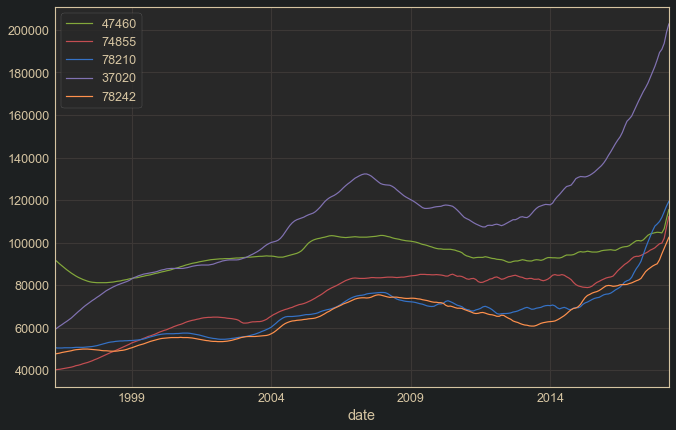

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
75228,5.11607e-06,0.0132735,0.000605781,"Dallas-Fort Worth, TX",Dallas,TX,10.69,11.44
74864,7.47371e-06,0.0256926,-0.000127353,"Oklahoma City, OK",Prague,OK,10.57,11.44
39629,1.20896e-05,0.0303966,-0.000175972,"Brookhaven, MS",Bogue Chitto,MS,9.48,11.44
46770,4.55413e-06,0.0100204,-0.000452864,"Fort Wayne, IN",Markle,IN,9.07,11.44
76148,4.0583e-06,0.0109345,-0.00077464,"Dallas-Fort Worth, TX",Watauga,TX,10.69,11.44


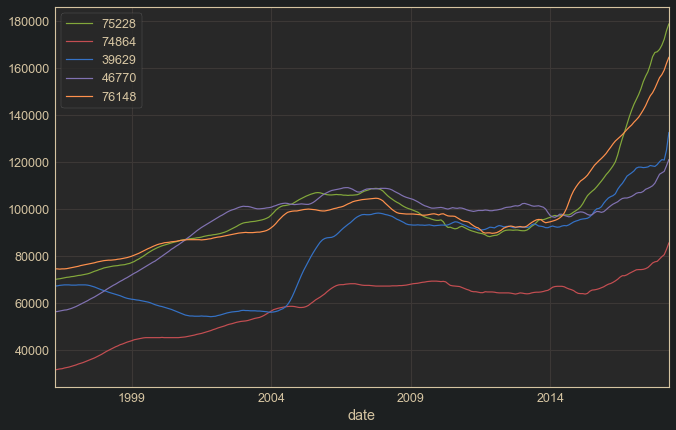

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
78155,4.69797e-06,0.0106408,-0.000807561,"San Antonio, TX",Seguin,TX,9.87,11.44
76009,7.86093e-06,0.0130064,-0.00126951,"Dallas-Fort Worth, TX",Alvarado,TX,10.69,11.44
47940,5.0895e-06,0.0124771,-0.00133793,"Crawfordsville, IN",Darlington,IN,8.69,11.44
38456,7.8672e-06,0.0170079,-0.00157352,"Lawrenceburg, TN",Ethridge,TN,8.54,11.44
28227,2.30273e-06,0.0120218,-0.00161658,"Charlotte, NC",Mint Hill,NC,11.30,11.44


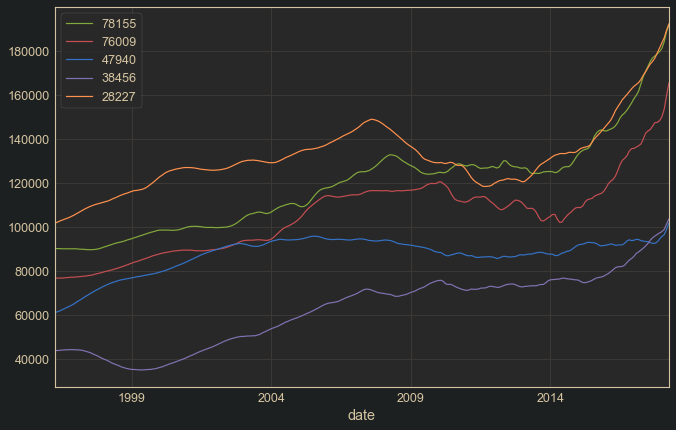

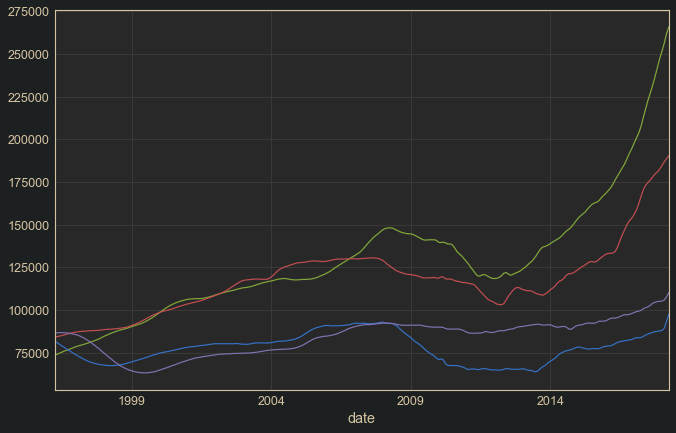

In [395]:
# Let's take a look at some of these zips
view_zips = []
for i, zipcode in enumerate(prof_rent_filter.index):
    group = groups.get_group(zipcode).set_index('date').value
    group.plot(label=zipcode)
    view_zips.append(zipcode)
    
    if (i+1) % 5 == 0 or i == len(prof_rent_filter):
        display(prof_rent_filter.loc[view_zips])
        plt.legend()
        plt.show()
        view_zips = []

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
47460,5.19021e-06,0.0218326,0.00516044,"Bloomington, IN",Spencer,IN,10.50,11.44
74855,1.07743e-05,0.0269697,0.00405584,"Oklahoma City, OK",Meeker,OK,10.57,11.44
78210,8.70826e-06,0.0201983,0.00302791,"San Antonio, TX",San Antonio,TX,9.87,11.44
37020,5.18759e-06,0.0157915,0.00206525,"Shelbyville, TN",Bell Buckle,TN,10.49,11.44
78242,7.60483e-06,0.0190003,0.00170922,"San Antonio, TX",San Antonio,TX,9.87,11.44


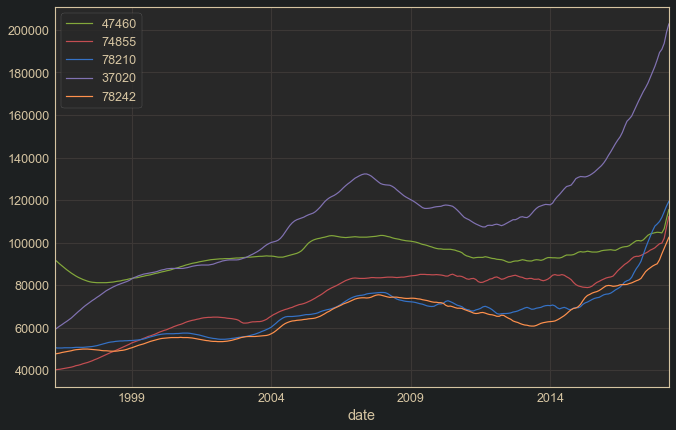

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
75228,5.11607e-06,0.0132735,0.000605781,"Dallas-Fort Worth, TX",Dallas,TX,10.69,11.44
74864,7.47371e-06,0.0256926,-0.000127353,"Oklahoma City, OK",Prague,OK,10.57,11.44
39629,1.20896e-05,0.0303966,-0.000175972,"Brookhaven, MS",Bogue Chitto,MS,9.48,11.44
46770,4.55413e-06,0.0100204,-0.000452864,"Fort Wayne, IN",Markle,IN,9.07,11.44
75028,1.4679e-06,0.00534872,-0.000536398,"Dallas-Fort Worth, TX",Flower Mound,TX,10.69,11.44


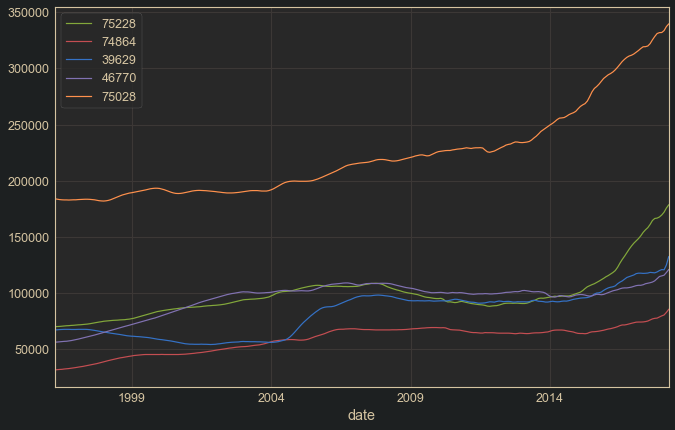

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
43209,3.4257e-06,0.00826195,-0.000691597,"Columbus, OH",Bexley,OH,10.29,11.44
76148,4.0583e-06,0.0109345,-0.00077464,"Dallas-Fort Worth, TX",Watauga,TX,10.69,11.44
78155,4.69797e-06,0.0106408,-0.000807561,"San Antonio, TX",Seguin,TX,9.87,11.44
76028,2.28837e-06,0.00823359,-0.000980083,"Dallas-Fort Worth, TX",Burleson,TX,10.69,11.44
75023,1.89103e-06,0.00717784,-0.00106198,"Dallas-Fort Worth, TX",Plano,TX,10.69,11.44


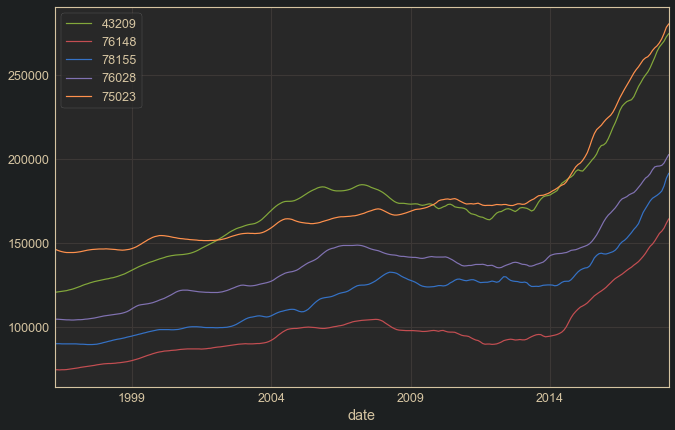

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
75080,2.29021e-06,0.00873268,-0.00109276,"Dallas-Fort Worth, TX",Richardson,TX,10.69,11.44
50321,2.45779e-06,0.00607457,-0.00117361,"Des Moines, IA",Des Moines,IA,10.83,11.44
76009,7.86093e-06,0.0130064,-0.00126951,"Dallas-Fort Worth, TX",Alvarado,TX,10.69,11.44
75067,1.96019e-06,0.00703801,-0.00127786,"Dallas-Fort Worth, TX",Lewisville,TX,10.69,11.44
47940,5.0895e-06,0.0124771,-0.00133793,"Crawfordsville, IN",Darlington,IN,8.69,11.44


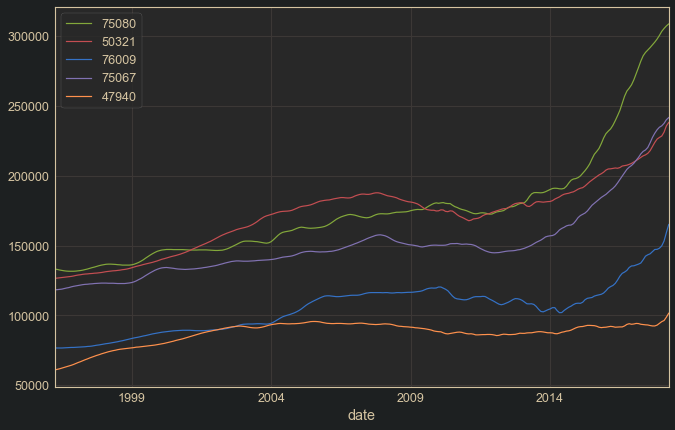

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
45504,3.13559e-06,0.00727605,-0.00135124,"Springfield, OH",Springfield,OH,10.15,11.44
76014,3.68506e-06,0.0098373,-0.00147476,"Dallas-Fort Worth, TX",Arlington,TX,10.69,11.44
46723,2.41545e-06,0.00657202,-0.00150878,"Fort Wayne, IN",Churubusco,IN,9.07,11.44
38456,7.8672e-06,0.0170079,-0.00157352,"Lawrenceburg, TN",Ethridge,TN,8.54,11.44
28227,2.30273e-06,0.0120218,-0.00161658,"Charlotte, NC",Mint Hill,NC,11.30,11.44


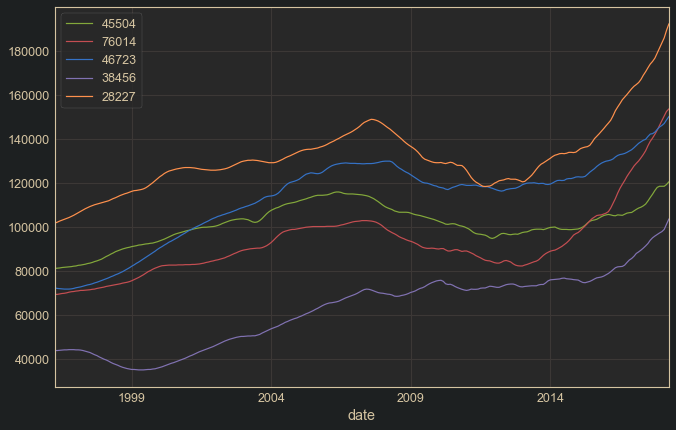

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
37341,2.49385e-06,0.00537877,-0.00165759,"Chattanooga, TN",Harrison,TN,9.84,11.44
28205,4.29034e-06,0.0126758,-0.00167375,"Charlotte, NC",Charlotte,NC,11.30,11.44
75074,2.47665e-06,0.00744436,-0.001697,"Dallas-Fort Worth, TX",Plano,TX,10.69,11.44
75062,5.25497e-06,0.0114141,-0.00170671,"Dallas-Fort Worth, TX",Irving,TX,10.69,11.44
15673,4.29469e-06,0.00645879,-0.00174042,"Pittsburgh, PA",North Apollo,PA,10.46,11.44


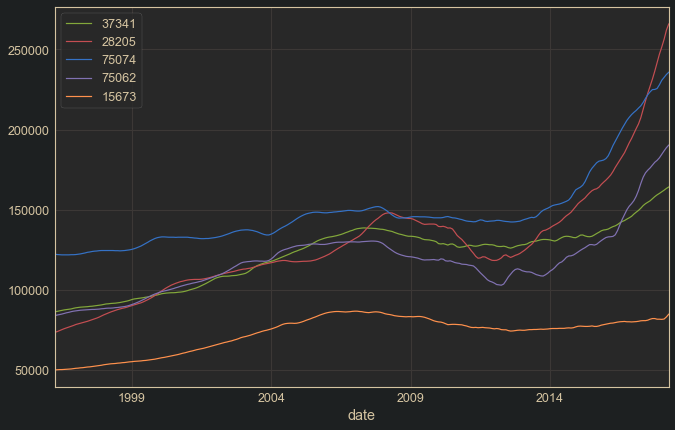

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
77504,3.17194e-06,0.00600177,-0.0017878,"Houston, TX",Pasadena,TX,9.28,11.44
46501,6.08944e-06,0.00941173,-0.00181272,"Plymouth, IN",Argos,IN,9.64,11.44
43081,2.11369e-06,0.00584705,-0.00181275,"Columbus, OH",Westerville,OH,10.29,11.44
76001,1.84079e-06,0.00669281,-0.00183939,"Dallas-Fort Worth, TX",Arlington,TX,10.69,11.44
28110,3.54731e-06,0.0096062,-0.00186768,"Charlotte, NC",Monroe,NC,11.30,11.44


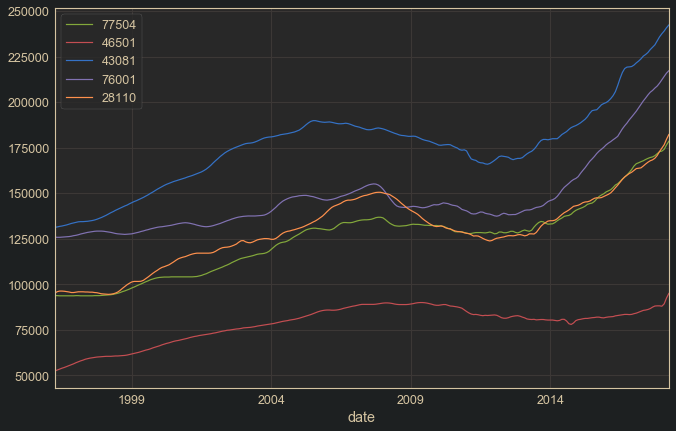

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
43214,1.9938e-06,0.00682957,-0.00187416,"Columbus, OH",Columbus,OH,10.29,11.44
75075,1.97521e-06,0.00654819,-0.00190168,"Dallas-Fort Worth, TX",Plano,TX,10.69,11.44
45241,2.28972e-06,0.00670905,-0.00201574,"Cincinnati, OH",Sharonville,OH,9.91,11.44
47243,1.23289e-05,0.0224516,-0.00201867,"Madison, IN",Hanover,IN,9.50,11.44
75044,2.87147e-06,0.00829733,-0.00203192,"Dallas-Fort Worth, TX",Garland,TX,10.69,11.44


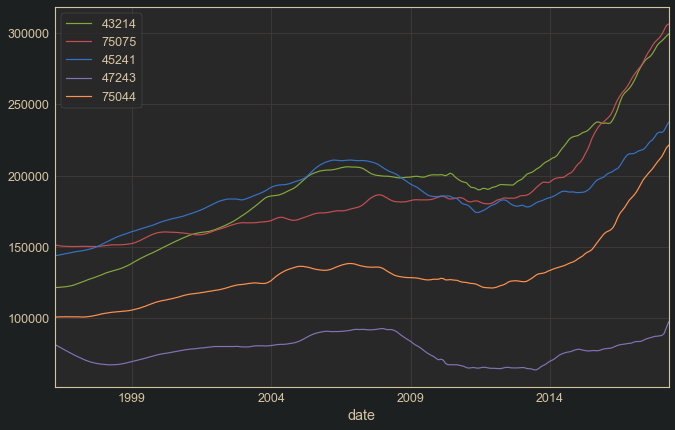

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
74114,2.28281e-06,0.00450322,-0.00203894,"Tulsa, OK",Tulsa,OK,10.13,11.44
75069,2.88536e-06,0.00715413,-0.00205803,"Dallas-Fort Worth, TX",McKinney,TX,10.69,11.44
43123,2.84214e-06,0.00594235,-0.00207905,"Columbus, OH",Grove City,OH,10.29,11.44
77502,3.83937e-06,0.00785568,-0.00208446,"Houston, TX",Pasadena,TX,9.28,11.44
46504,5.22453e-06,0.0160365,-0.00213821,"Plymouth, IN",Bourbon,IN,9.64,11.44


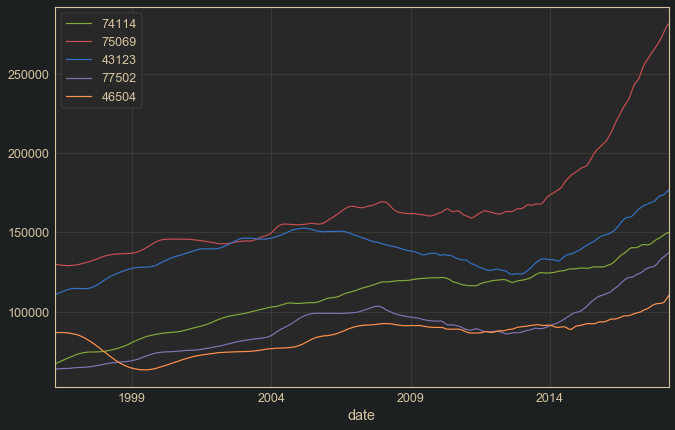

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
64086,2.33148e-06,0.00685529,-0.00213852,"Kansas City, MO",Lees Summit,MO,9.98,11.44
29376,3.20765e-06,0.00699185,-0.00214823,"Spartanburg, SC",Roebuck,SC,8.92,11.44
44685,1.37203e-06,0.00585124,-0.00215691,"Canton, OH",Uniontown,OH,9.91,11.44
43235,2.16272e-06,0.00567702,-0.0021651,"Columbus, OH",Columbus,OH,10.29,11.44
76022,2.77559e-06,0.0073747,-0.00218093,"Dallas-Fort Worth, TX",Bedford,TX,10.69,11.44


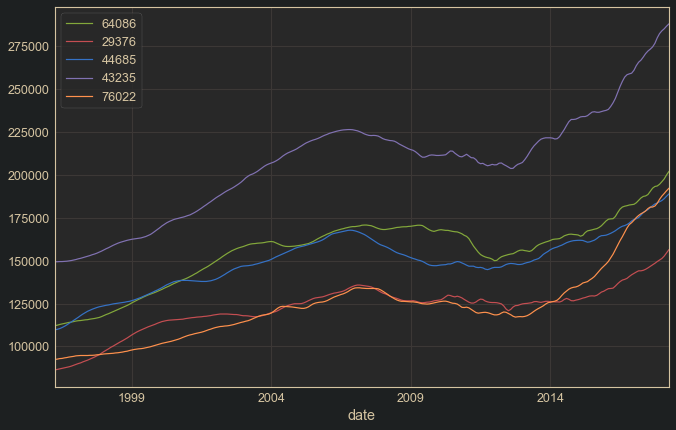

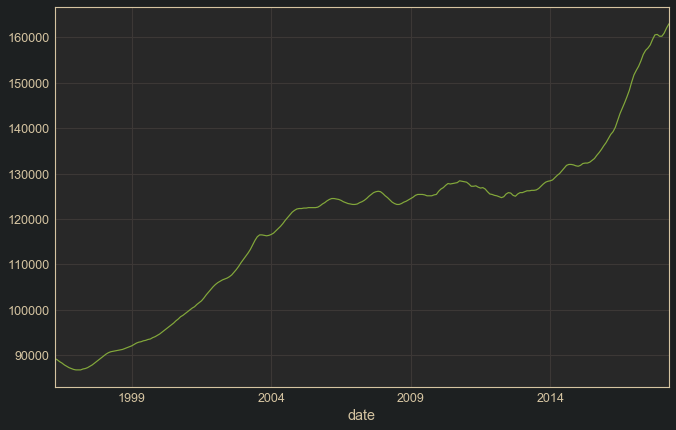

In [113]:
# Let's take a look at some of these zips
view_zips = []
for i, zipcode in enumerate(profitable_rent.zipcode):
    group = groups.get_group(zipcode).set_index('date').value
    group.plot(label=zipcode)
    view_zips.append(zipcode)
    
    if (i+1) % 5 == 0 or i == len(profitable_rent):
        display(profitable_rent.set_index('zipcode').loc[view_zips])
        plt.legend()
        plt.show()
        view_zips = []

In [131]:
profitable_rent.set_index('zipcode', inplace=True)

It looks like our good zip codes have sigma2 that hovers in the order of 1e-6. Many of them have below average p2r. It's time to look at some individual models for these zip codes.

It looks like this method of model comparison has led us to where we set out to be in the first notebook, which is finding zip codes which showed resilience during the crash, and also strong recent growth. This time, we were able to make comparisons which included expected variance, so that we have left out zip codes that will have unsatisfactorily wide confidence intervals.

(1, 1, 4)(1, 0, 1, 12) model with no constant
                                      SARIMAX Results                                       
Dep. Variable:                  spencer_log_returns   No. Observations:                  264
Model:             SARIMAX(1, 1, 4)x(1, 0, [1], 12)   Log Likelihood                1138.593
Date:                              Mon, 14 Sep 2020   AIC                          -2261.186
Time:                                      16:06:55   BIC                          -2233.143
Sample:                                  05-01-1996   HQIC                         -2249.894
                                       - 04-01-2018                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9713      0.078     12.395      0.0

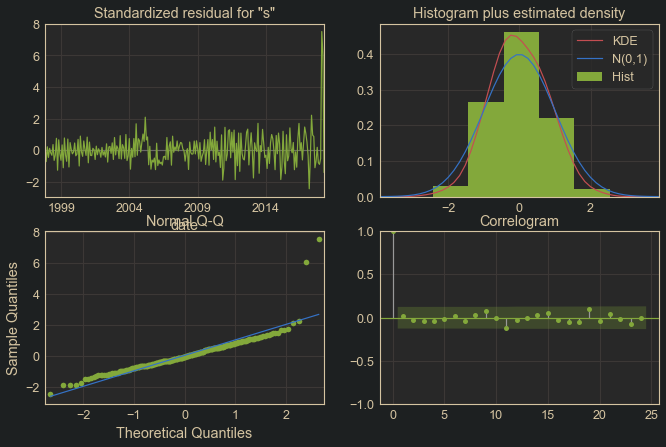

In [316]:
spencer = groups.get_group(profitable_rent.index[0]).set_index('date').value
spencer_returns = np.log(spencer).diff().dropna().asfreq('MS')
spencer_returns.name = 'spencer_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(spencer_returns, freq=12)
model = SARIMAX(spencer_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 5.318140875457221e-06


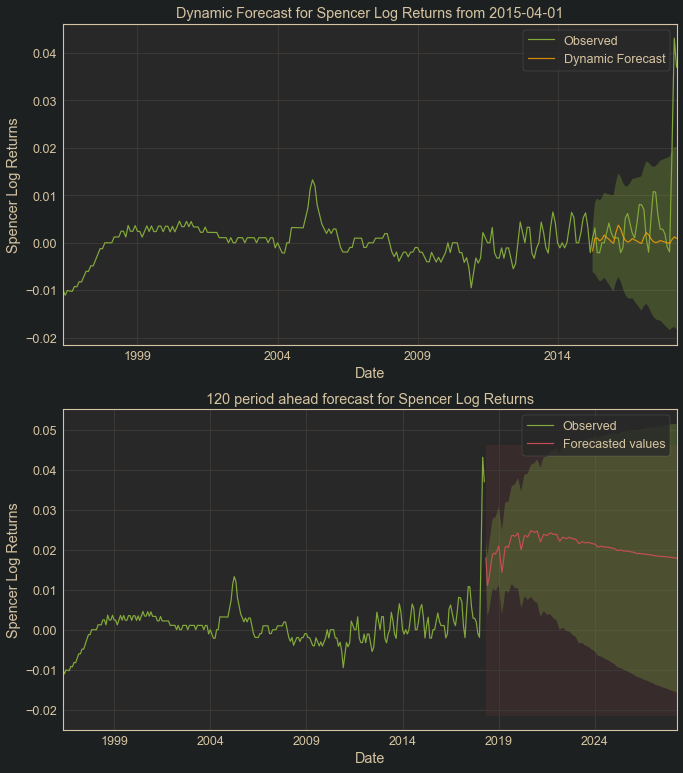

In [318]:
tsa.plot_sarimax_predictions(res, spencer_returns, periods_ahead=120, dynamic='2015-04-01')

It looks like this zip code has had a very large spike in monthly returns recently, which is throwing the near-term projections upwards. Let's continue to look down our list. I notice now that a few of our contenders have very sharp upward spikes for the last month on record, which is similar to what we saw here with Spencer. I'm not sure what is causing these large spikes, but it could just be that it is a matter of odds, and that a volatile peak right at the end of our data period has a large impact on the forward projection of the model. In this case the model is fit fairly well, with non-autocorrelated residuals, but has a bit of a problem with heteroscedasticity and with a large outlier in the residuals.

In [255]:
# Bogue Chitto is too small of a town to consider. I want to look at Duncan, OK, which didn't
# have p2r data but a look at Zillow shows that it is good

(4, 1, 2)(1, 0, 0, 12) model with no constant
                                      SARIMAX Results                                      
Dep. Variable:                  duncan_log_returns   No. Observations:                  264
Model:             SARIMAX(4, 1, 2)x(1, 0, [], 12)   Log Likelihood                1026.576
Date:                             Mon, 14 Sep 2020   AIC                          -2037.152
Time:                                     17:12:35   BIC                          -2009.077
Sample:                                 05-01-1996   HQIC                         -2025.848
                                      - 04-01-2018                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0015      0.055     -0.027      0.978      

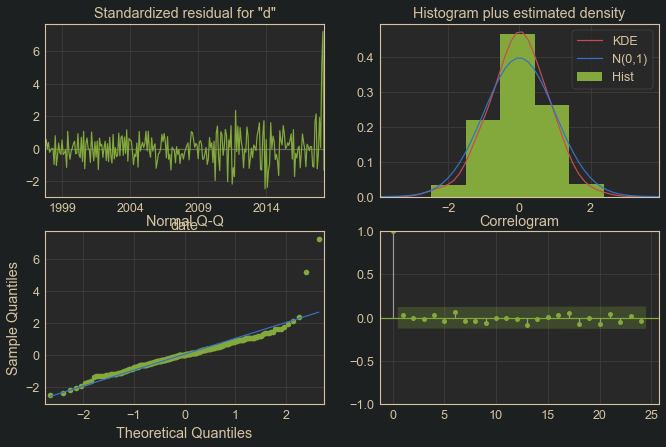

In [390]:
view_zip = groups.get_group(73529).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'duncan_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 1.4194656129582083e-05


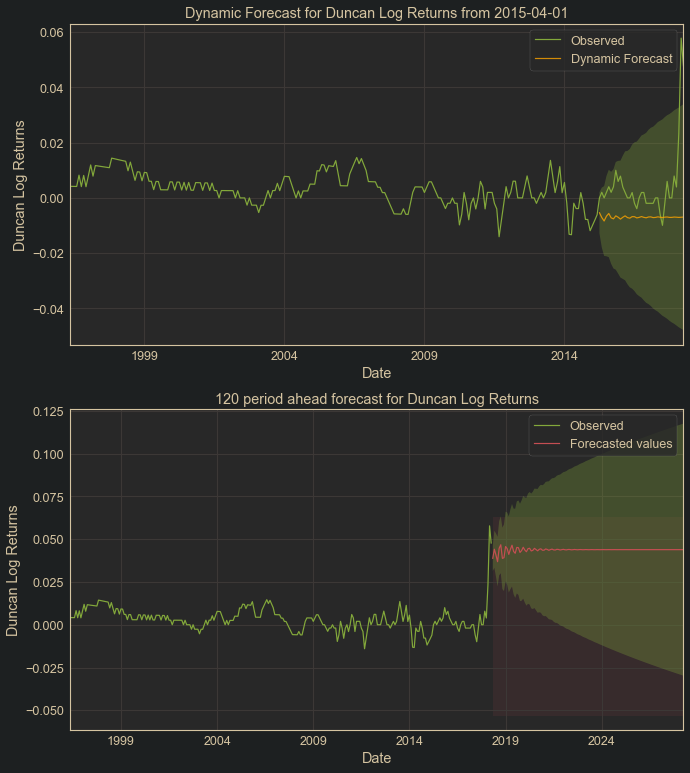

In [392]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=120, dynamic='2015-04-01')

(5, 1, 1)(0, 0, 1, 12) model with no constant
                                     SARIMAX Results                                      
Dep. Variable:            bell_buckle_log_returns   No. Observations:                  264
Model:             SARIMAX(5, 1, 1)x(0, 0, 1, 12)   Log Likelihood                1163.007
Date:                            Thu, 17 Sep 2020   AIC                          -2310.014
Time:                                    15:41:41   BIC                          -2281.875
Sample:                                05-01-1996   HQIC                         -2298.688
                                     - 04-01-2018                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7656      0.199      3.839      0.000       0.375  

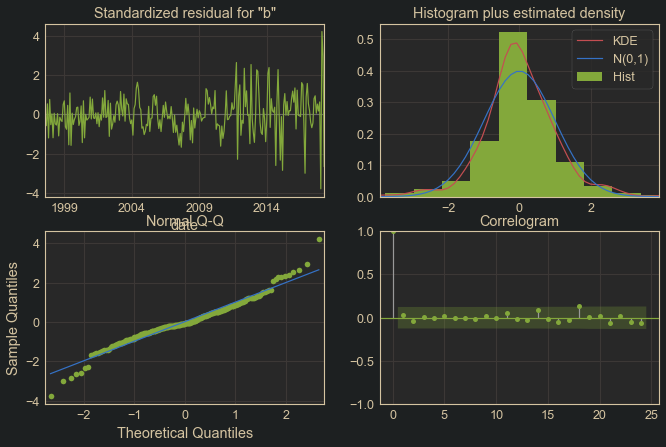

In [123]:
view_zip = groups.get_group(37020).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'bell_buckle_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 5.130783456393611e-06


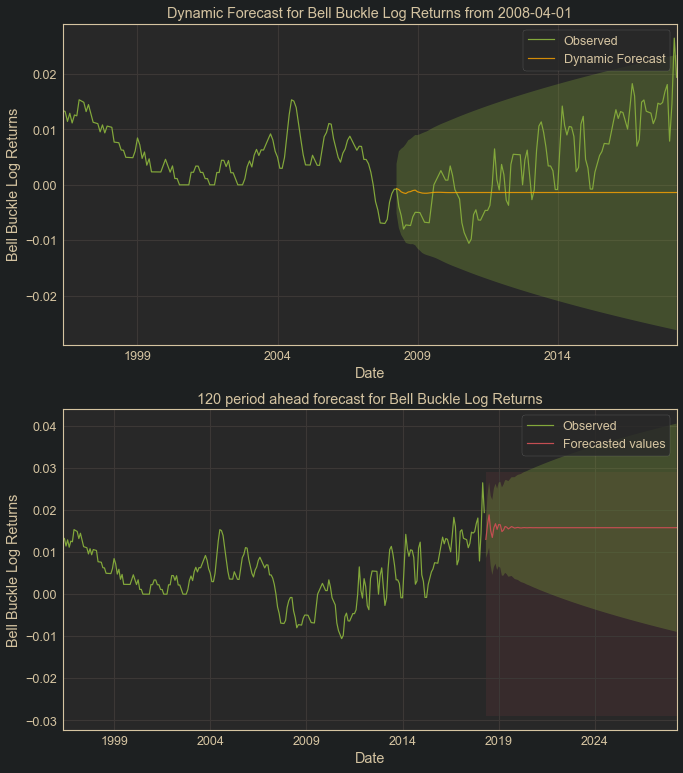

In [102]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=120, dynamic='2008-04-01')

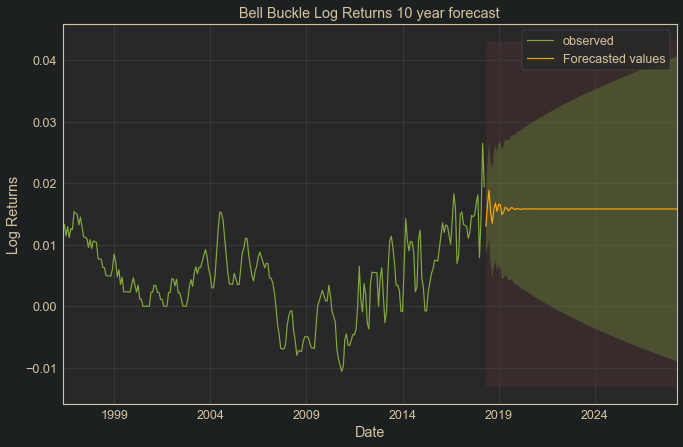

In [126]:
periods_ahead = 120
constant = pd.Series(np.ones(periods_ahead))

# Get forecast
prediction = res.get_forecast(periods_ahead, exog=constant)

# Get confidence intervals of forecast
pred_conf = prediction.conf_int()

# Plot future predictions with confidence intervals
ax = view_zip_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax, color='orange')

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_title('Bell Buckle Log Returns 10 year forecast')
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

In [259]:
# Duncan is another example of a zip code with a great forecast because of a recent giant
# swing in monthly returns.

(2, 1, 0)(0, 0, 1, 12) model with no constant
                                      SARIMAX Results                                       
Dep. Variable:                   meeker_log_returns   No. Observations:                  264
Model:             SARIMAX(2, 1, 0)x(0, 0, [1], 12)   Log Likelihood                1073.029
Date:                              Mon, 14 Sep 2020   AIC                          -2138.058
Time:                                      17:07:00   BIC                          -2123.972
Sample:                                  05-01-1996   HQIC                         -2132.389
                                       - 04-01-2018                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1613      0.031      5.251      0.0

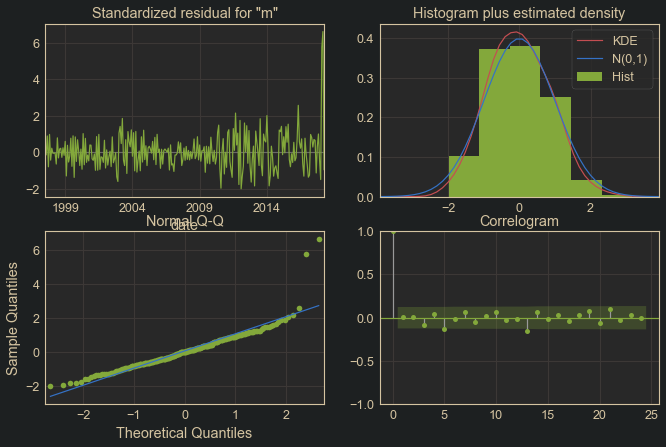

In [376]:
view_zip = groups.get_group(74855).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'meeker_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 1.0915816058286924e-05


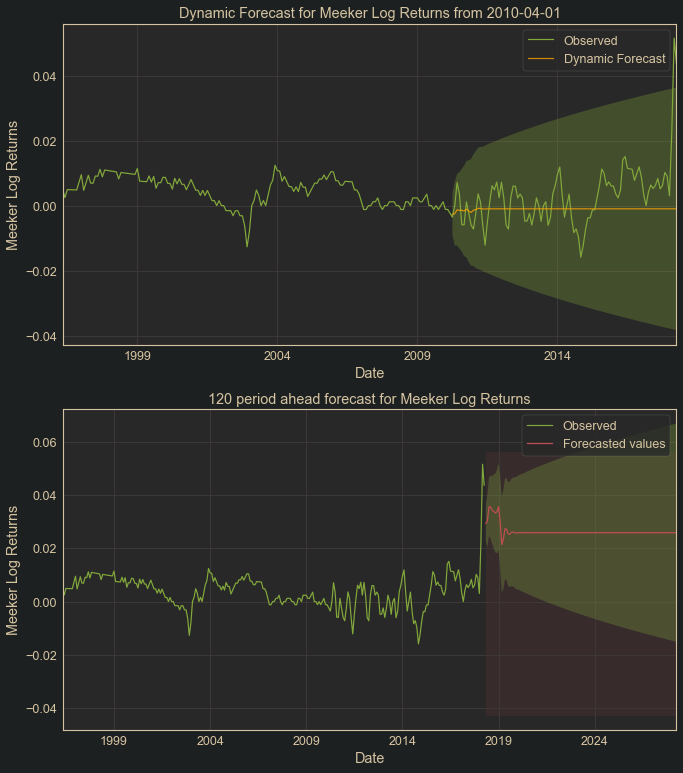

In [379]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=120, dynamic='2010-04-01')

(2, 1, 1)(0, 0, 2, 12) model with no constant
                                        SARIMAX Results                                        
Dep. Variable:                     hanover_log_returns   No. Observations:                  264
Model:             SARIMAX(2, 1, 1)x(0, 0, [1, 2], 12)   Log Likelihood                 998.514
Date:                                 Mon, 14 Sep 2020   AIC                          -1985.028
Time:                                         17:08:49   BIC                          -1964.219
Sample:                                     05-01-1996   HQIC                         -1976.641
                                          - 04-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0562      0

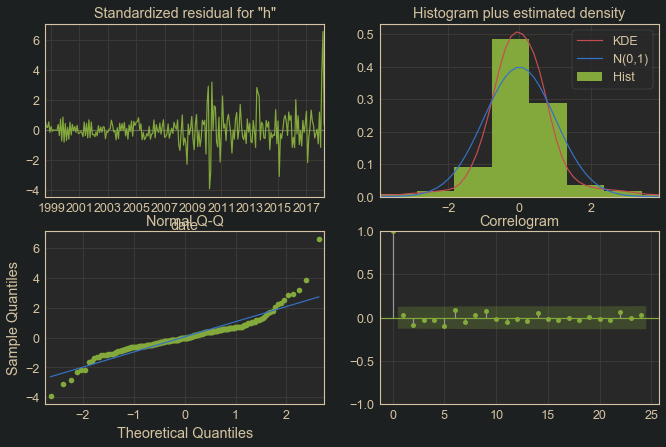

In [380]:
view_zip = groups.get_group(47243).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'hanover_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 1.2708026337355608e-05


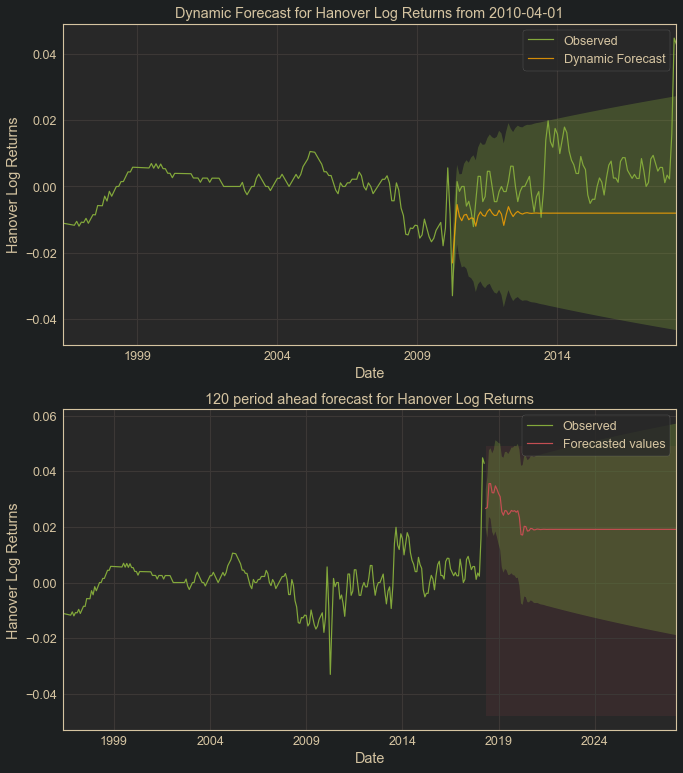

In [382]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=120, dynamic='2010-04-01')

(2, 1, 2)(0, 0, 0, 0) model with no constant
                                SARIMAX Results                                
Dep. Variable:     bourbon_log_returns   No. Observations:                  264
Model:                SARIMAX(2, 1, 2)   Log Likelihood                1212.745
Date:                 Mon, 14 Sep 2020   AIC                          -2415.491
Time:                         17:09:40   BIC                          -2397.687
Sample:                     05-01-1996   HQIC                         -2408.334
                          - 04-01-2018                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6596      0.085      7.767      0.000       0.493       0.826
ar.L2         -0.7422      0.086     -8.635      0.000      -0.911      -0.574

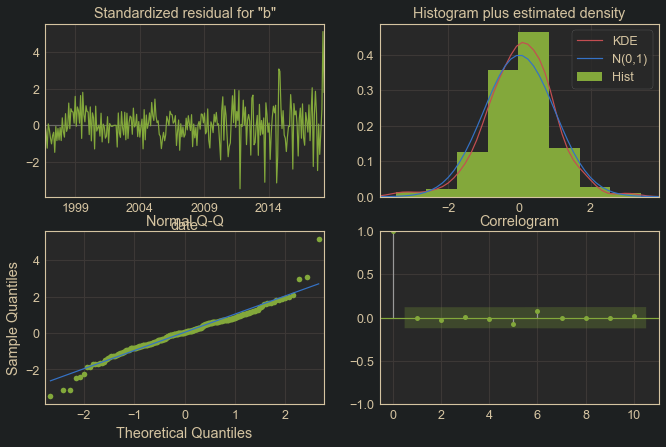

In [383]:
view_zip = groups.get_group(46504).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'bourbon_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 5.1990108262177025e-06


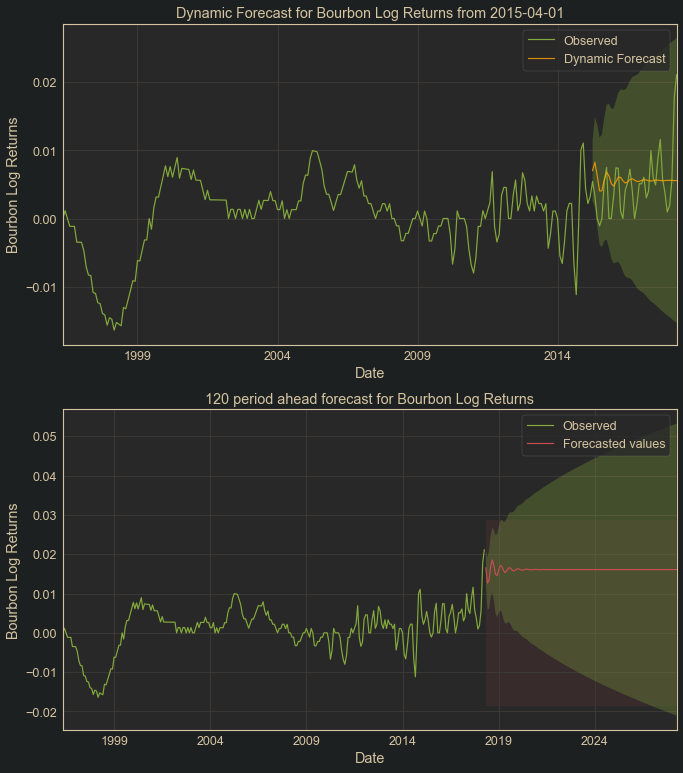

In [384]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=120, dynamic='2015-04-01')

(2, 1, 2)(0, 0, 0, 0) model with no constant
                                 SARIMAX Results                                 
Dep. Variable:     mint_hill_log_returns   No. Observations:                  264
Model:                  SARIMAX(2, 1, 2)   Log Likelihood                1212.745
Date:                   Mon, 14 Sep 2020   AIC                          -2415.491
Time:                           17:10:15   BIC                          -2397.687
Sample:                       05-01-1996   HQIC                         -2408.334
                            - 04-01-2018                                         
Covariance Type:                     opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6596      0.085      7.767      0.000       0.493       0.826
ar.L2         -0.7422      0.086     -8.635      0.000      -0

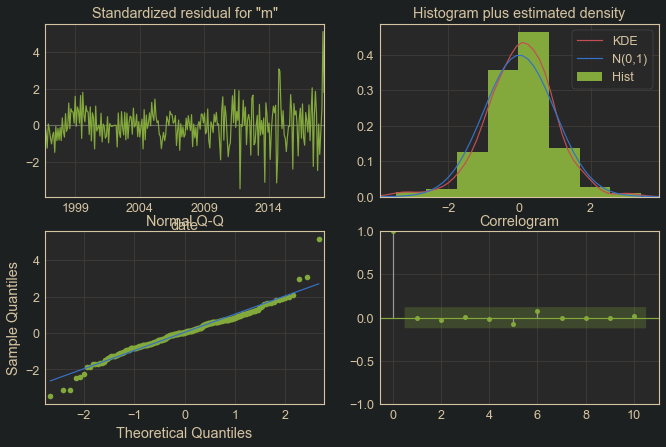

In [385]:
view_zip = groups.get_group(46504).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'mint_hill_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 5.1990108262177025e-06


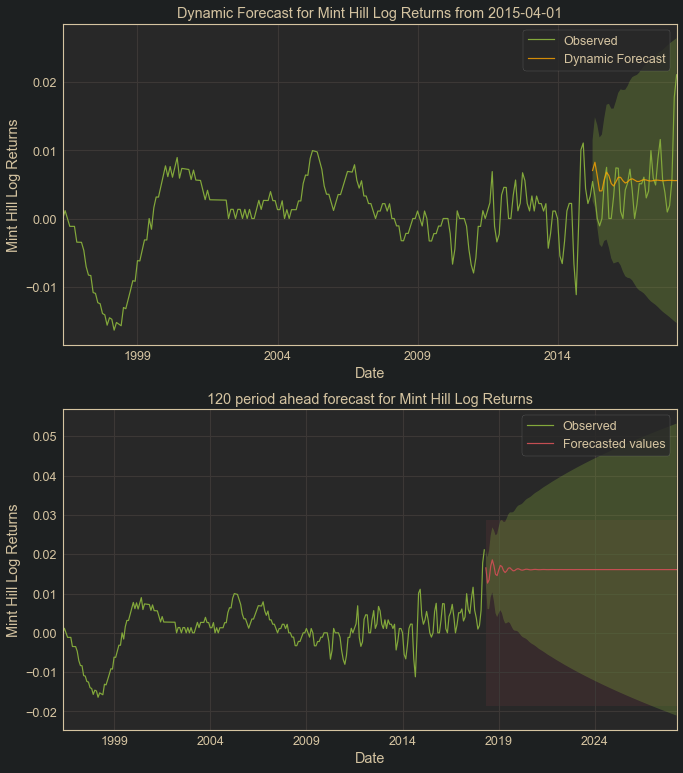

In [386]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=120, dynamic='2015-04-01')

(0, 1, 5)(0, 0, 2, 12) model with no constant
                                        SARIMAX Results                                        
Dep. Variable:                bogue_chitto_log_returns   No. Observations:                  264
Model:             SARIMAX(0, 1, 5)x(0, 0, [1, 2], 12)   Log Likelihood                 978.630
Date:                                 Mon, 14 Sep 2020   AIC                          -1941.260
Time:                                         17:47:38   BIC                          -1913.652
Sample:                                     05-01-1996   HQIC                         -1930.127
                                          - 04-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2644      0

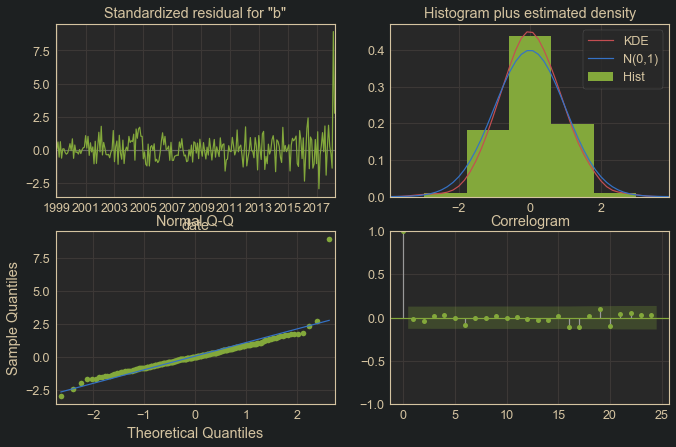

In [407]:
view_zip = groups.get_group(39629).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'bogue_chitto_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 1.2955779728179029e-05


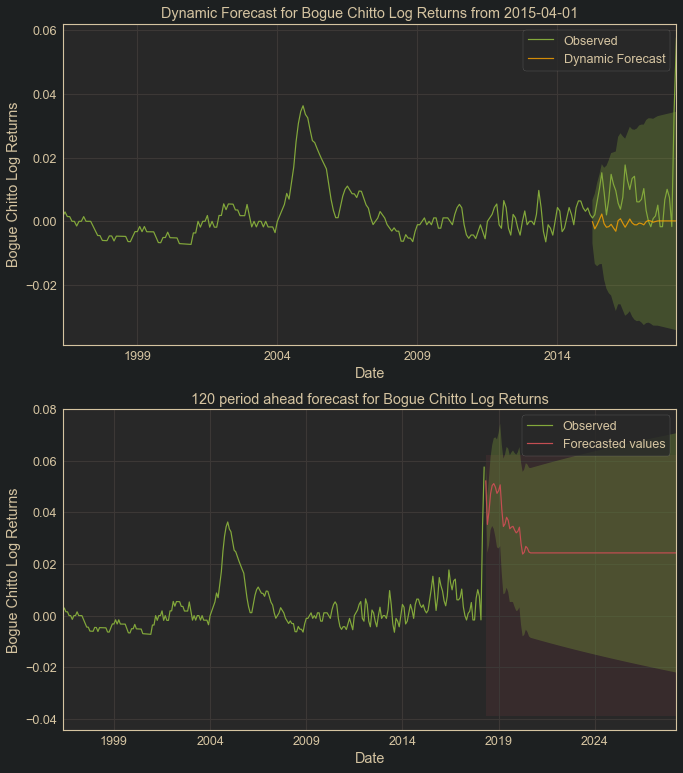

In [408]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=120, dynamic='2015-04-01')

(5, 1, 1)(0, 0, 0, 0) model with no constant
                                  SARIMAX Results                                  
Dep. Variable:     san_antonio_log_returns   No. Observations:                  264
Model:                    SARIMAX(5, 1, 1)   Log Likelihood                1138.010
Date:                     Thu, 17 Sep 2020   AIC                          -2262.020
Time:                             15:30:19   BIC                          -2237.149
Sample:                         05-01-1996   HQIC                         -2252.019
                              - 04-01-2018                                         
Covariance Type:                       opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0776      0.084     12.756      0.000       0.912       1.243
ar.L2         -0.6976      0.086     -8.142   

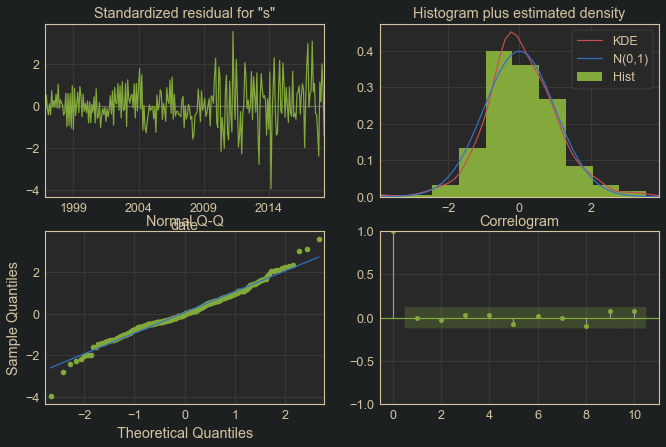

In [120]:
view_zip = groups.get_group(78210).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'san_antonio_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

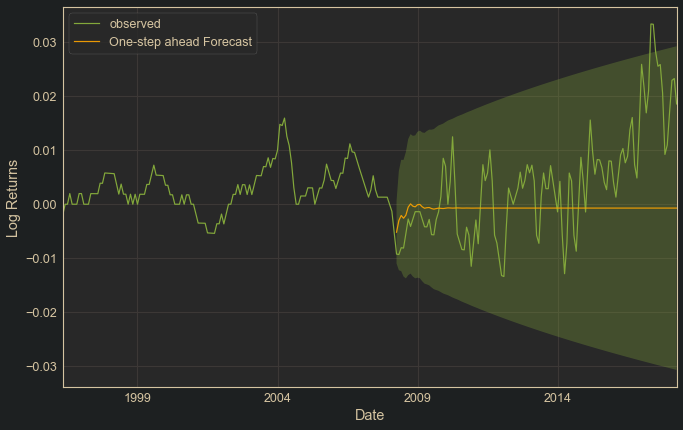

In [121]:
# Get predictions
pred = res.get_prediction(dynamic='2008-04-01')
pred_conf = pred.conf_int().loc['2008-04':]
# Plot observed values
ax = view_zip_returns.plot(label='observed')
# Plot predicted values
pred.predicted_mean.loc['2008-04':].plot(ax=ax, label='One-step ahead Forecast', color='orange', alpha=0.9)
# Plot the range for confidence intervals
ax.fill_between(pred_conf.index, 
                pred_conf.iloc[:, 0], 
                pred_conf.iloc[:, 1],
                alpha=0.3
               )
# Set axes labels
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

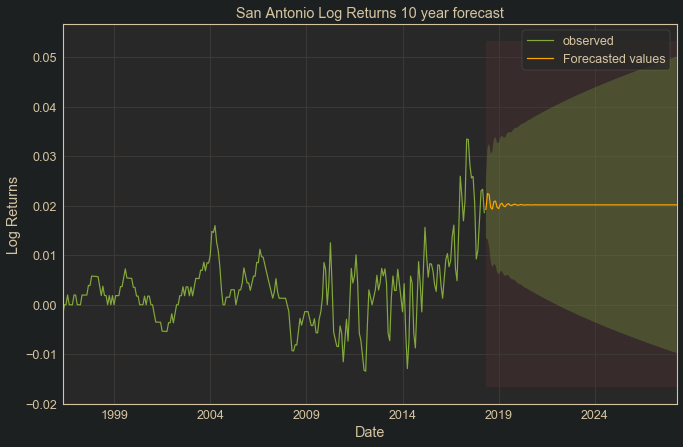

In [122]:
periods_ahead = 120
constant = pd.Series(np.ones(periods_ahead))

# Get forecast
prediction = res.get_forecast(periods_ahead, exog=constant)

# Get confidence intervals of forecast
pred_conf = prediction.conf_int()

# Plot future predictions with confidence intervals
ax = view_zip_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax, color='orange')

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_title('San Antonio Log Returns 10 year forecast')
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

In [98]:
best_5_zips = [78210, 37020, 75228, 46770, 75028]

results_new.loc[best_5_zips]

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
78210,0.000009,0.020198,0.003028,"San Antonio, TX",San Antonio,TX,9.87,11.44
37020,0.000005,0.015791,0.002065,"Shelbyville, TN",Bell Buckle,TN,10.49,11.44
75228,0.000005,0.013274,0.000606,"Dallas-Fort Worth, TX",Dallas,TX,10.69,11.44
46770,0.000005,0.010020,-0.000453,"Fort Wayne, IN",Markle,IN,9.07,11.44
75028,0.000001,0.005349,-0.000536,"Dallas-Fort Worth, TX",Flower Mound,TX,10.69,11.44


In [99]:
export = results_new.loc[best_5_zips]
di.export(export, 'images/best_5_zips.png')

MSE of fit: 8.603292605984827e-06


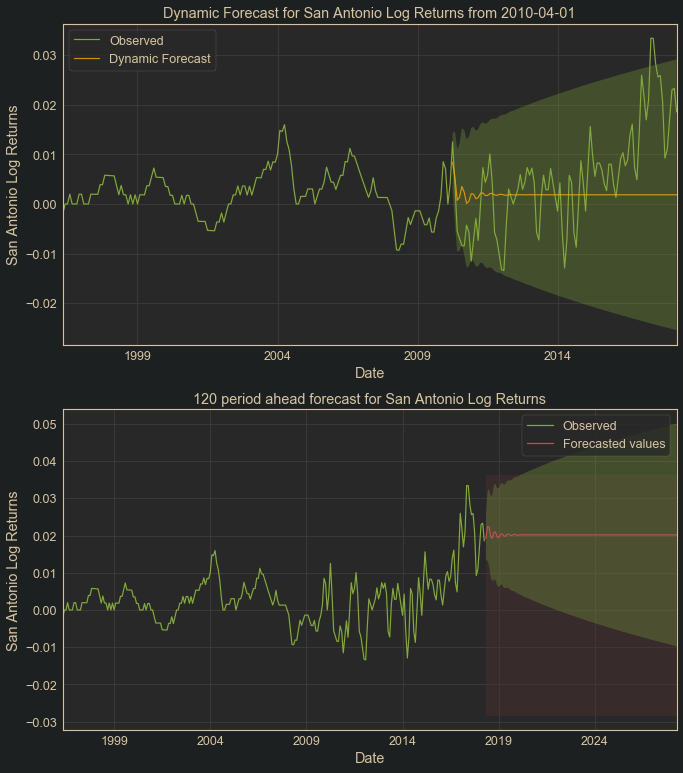

In [421]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=120, dynamic='2010-04-01')

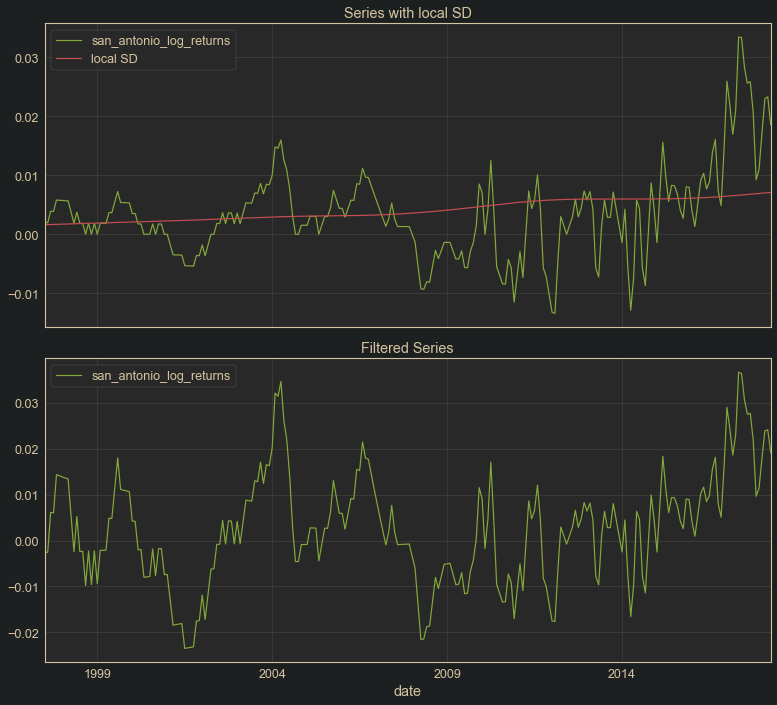

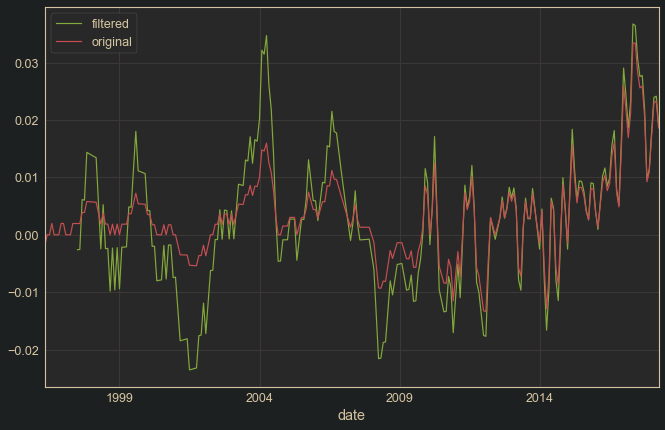

In [389]:
# The good thing about heteroscedasticity filtering is that it brings the variance in the calm
# areas up to keep the model from being biased to the low volatility time period in the 
# beginning
filtered = tsa.so_filter(view_zip_returns, l=15, lamb=129600, center=False, visualize=True)
filtered.plot(label='filtered')
view_zip_returns.plot(label='original')
plt.legend()

In [353]:
filtered.name

'filtered_series'

(2, 1, 3)(2, 0, 0, 12) model with no constant
                                      SARIMAX Results                                      
Dep. Variable:             san_antonio_log_returns   No. Observations:                  264
Model:             SARIMAX(2, 1, 3)x(2, 0, [], 12)   Log Likelihood                 983.193
Date:                             Mon, 14 Sep 2020   AIC                          -1950.386
Time:                                     16:52:57   BIC                          -1922.642
Sample:                                 05-01-1996   HQIC                         -1939.204
                                      - 04-01-2018                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6840      0.417     -1.642      0.101      

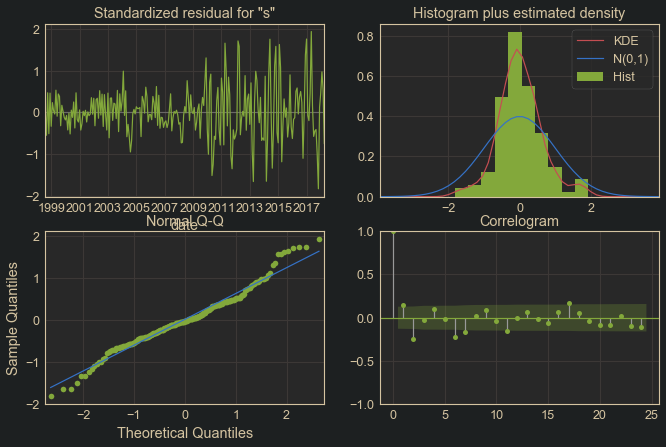

In [372]:
order, sorder, coeffs, const = tsa.model_from_autoarima(filtered, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 1.0309755191090761e-05


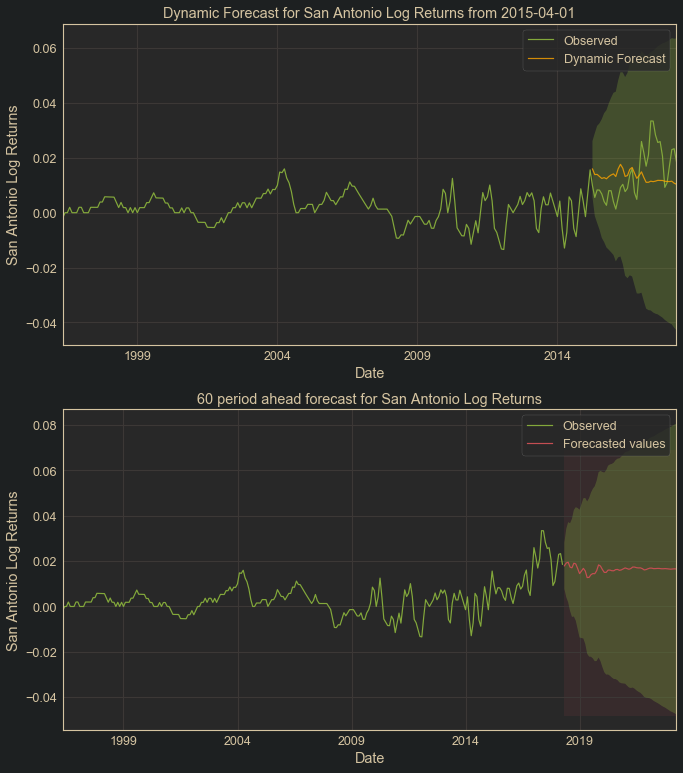

In [373]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=60, dynamic='2015-04-01')

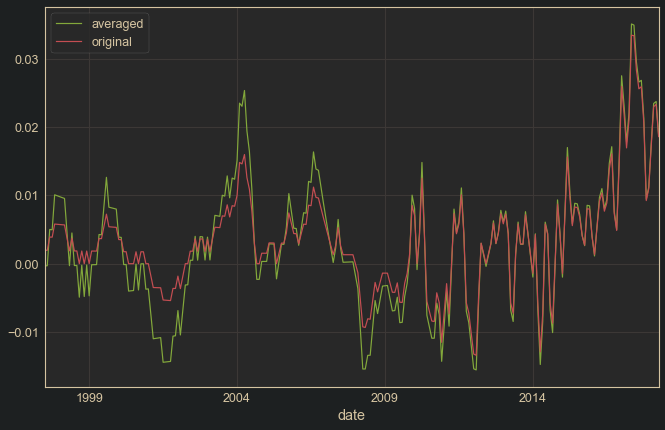

In [356]:
# This has raised our variance too much, let's see what averaging the two series together does
averaged = ((filtered + view_zip_returns) / 2).dropna()
averaged.plot(label='averaged')
view_zip_returns.loc[averaged.index].plot(label='original')
plt.legend();

(3, 1, 3)(2, 0, 0, 12) model with no constant
                                      SARIMAX Results                                      
Dep. Variable:             san_antonio_log_returns   No. Observations:                  264
Model:             SARIMAX(3, 1, 3)x(2, 0, [], 12)   Log Likelihood                1014.254
Date:                             Mon, 14 Sep 2020   AIC                          -2010.509
Time:                                     16:52:08   BIC                          -1979.334
Sample:                                 05-01-1996   HQIC                         -1997.942
                                      - 04-01-2018                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2729      0.294      0.928      0.354      

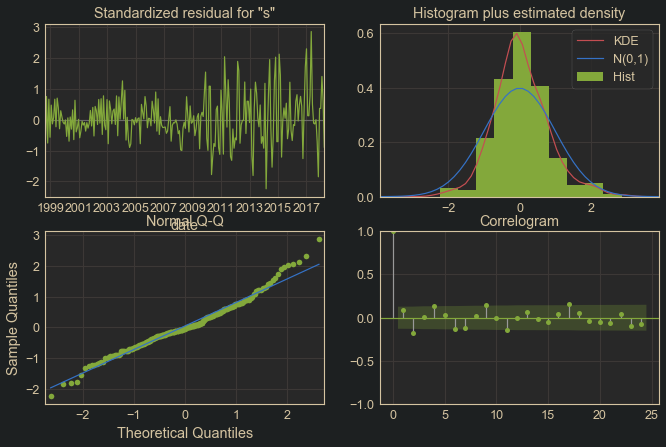

In [370]:
order, sorder, coeffs, const = tsa.model_from_autoarima(averaged, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 9.564880138725766e-06


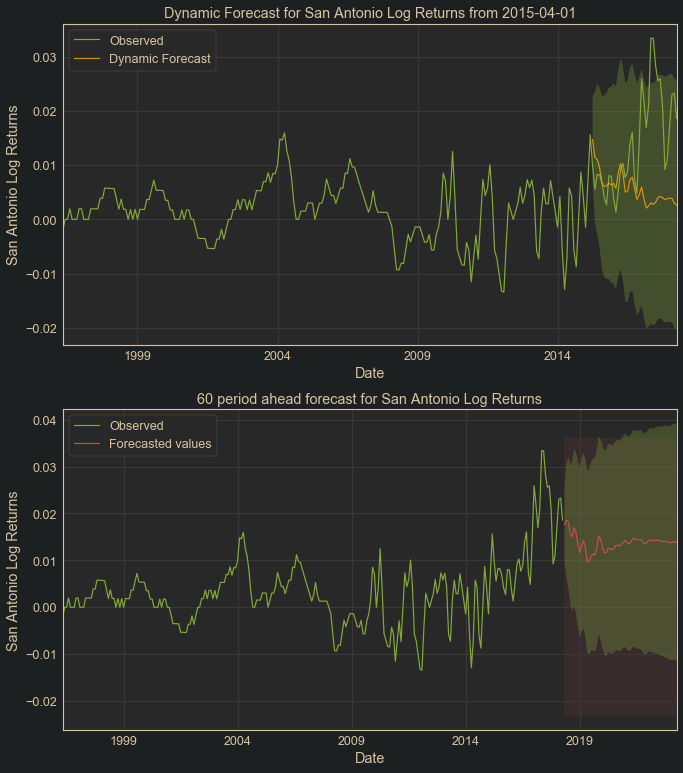

In [371]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=60, dynamic='2015-04-01')

(5, 0, 0)(0, 0, 0, 0) model with intercept
                                  SARIMAX Results                                  
Dep. Variable:     san_antonio_log_returns   No. Observations:                   37
Model:                    SARIMAX(5, 0, 0)   Log Likelihood                 107.676
Date:                     Mon, 14 Sep 2020   AIC                           -201.352
Time:                             16:46:14   BIC                           -191.092
Sample:                         04-01-2015   HQIC                          -197.951
                              - 04-01-2018                                         
Covariance Type:                       opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0015      0.004      0.372      0.710      -0.007       0.010
ar.L1          1.1408      0.088     13.019     

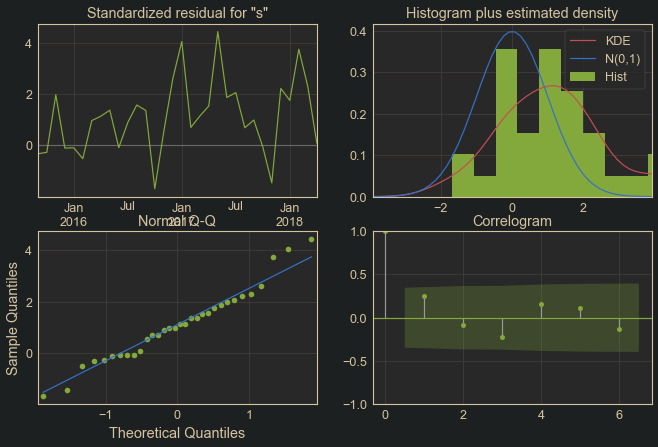

In [365]:
train_filt = filtered[:'2015-04-01']
train = view_zip_returns[:'2015-04-01']
test = view_zip_returns['2015-04-01':]

order, sorder, coeffs, const = tsa.model_from_autoarima(train, freq=12)
model = SARIMAX(test,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=np.ones(len(test))
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 2.4609392305743935e-05


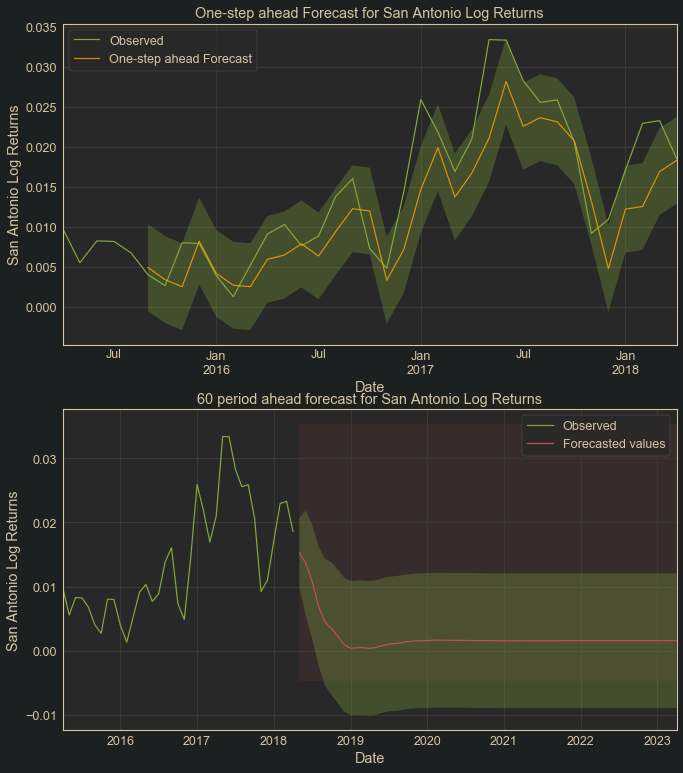

In [367]:
tsa.plot_sarimax_predictions(res, test, periods_ahead=60, exog=np.ones(60))

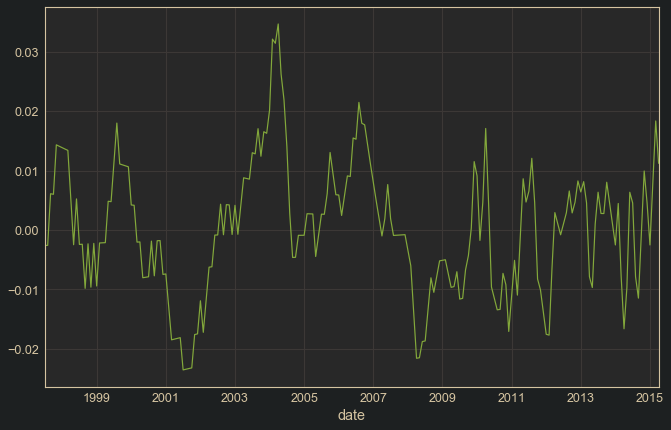

In [362]:
train_filt.plot()

In [368]:
order, sorder, coeffs, const = tsa.model_from_autoarima(filtered[:'2015-04-01'], freq=12)
model = SARIMAX(test,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                #exog=np.ones(len(test))
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

(5, 0, 0)(2, 0, 0, 12) model with no constant
                                     SARIMAX Results                                      
Dep. Variable:            san_antonio_log_returns   No. Observations:                   37
Model:             SARIMAX(5, 0, 0)x(2, 0, 0, 12)   Log Likelihood                  30.334
Date:                            Mon, 14 Sep 2020   AIC                            -44.668
Time:                                    16:50:25   BIC                            -44.033
Sample:                                04-01-2015   HQIC                           -48.955
                                     - 04-01-2018                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9595      0.557      1.724      0.085      -0.131  

ValueError: Length of endogenous variable must be larger the the number of lags used in the model and the number of observations burned in the log-likelihood calculation.

<Figure size 792x504 with 0 Axes>

MSE of fit: 2.956707204600837e-05


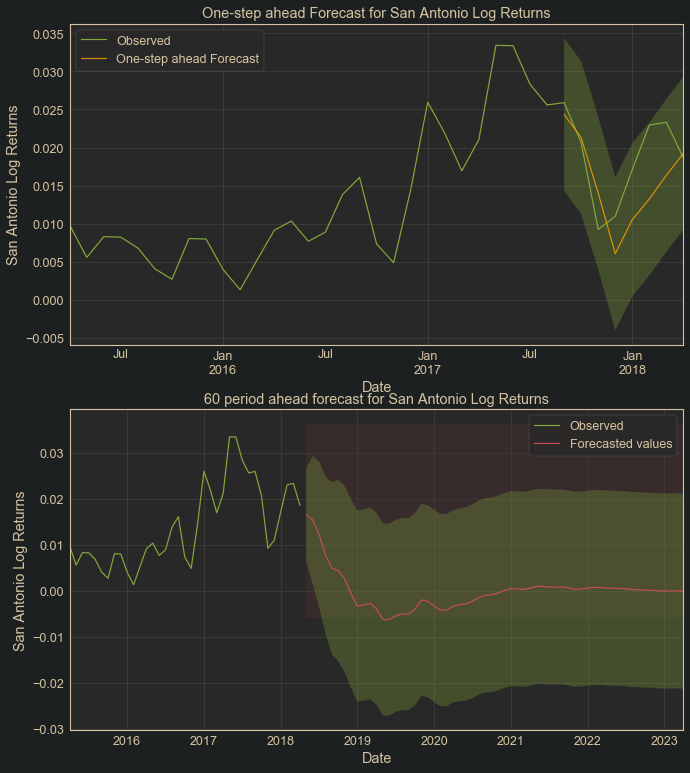

In [369]:
tsa.plot_sarimax_predictions(res, test, periods_ahead=60, )

(0, 1, 3)(0, 0, 1, 12) model with no constant
                                      SARIMAX Results                                       
Dep. Variable:                   bexley_log_returns   No. Observations:                  264
Model:             SARIMAX(0, 1, 3)x(0, 0, [1], 12)   Log Likelihood                1198.817
Date:                              Mon, 14 Sep 2020   AIC                          -2387.634
Time:                                      15:13:17   BIC                          -2370.087
Sample:                                  05-01-1996   HQIC                         -2380.569
                                       - 04-01-2018                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.3895      0.049      8.028      0.0

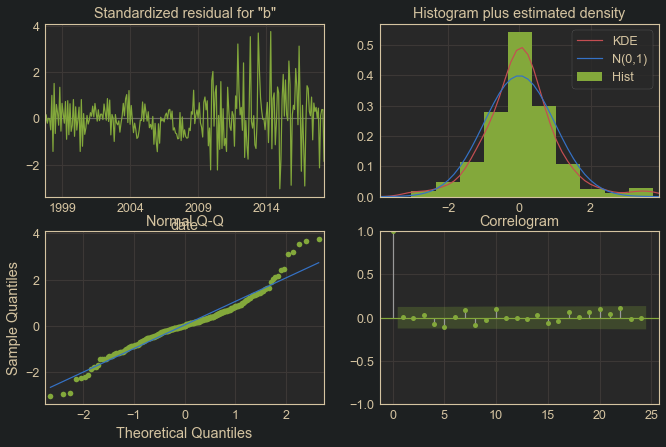

In [286]:
view_zip = groups.get_group(43209).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'bexley_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

In [ ]:
mode = SARIMAX()

MSE of fit: 3.543974156225097e-06


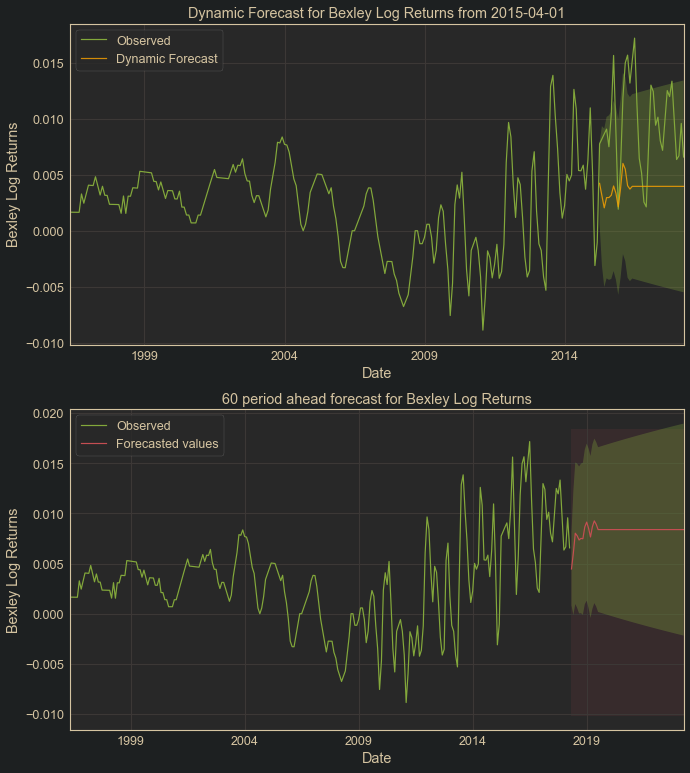

In [273]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=60, dynamic='2015-04-01')

In [ ]:
# Bexley is a little volatile in more recent years.

(3, 1, 3)(0, 0, 2, 12) model with no constant
                                        SARIMAX Results                                        
Dep. Variable:                     watauga_log_returns   No. Observations:                  264
Model:             SARIMAX(3, 1, 3)x(0, 0, [1, 2], 12)   Log Likelihood                1120.598
Date:                                 Mon, 14 Sep 2020   AIC                          -2223.197
Time:                                         17:53:25   BIC                          -2192.061
Sample:                                     05-01-1996   HQIC                         -2210.644
                                          - 04-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5789      0

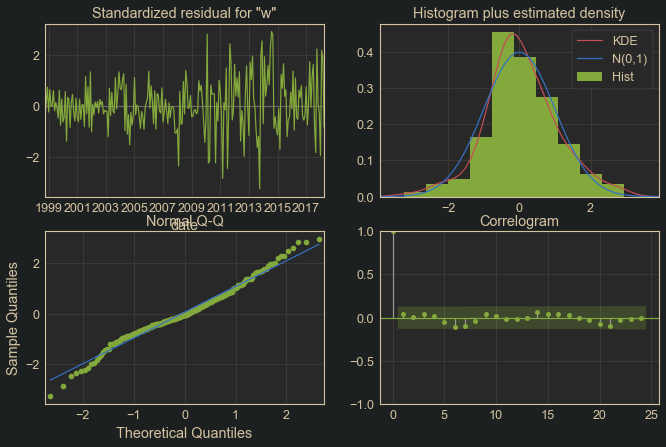

In [411]:
view_zip = groups.get_group(76148).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'watauga_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 4.182234014888616e-06


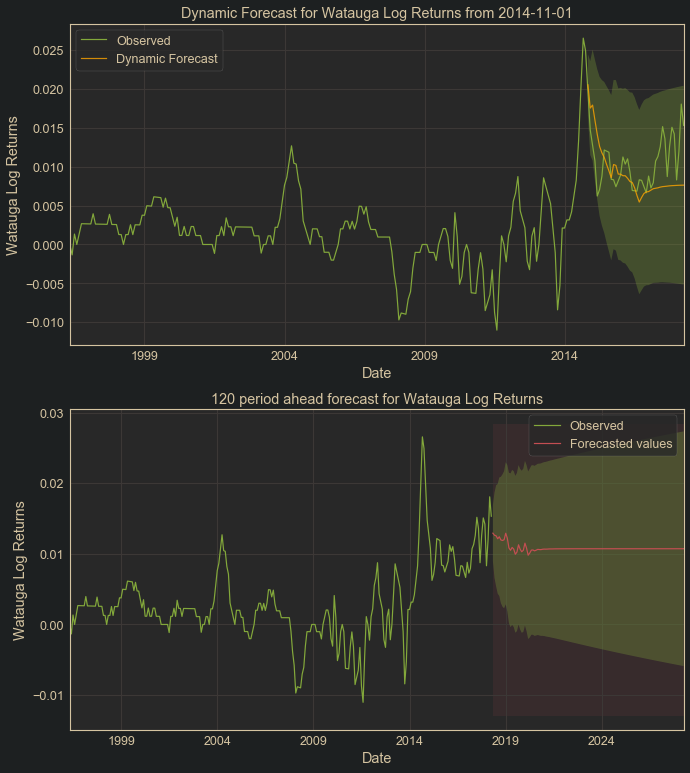

In [415]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=120, dynamic='2014-11-01')

(1, 1, 3)(0, 0, 2, 12) model with no constant
                                        SARIMAX Results                                        
Dep. Variable:                  darlington_log_returns   No. Observations:                  264
Model:             SARIMAX(1, 1, 3)x(0, 0, [1, 2], 12)   Log Likelihood                1091.091
Date:                                 Mon, 14 Sep 2020   AIC                          -2168.182
Time:                                         17:55:03   BIC                          -2143.965
Sample:                                     05-01-1996   HQIC                         -2158.419
                                          - 04-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9695      0

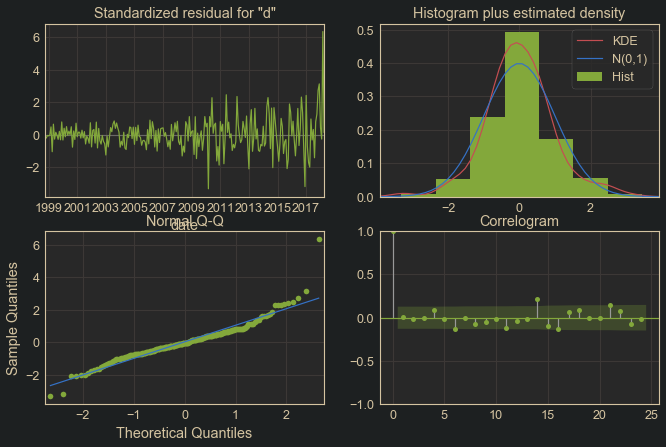

In [416]:
view_zip = groups.get_group(47940).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'darlington_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 5.3230045093500235e-06


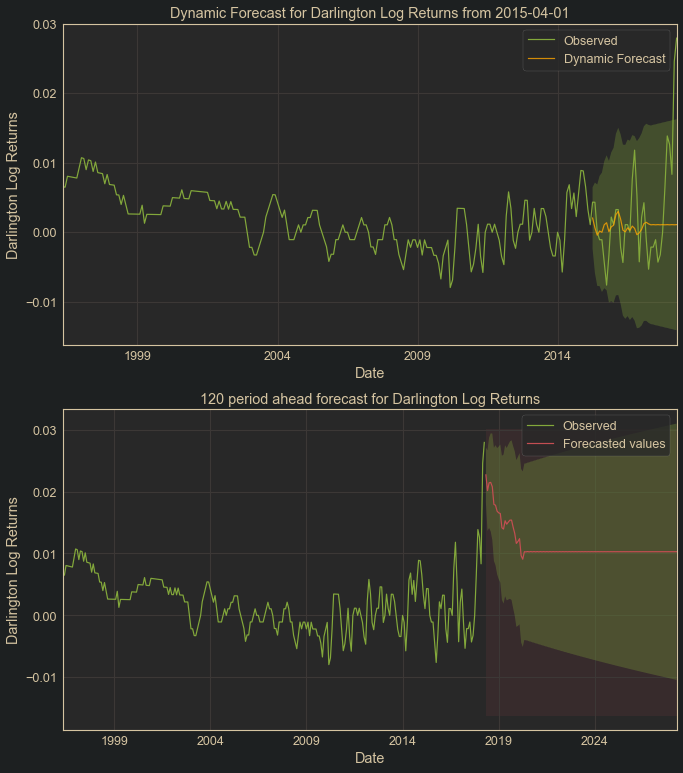

In [418]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=120, dynamic='2015-04-01')

(3, 1, 5)(0, 0, 1, 12) model with no constant
                                      SARIMAX Results                                       
Dep. Variable:                 ethridge_log_returns   No. Observations:                  264
Model:             SARIMAX(3, 1, 5)x(0, 0, [1], 12)   Log Likelihood                1091.316
Date:                              Mon, 14 Sep 2020   AIC                          -2162.633
Time:                                      15:57:19   BIC                          -2127.620
Sample:                                  05-01-1996   HQIC                         -2148.533
                                       - 04-01-2018                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -1.8353      0.103    -17.739      0.0

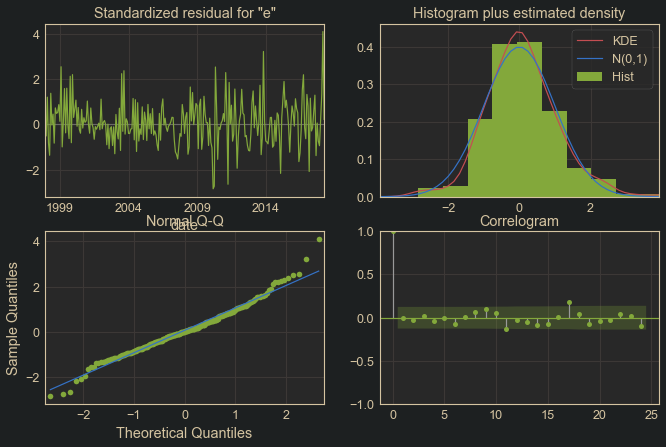

In [301]:
view_zip = groups.get_group(38456).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'ethridge_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 7.87464786810926e-06


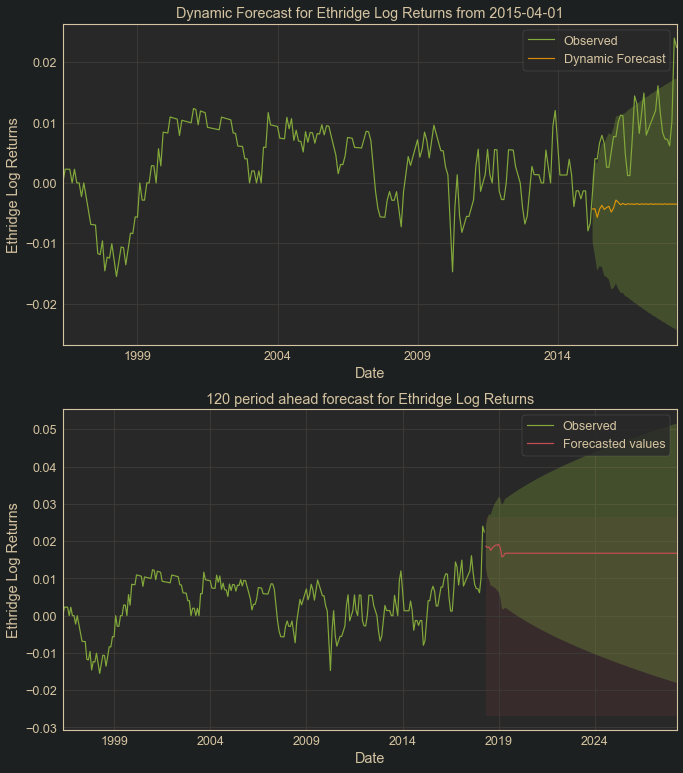

In [302]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=120, dynamic='2015-04-01')

(2, 1, 5)(1, 0, 1, 12) model with no constant
                                      SARIMAX Results                                       
Dep. Variable:                   dallas_log_returns   No. Observations:                  264
Model:             SARIMAX(2, 1, 5)x(1, 0, [1], 12)   Log Likelihood                1141.006
Date:                              Thu, 17 Sep 2020   AIC                          -2262.011
Time:                                      15:55:29   BIC                          -2226.999
Sample:                                  05-01-1996   HQIC                         -2247.912
                                       - 04-01-2018                                         
Covariance Type:                                opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9001      0.059     15.186      0.0

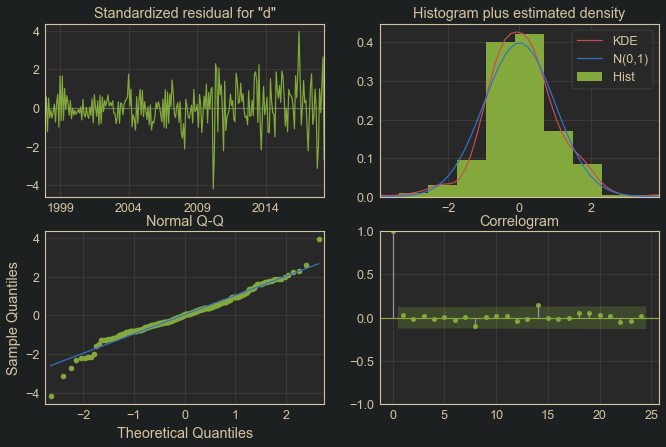

In [127]:
dallas = groups.get_group(75228).set_index('date').value
dallas_returns = np.log(dallas).diff().dropna()
dallas_returns.name = 'dallas_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(dallas_returns, freq=12)
model = SARIMAX(dallas_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())

res.plot_diagnostics();

MSE of fit: 5.1830379449471935e-06


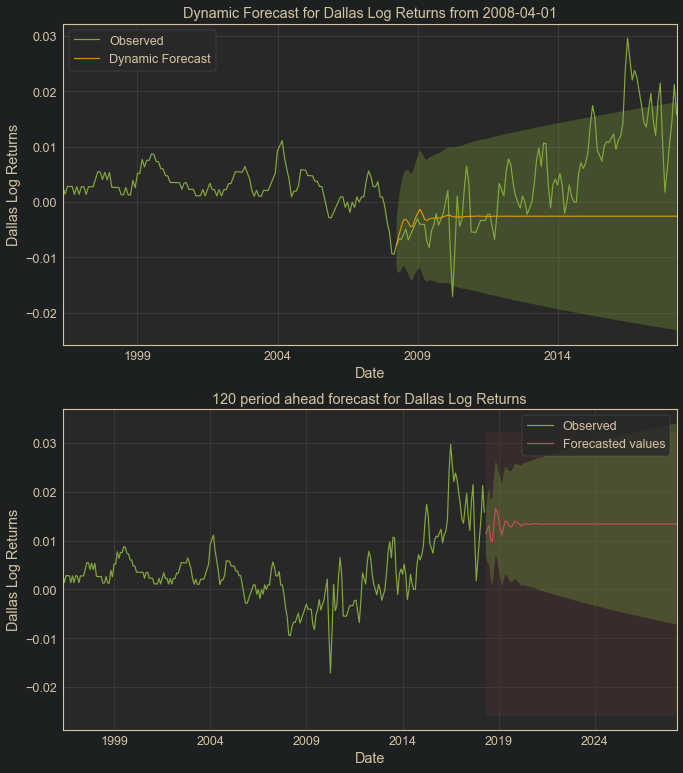

In [128]:
tsa.plot_sarimax_predictions(res, dallas_returns, periods_ahead=120, dynamic='2008-04-01')

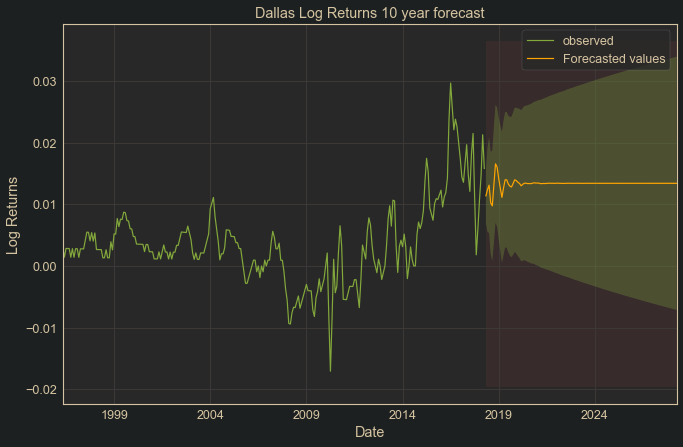

In [129]:
periods_ahead = 120
constant = pd.Series(np.ones(periods_ahead))

# Get forecast
prediction = res.get_forecast(periods_ahead, exog=constant)

# Get confidence intervals of forecast
pred_conf = prediction.conf_int()

# Plot future predictions with confidence intervals
ax = dallas_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax, color='orange')

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_title('Dallas Log Returns 10 year forecast')
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

(1, 1, 3)(1, 0, 2, 12) model with no constant
                                        SARIMAX Results                                        
Dep. Variable:                      markle_log_returns   No. Observations:                  264
Model:             SARIMAX(1, 1, 3)x(1, 0, [1, 2], 12)   Log Likelihood                1108.971
Date:                                 Thu, 17 Sep 2020   AIC                          -2201.942
Time:                                         16:08:28   BIC                          -2174.265
Sample:                                     05-01-1996   HQIC                         -2190.784
                                          - 04-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.3021      0

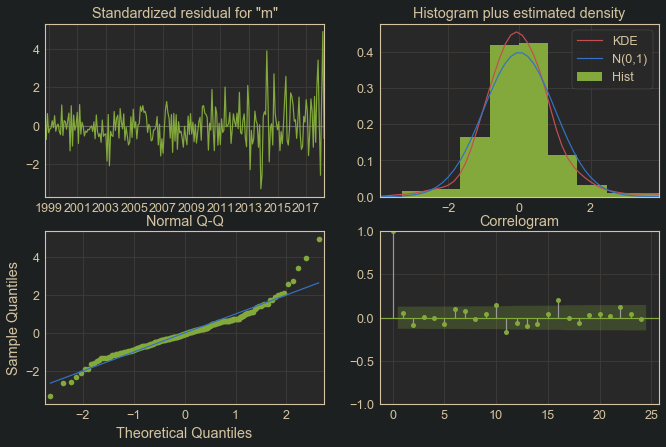

In [131]:
markle = groups.get_group(46770).set_index('date').value
markle_returns = np.log(markle).diff().dropna()
markle_returns.name = 'markle_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(markle_returns, freq=12)
model = SARIMAX(markle_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

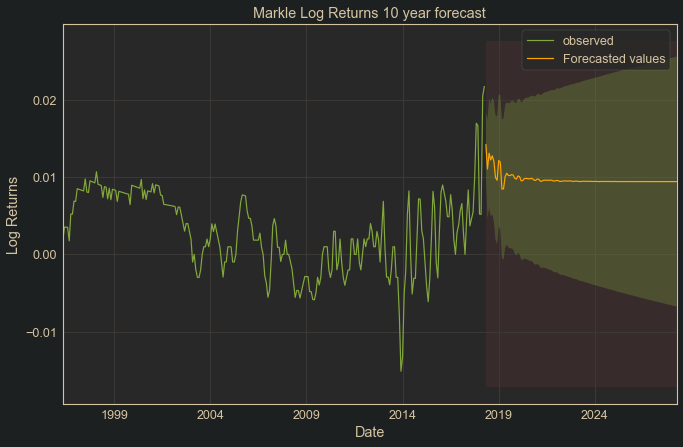

In [132]:
periods_ahead = 120
constant = pd.Series(np.ones(periods_ahead))

# Get forecast
prediction = res.get_forecast(periods_ahead, exog=constant)

# Get confidence intervals of forecast
pred_conf = prediction.conf_int()

# Plot future predictions with confidence intervals
ax = markle_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax, color='orange')

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_title('Markle Log Returns 10 year forecast')
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

MSE of fit: 4.549752190931357e-06


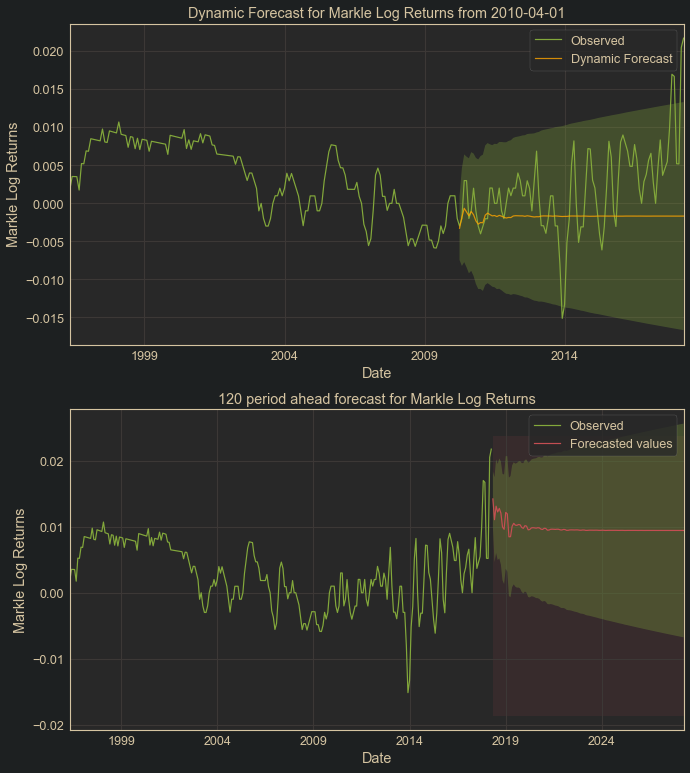

In [106]:
tsa.plot_sarimax_predictions(res, markle_returns, periods_ahead=120, dynamic='2010-04-01',
                            separate_plots=False)

(0, 1, 3)(2, 0, 2, 12) model with no constant
(1, 1, 3)(1, 0, 2, 12) model with no constant
                                        SARIMAX Results                                        
Dep. Variable:                             log_returns   No. Observations:                  264
Model:             SARIMAX(1, 1, 3)x(1, 0, [1, 2], 12)   Log Likelihood                1029.274
Date:                                 Tue, 15 Sep 2020   AIC                          -2042.548
Time:                                         16:55:40   BIC                          -2014.871
Sample:                                     05-01-1996   HQIC                         -2031.390
                                          - 04-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------

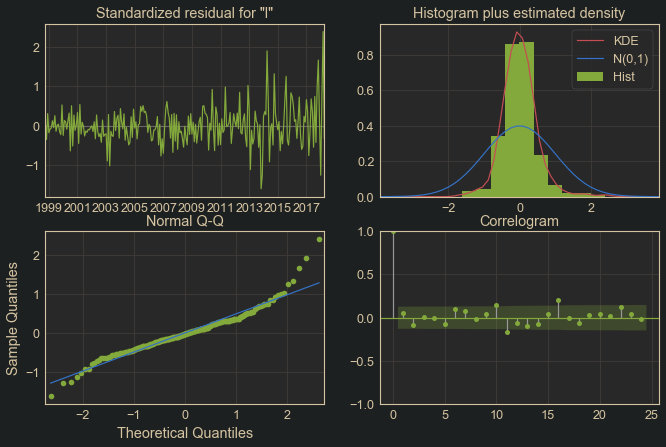

In [465]:
markle = groups.get_group(46770).set_index('date').value
markle_returns = np.log(markle).diff().dropna()
markle_returns.name = 'log_returns'

filt = tsa.so_filter(markle_returns, l=15)
order, sorder, coeffs_filt, const = tsa.model_from_autoarima(filt, freq=12)
order, sorder, coeffs, const = tsa.model_from_autoarima(markle_returns, freq=12)
coeffs.loc['sigma2'] = coeffs_filt.loc['sigma2']

model = SARIMAX(markle_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 4.549699538122999e-06


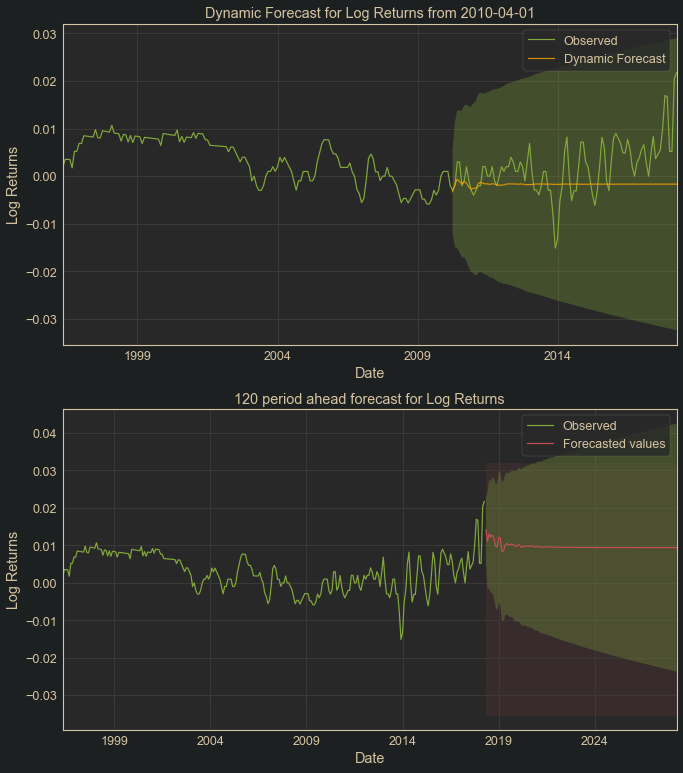

In [466]:
tsa.plot_sarimax_predictions(res, markle_returns, periods_ahead=120, dynamic='2010-04-01',
                            separate_plots=False)

In [467]:
filt.var()

0.0002915111945096877

(2, 1, 5)(0, 0, 2, 12) model with drift
                                        SARIMAX Results                                        
Dep. Variable:                flower_mound_log_returns   No. Observations:                  264
Model:             SARIMAX(2, 1, 5)x(0, 0, [1, 2], 12)   Log Likelihood                1227.750
Date:                                 Thu, 17 Sep 2020   AIC                          -2433.500
Time:                                         16:10:15   BIC                          -2395.539
Sample:                                     05-01-1996   HQIC                         -2418.193
                                          - 04-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
drift       2.427e-05    1.5e-12  

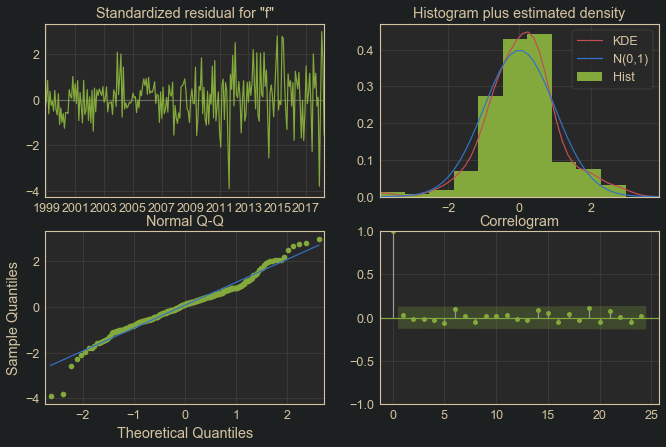

In [133]:
flower = groups.get_group(75028).set_index('date').value
flower_returns = np.log(flower).diff().dropna()
flower_returns.name = 'flower_mound_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(flower_returns, freq=12)
model = SARIMAX(flower_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())

res.plot_diagnostics();

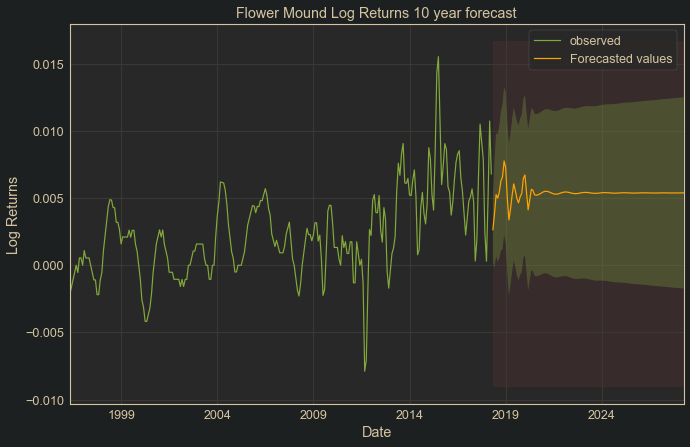

In [134]:
periods_ahead = 120
constant = pd.Series(np.ones(periods_ahead))

# Get forecast
prediction = res.get_forecast(periods_ahead, exog=constant)

# Get confidence intervals of forecast
pred_conf = prediction.conf_int()

# Plot future predictions with confidence intervals
ax = flower_returns.plot(label='observed')
prediction.predicted_mean.plot(label='Forecasted values', ax=ax, color='orange')

ax.fill_between(pred_conf.index,
                pred_conf.iloc[:, 0],
                pred_conf.iloc[:, 1],
                alpha=0.3
               )

ax.fill_betweenx(ax.get_ylim(), pred_conf.index[0], pred_conf.index[-1],
                 alpha=0.1,
                 zorder=-1
                )

ax.set_title('Flower Mound Log Returns 10 year forecast')
ax.set_xlabel('Date')
ax.set_ylabel('Log Returns')
plt.legend()
plt.show()

MSE of fit: 1.5106675126896552e-06


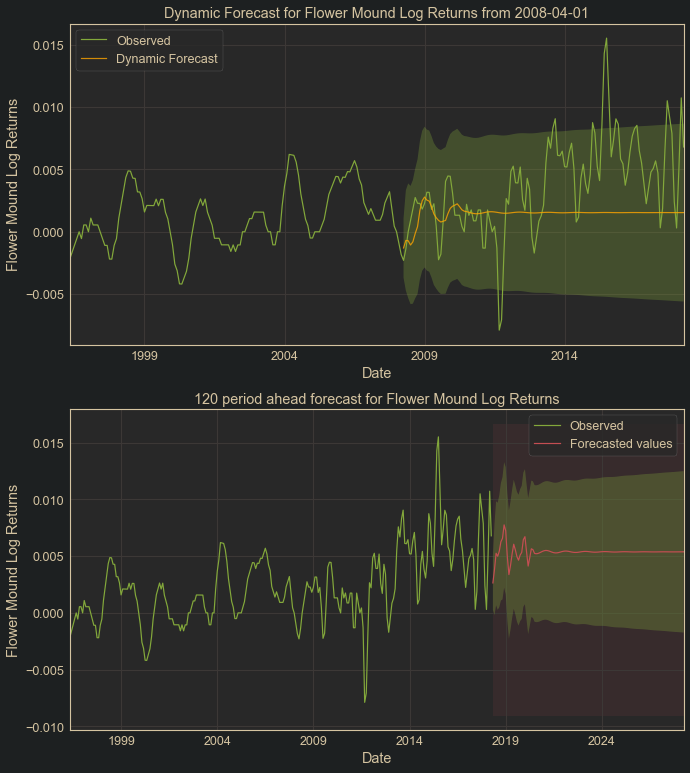

In [108]:
tsa.plot_sarimax_predictions(res, flower_returns, 120, dynamic='2008-04-01', exog=np.ones(120))

(3, 1, 2)(1, 0, 2, 12) model with no constant
                                     SARIMAX Results                                      
Dep. Variable:                 prague_log_returns   No. Observations:                  264
Model:             SARIMAX(3, 1, 2)x(1, 0, 2, 12)   Log Likelihood                1058.822
Date:                            Mon, 14 Sep 2020   AIC                          -2099.644
Time:                                    18:22:53   BIC                          -2068.470
Sample:                                05-01-1996   HQIC                         -2087.077
                                     - 04-01-2018                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6496      0.090     -7.225      0.000      -0.826  

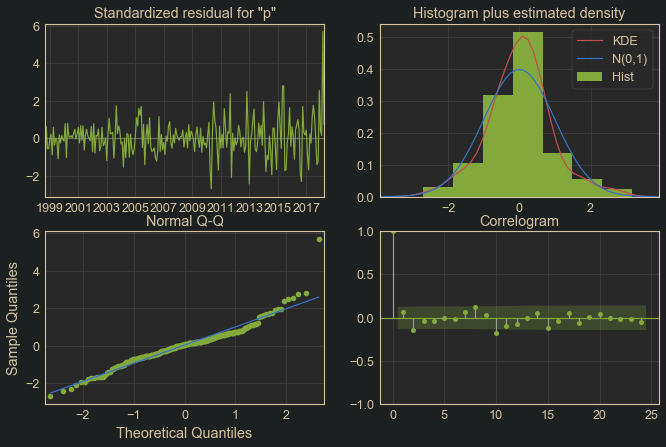

In [432]:
prague = groups.get_group(74864).set_index('date').value
prague_returns = np.log(prague).diff().dropna()
prague_returns.name = 'prague_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(prague_returns, freq=12)
model = SARIMAX(prague_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())

res.plot_diagnostics();

MSE of fit: 7.254806983063818e-06


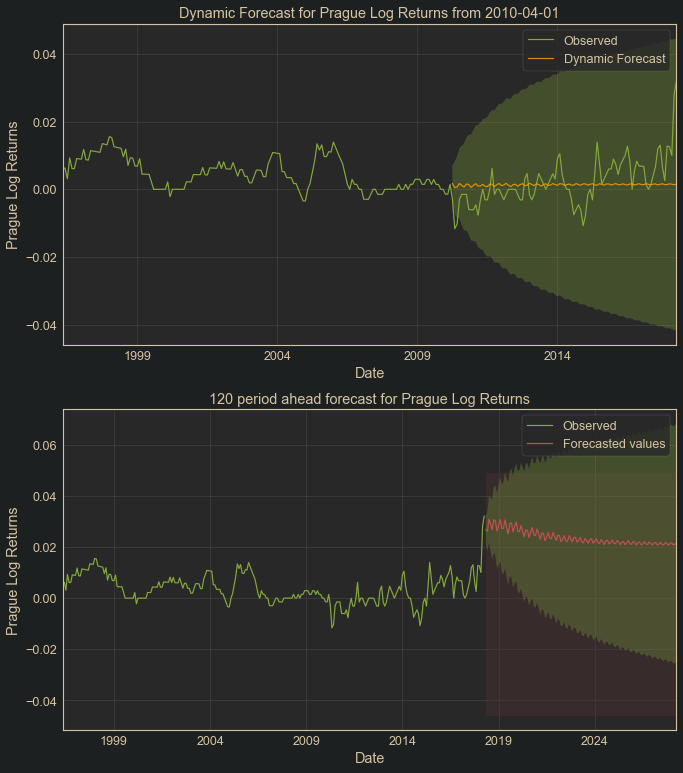

In [433]:
tsa.plot_sarimax_predictions(res, 
                             prague_returns, 
                             periods_ahead=120, 
                             dynamic='2010-04-01',
                             exog=np.ones(120))

(0, 1, 4)(0, 0, 2, 12) model with no constant
                                        SARIMAX Results                                        
Dep. Variable:                    harrison_log_returns   No. Observations:                  264
Model:             SARIMAX(0, 1, 4)x(0, 0, [1, 2], 12)   Log Likelihood                1174.891
Date:                                 Mon, 14 Sep 2020   AIC                          -2335.783
Time:                                         18:24:05   BIC                          -2311.595
Sample:                                     05-01-1996   HQIC                         -2326.030
                                          - 04-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.1256      0

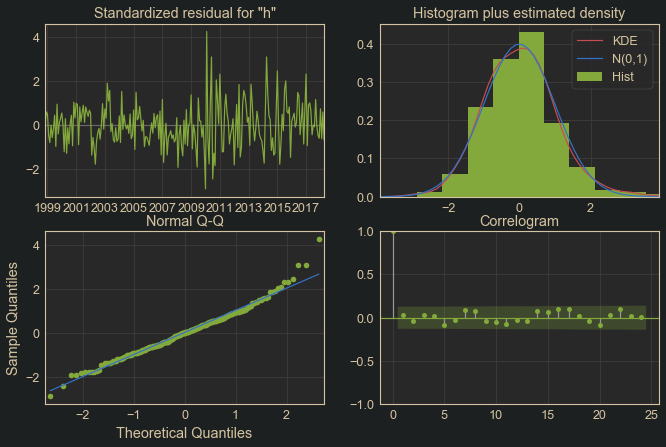

In [434]:
chat = groups.get_group(37341).set_index('date').value
chat_returns = np.log(chat).diff().dropna()
chat_returns.name = 'harrison_log_returns'

order, sorder, coeffs, const = tsa.model_from_autoarima(chat_returns, freq=12)
model = SARIMAX(chat_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())

res.plot_diagnostics();

MSE of fit: 2.5323914246864096e-06


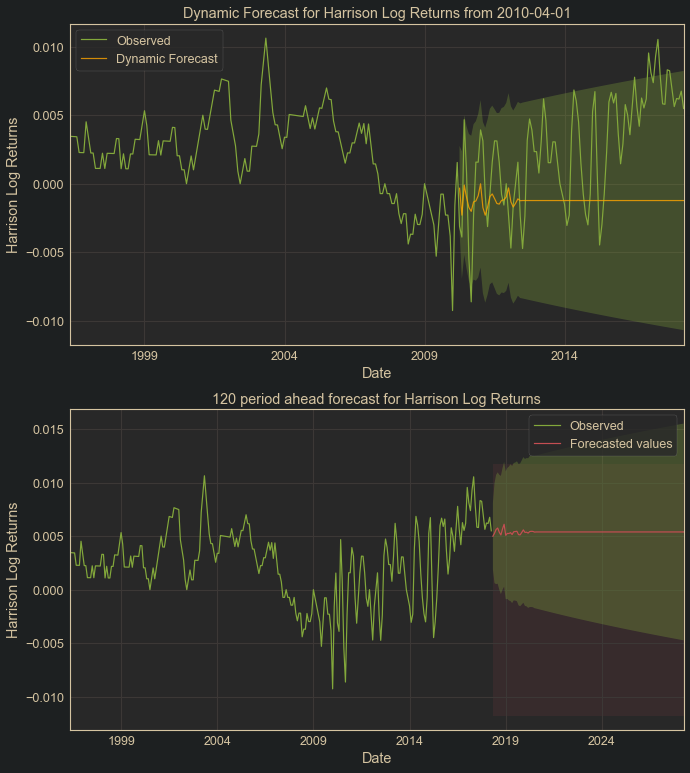

In [436]:
tsa.plot_sarimax_predictions(res, chat_returns, periods_ahead=120, dynamic='2010-04-01')

In [166]:
pred_conf.iloc[:, 0].mean()

-0.0016575946598171981

### Notes so far:
From considering all of the above contenders and their outlooks, as well as trying to not invest too much in the same areas, the hand picked list of zip codes I have come up with is:

1. Dallas - 75228
2. San Antonio - 78210
3. Bell Buckle - 37020
4. Markle - 46770
5. Flower Mound - 75028

In [ ]:
best_zips = [75228, 78210, 37020, 46770, 75028]

AxesSubplot(0.0192803,0.546852;0.312039x0.435781)
(5, 1, 1)(0, 0, 0, 0) model with no constant
AxesSubplot(0.347687,0.624807;0.312039x0.357826)
(5, 1, 1)(0, 0, 1, 12) model with no constant
AxesSubplot(0.676094,0.624807;0.312039x0.357826)
(2, 1, 5)(1, 0, 1, 12) model with no constant
AxesSubplot(0.0192803,0.2;0.312039x0.357826)
(1, 1, 3)(1, 0, 2, 12) model with no constant
AxesSubplot(0.347687,0.2;0.312039x0.357826)
(2, 1, 5)(0, 0, 2, 12) model with drift


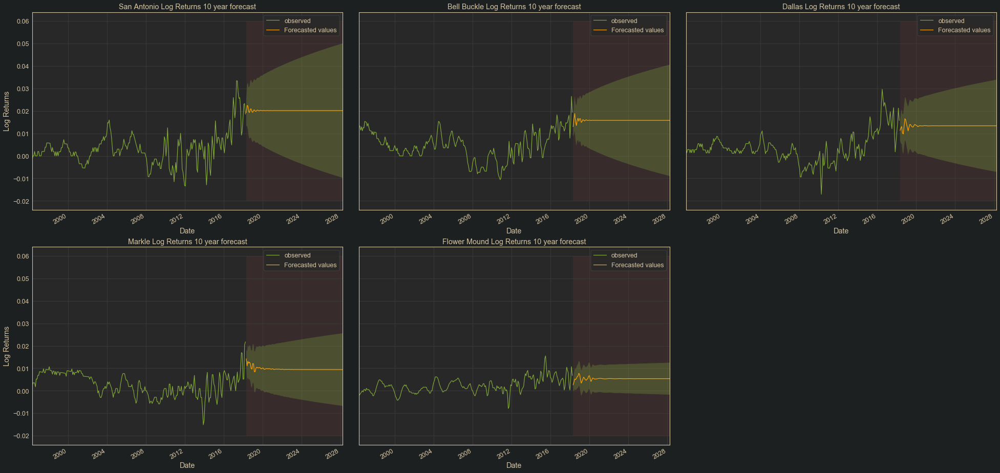

In [150]:
# Making joined charts for slide show
fig, axes = plt.subplots(2, 3, figsize=(27,15), sharey=True)
plt.tight_layout(h_pad=5)

cities = ['San Antonio', 'Bell Buckle', 'Dallas', 'Markle', 'Flower Mound']

for i, (zipcode, ax) in enumerate(zip(best_5_zips, axes.flatten()[:-1])):
    print(ax)
    view_zip = groups.get_group(zipcode).set_index('date').value
    view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
    view_zip_returns.name = '{} Log Returns'.format(cities[i])

    order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns, freq=12)
    model = SARIMAX(view_zip_returns,
                    order=order,
                    seasonal_order=sorder,
                    enforce_invertibility=False,
                    enforce_stationarity=False,
                    exog=const
                   )
    res = model.smooth(coeffs)
    periods_ahead = 120
    constant = pd.Series(np.ones(periods_ahead))

    # Get forecast
    prediction = res.get_forecast(periods_ahead, exog=constant)

    # Get confidence intervals of forecast
    pred_conf = prediction.conf_int()

    # Plot future predictions with confidence intervals
    ax.plot(view_zip_returns, label='observed')
    prediction.predicted_mean.plot(label='Forecasted values', ax=ax, color='orange')

    ax.fill_between(pred_conf.index,
                    pred_conf.iloc[:, 0],
                    pred_conf.iloc[:, 1],
                    alpha=0.3
                   )

    ax.fill_betweenx([-.02, .06], pred_conf.index[0], pred_conf.index[-1],
                     alpha=0.1,
                     zorder=-1
                    )

    ax.set_title('{} Log Returns 10 year forecast'.format(cities[i]))
    ax.set_xlabel('Date')
    ax.set_ylabel('Log Returns')
    ax.legend()

axes[-1,-1].axis('off')
plt.show()

,sigma2,predicted_mean,lower_conf_mean,Region Name,City,State,P2R,National Average
zipcode,,,,,,,,
78210,0.000009,0.020198,0.003028,"San Antonio, TX",San Antonio,TX,9.87,11.44
37020,0.000005,0.015791,0.002065,"Shelbyville, TN",Bell Buckle,TN,10.49,11.44
75228,0.000005,0.013274,0.000606,"Dallas-Fort Worth, TX",Dallas,TX,10.69,11.44
46770,0.000005,0.010020,-0.000453,"Fort Wayne, IN",Markle,IN,9.07,11.44
75028,0.000001,0.005349,-0.000536,"Dallas-Fort Worth, TX",Flower Mound,TX,10.69,11.44


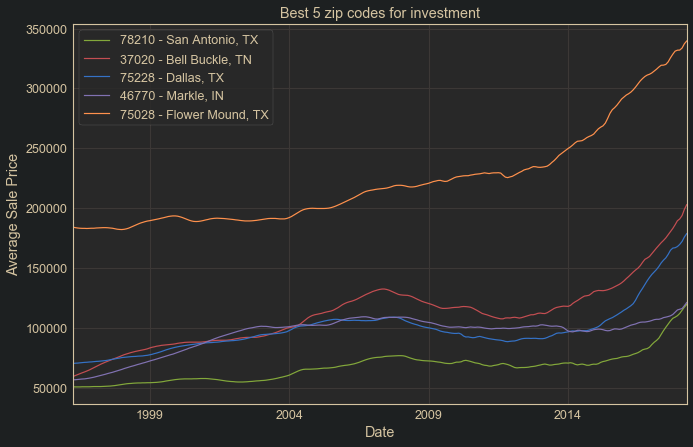

In [118]:
for i, zipcode in enumerate(best_5_zips):
    group = groups.get_group(zipcode).set_index('date')
    group.value.plot(label=str(zipcode)+' - '+group.City.iloc[0]+', '+group.State.iloc[0])
    
    if i == len(best_5_zips)-1:
        display(profitable_rent.loc[best_5_zips])
        plt.title('Best 5 zip codes for investment')
        plt.ylabel('Average Sale Price')
        plt.xlabel('Date')
        plt.legend()
        plt.show()
        view_zips = []

## Note:
Below this line was some work tinkering with the coefficients generated from the auto.arima call and using them in statsmodels. It turns out that though a model may have drift or intercept, when feeding the coefficients into statsmodels, both should be done using a vector of ones and have the coefficient assigned. This may mean that statsmodels uses the exogenous variables while the data is still differenced. Either way, the correct method is to use the vector of ones as the exogenous variable with the coefficient assigned, as has been done so far in this notebook.

In [905]:
test = groups.get_group(results.index[-162]).set_index('date').loc[start_date:].value.dropna()
test_returns = np.log(test).diff().dropna()
autoarima = r['auto.arima'](r['ts'](FloatVector(test_returns + 0.05), freq=12))
print(autoarima)

Series: structure(c(0.0578656108059505, 0.0542643987864572, 0.0535398267051239,  0.0514124296133424, 0.0478806067658379, 0.0485845715966697, 0.0542402890388846,  0.0549243856106784, 0.0521030501967783, 0.0513995803544233, 0.0541870263542165,  0.0548628091657026, 0.0555286941103159, 0.0548126596844167, 0.0534234884515207,  0.05, 0.0493162392895982, 0.05, 0.0513670542115332, 0.0513651879253409,  0.0534048381548413, 0.0540705619299413, 0.0520290842267805, 0.0439003538432782,  0.0493199591713431, 0.0628423529112283, 0.0659896811043456, 0.0592105914302767,  0.0584773901890429, 0.0584061277410115, 0.0583360534020613, 0.0582671377048946,  0.058827295654406, 0.0624767682151603, 0.0487593050517649, 0.0356202586301066,  0.0373255591032724, 0.0506375518226793, 0.0512738855225898, 0.0448946921658557,  0.0506395906837788, 0.0664873741090208, 0.0600125992924305, 0.0437538835030466,  0.0550000104167065, 0.0660795053743481, 0.0664287236257543, 0.0673501211352374,  0.0664709605959246, 0.054075697053814

In [926]:
test2 = groups.get_group(results.index[-2]).set_index('date').loc[start_date:].value.dropna()
test2 = np.log(test2).dropna()
autoarima2 = r['auto.arima'](r['ts'](FloatVector(test2), freq=12))
print(autoarima2)

Series: structure(c(12.7224826475901, 12.7242710236256, 12.7284315051098,  12.7316883547688, 12.7346399507723, 12.7381704045717, 12.739344458126,  12.7384640472107, 12.7369949709953, 12.737582860489, 12.741102957993,  12.7466512274455, 12.7524584446947, 12.7559266562636, 12.758519943987,  12.7616804120681, 12.7631136930931, 12.7636864307949, 12.7648309230515,  12.7659741069428, 12.7676864361283, 12.7725221730442, 12.7784636249543,  12.7843699844112, 12.7899628401532, 12.7949698047163, 12.798017320581,  12.8032594349442, 12.809021558172, 12.8133895694849, 12.8142064517632,  12.8147506694637, 12.8155664410929, 12.8182808835848, 12.8201766187497,  12.8207175979352, 12.8220687669017, 12.8250349279007, 12.8279923168018,  12.8298697479553, 12.8304055100898, 12.8285290854674, 12.8258423562853,  12.8244962798942, 12.8255732859218, 12.8271866231903, 12.8274552598608,  12.8269179143347, 12.8274552598608, 12.8320110763967, 12.8400004664301,  12.8466098758178, 12.8526521902738, 12.8573556219914, 1

In [947]:
order, sorder, coeffs, trend = tsa.model_from_autoarima(test2, freq=12)
model = SARIMAX(test2, order=order, seasonal_order=sorder, 
                exog=np.ones(len(test2))
                #trend='c'
               )
res = model.smooth(coeffs[:])
res.summary()

(3, 1, 0)(0, 0, 0, 0) model with drift 


C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:527: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  % freq, ValueWarning)
C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  value   No. Observations:                   61
Model:               SARIMAX(3, 1, 0)   Log Likelihood                 286.902
Date:                Sat, 12 Sep 2020   AIC                           -563.803
Time:                        23:00:06   BIC                           -553.332
Sample:                    04-01-2013   HQIC                          -559.707
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.0031   6.48e-10   4.81e+06      0.000       0.003       0.003
ar.L1          1.1549      0.142      8.145      0.000       0.877       1.433
ar.L2         -0.7743      0.271     -2.852      0.004      -1.306      -0.242
ar.L3          0.3986      0.252      1.582      0.114      -0.095       0.893
sigma2      6.104e-06   1.75e-06      3.480      0.001    2.67e-06    9.54e-06
===================================================================================
Ljung-Box (L10) (Q):                  6.15   Jarque-Bera (JB):                 1.85
Prob(Q):                              0.80   Prob(JB):                         0.40
Heteroskedasticity (H):               3.62   Skew:                            -0.11
Prob(H) (two-sided):                  0.01   Kurtosis:                         3.83
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.12e+25. Standard errors may be unstable.
"""

C:\ProgramData\Anaconda3\lib\site-packages\statsmodels\tsa\statespace\mlemodel.py:3225: FutureWarning: The default value of lags is changing.  After 0.12, this value will become min(10, nobs//5) for non-seasonal time series and min (2*m, nobs//5) for seasonal time series. Directly set lags to silence this warning.
  FutureWarning


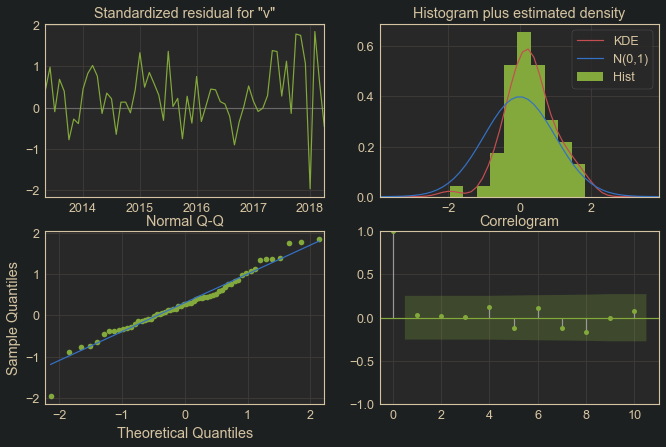

In [948]:
res.plot_diagnostics();

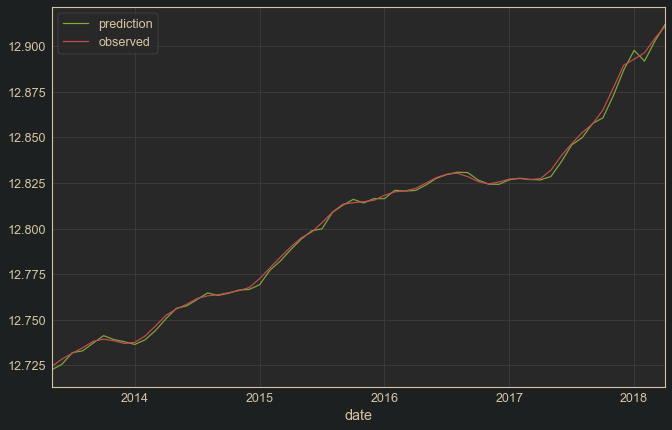

In [949]:
pred = res.get_prediction()
pred_conf = pred.conf_int()
pred.predicted_mean[1:].plot(label='prediction')
test2.iloc[1:].plot(label='observed')
plt.legend()

In [ ]:
# After much tinkering, I can see that the auto.arima calls the intercept 'drift' when
# it is performing an order of differencing, and 'intercept' otherwise. Although the 
# SARIMAX model has drift when the trend is set to 't', this is not the same as what the
# coefficient is referring to, which is a constant. The best results are achieved by 
# giving the SARIMAX model an exogenous variable of all ones, and applying either the
# 'intercept' or 'drift' coefficient to the exog.

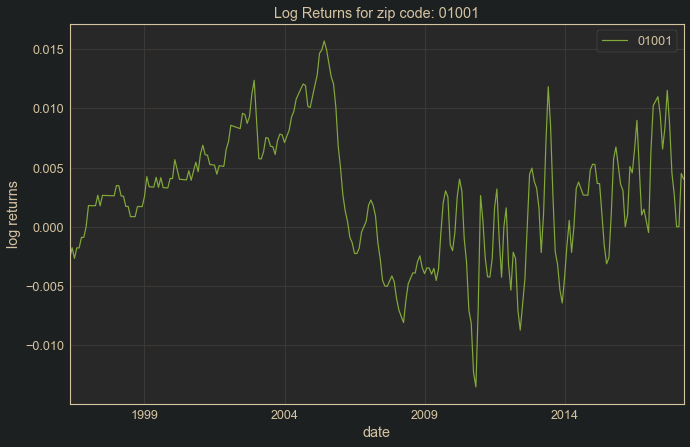

In [23]:
# Isolate time series of the prices for the first zip code in the data
first_zip_prices = groups.get_group(1001).set_index('date').value

# Calculate log returns of this price series
first_zip_log_returns = np.log(first_zip_prices).diff().dropna()
# Set name of series
first_zip_log_returns.name = 'log_returns'

# A look at our returns stream
first_zip_log_returns.plot(label='01001')
plt.title('Log Returns for zip code: 01001')
plt.ylabel('log returns')
plt.legend()
plt.show()

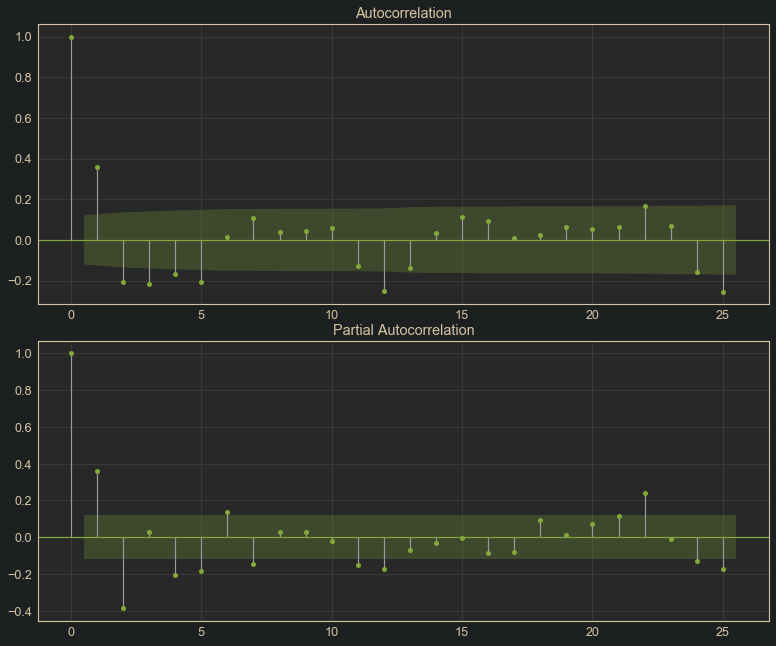

In [28]:
fig, (ax1, ax2) = plt.subplots(2, figsize=(11,9))
plt.tight_layout()
plot_acf(first_zip_log_returns.diff().dropna(), ax=ax1);
plot_pacf(first_zip_log_returns.diff().dropna(), ax=ax2);
plt.show()

In [445]:
np.exp(-.01)

0.9900498337491681

In [488]:
# Get object. Notice how the function names are called as dictionary keys to r
# Also note that we are creating a timeseries object with the ts() function, giving it
# a frequency of 12 to denote that the data is monthly
autoarima = r['auto.arima'](r['ts'](FloatVector(first_zip_log_returns), freq=12))

print(autoarima)

Series: structure(c(-0.00265604405811537, -0.00177462335836864, -0.00266785396119396,  -0.00178253166628295, -0.00178571476023492, -0.000894054596880522,  -0.000894854645842713, 0, 0.00178890924272324, 0.00178571476023492,  0.00178253166628295, 0.0017793599000786, 0.002663117419484, 0.0017714796483812,  0.0026513493216207, 0.00264433825308963, 0.00263736416608573,  0.00263042676877312, 0.00262352577238545, 0.00261666089117085,  0.0034782643763247, 0.00346620797648711, 0.0025917941074276,  0.00258509407210461, 0.00171969087952739, 0.00171673861905397,  0.000857265376119187, 0.000856531101616653, 0.000855798083895465,  0.0017094021256483, 0.00170648505575954, 0.00170357792478271,  0.00254993763327249, 0.004235499766855, 0.00337553063128126,  0.00336417474563255, 0.00335289501031077, 0.00417537141048108,  0.00332779009267448, 0.00414422474602638, 0.00330305832925681,  0.00329218404347742, 0.00328138112317689, 0.00408664238545242,  0.00407000968829685, 0.00567032706008774, 0.00483482005458

In [453]:
first_zip_log_returns.diff()[:'2009-01-01'].var()

9.636931665530432e-07

In [468]:
first_zip_log_returns.diff()['2009-01-01':].var()

8.306587284754657e-06

In [454]:
first_zip_log_returns.diff()[:].var()

4.074932449456618e-06

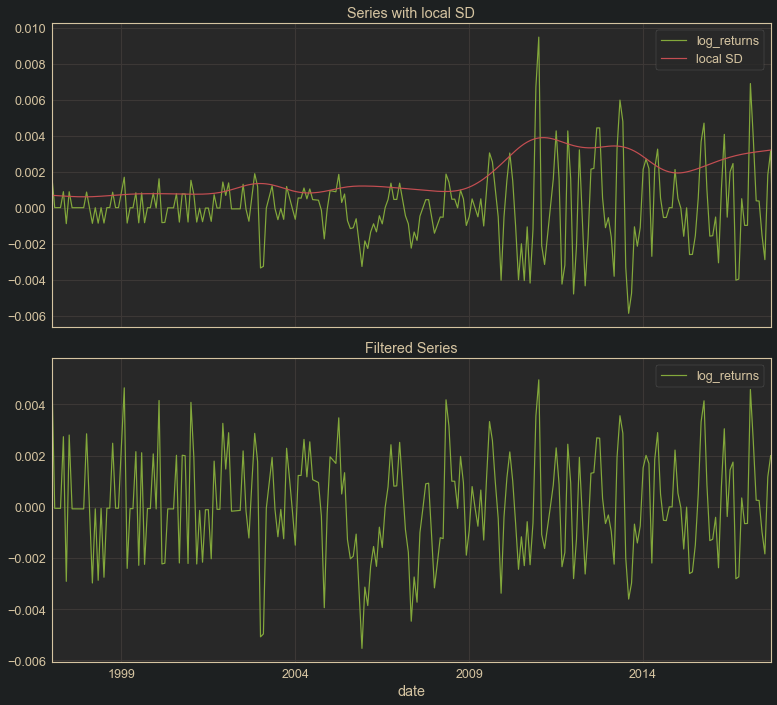

In [456]:
filtered = tsa.so_filter(first_zip_log_returns.diff().dropna(), l=15, visualize=True)

In [462]:
print(r['auto.arima'](r['ts'](FloatVector(filtered), freq=12)))

Series: structure(c(0.00525220078053946, -6.07635643897199e-05, -6.21062390098097e-05,  -6.34589627007144e-05, 0.0027339128476266, -0.00291123651871827,  0.00279933543139262, -8.1214296994001e-05, -8.22373801409738e-05,  -8.30188667185402e-05, -8.35099178502006e-05, -8.36718995802561e-05,  0.00284811415673208, -0.000100595445034585, -0.00297599432502077,  -8.05451628593449e-05, -0.00287054938969181, -6.53008894226029e-05,  -0.00275118418846011, -5.51137532838844e-05, -5.35814491362783e-05,  0.00248004437316778, -5.7115938261416e-05, -5.57216400591639e-05,  0.00234021702562453, 0.0046412403268708, -0.00240545797980012,  -7.44465497480954e-05, -7.32649106438592e-05, 0.00215021015500089,  -0.0022857973189373, 0.0021083750244073, -0.00224808536882236,  -6.96063802198124e-05, -6.93145718710212e-05, 0.00206389899644146,  -8.45692643335362e-05, 0.0041473350945172, -0.00223086972985676,  -0.0022034636747011, -8.36432019275646e-05, -8.35958233575218e-05,  -8.36220571646318e-05, 0.00200935648280

In [464]:
filtered.var()

4.0068893600031764e-06

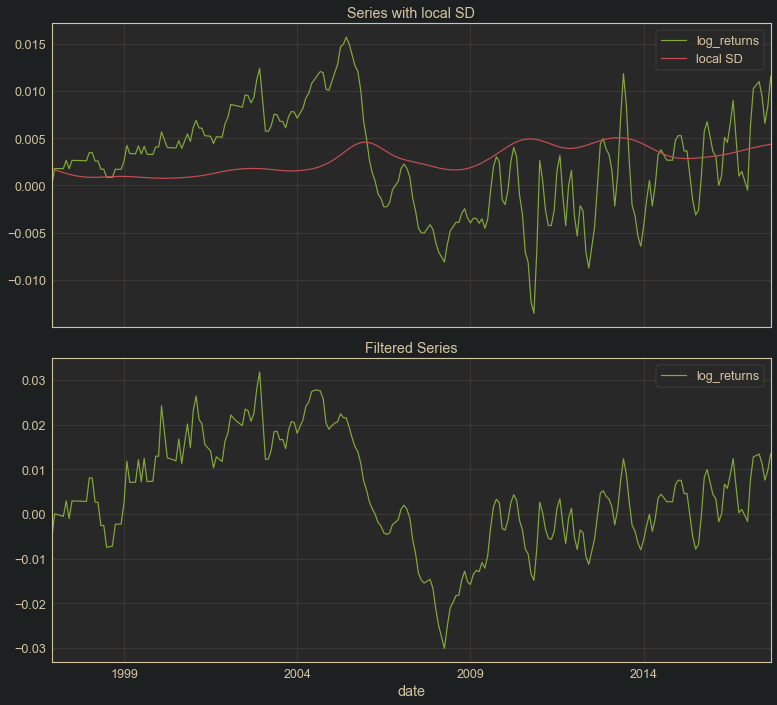

In [480]:
filtered2 = tsa.so_filter(first_zip_log_returns, l=15, visualize=True)

In [481]:
filtered2.diff().var()

1.240265472461465e-05

(4, 0, 0)(2, 0, 1, 12) model with no constant
(3, 1, 1)(0, 0, 2, 12) model with no constant
                                        SARIMAX Results                                        
Dep. Variable:                   first_zip_log_returns   No. Observations:                  264
Model:             SARIMAX(3, 1, 1)x(0, 0, [1, 2], 12)   Log Likelihood                1182.860
Date:                                 Tue, 15 Sep 2020   AIC                          -2351.719
Time:                                         17:14:39   BIC                          -2327.443
Sample:                                     05-01-1996   HQIC                         -2341.934
                                          - 04-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------

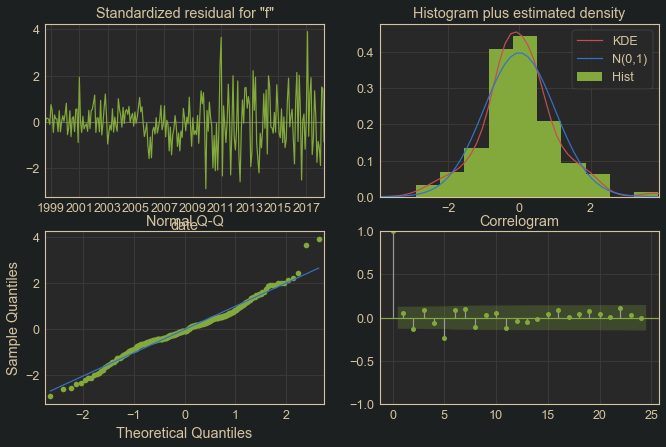

In [486]:
view_zip = groups.get_group(1001).set_index('date').value
view_zip_returns = np.log(view_zip).diff().dropna().asfreq('MS')
view_zip_returns.name = 'first_zip_log_returns'

order, sorder, coeffs_filt, const = tsa.model_from_autoarima(filtered, freq=12)

order, sorder, coeffs, const = tsa.model_from_autoarima(view_zip_returns[:], freq=12)
#coeffs.loc['sigma2'] = coeffs_filt.loc['sigma2']

model = SARIMAX(view_zip_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )
res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

(3, 1, 1)(0, 0, 2, 12) model with no constant
                                        SARIMAX Results                                        
Dep. Variable:                             log_returns   No. Observations:                  264
Model:             SARIMAX(3, 1, 1)x(0, 0, [1, 2], 12)   Log Likelihood                1182.860
Date:                                 Tue, 15 Sep 2020   AIC                          -2351.719
Time:                                         18:25:30   BIC                          -2327.443
Sample:                                     05-01-1996   HQIC                         -2341.934
                                          - 04-01-2018                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.5119      0

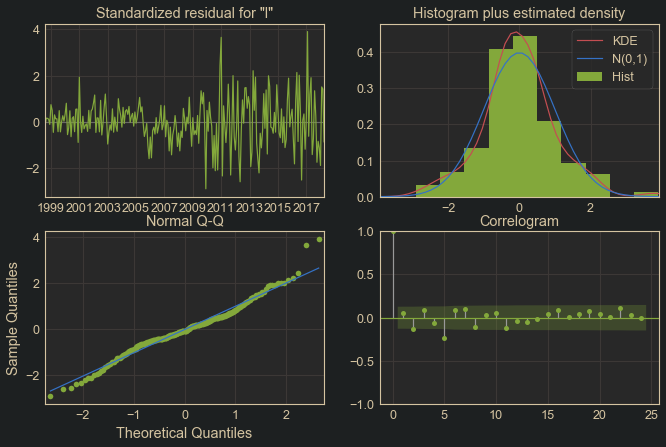

In [489]:
# Workflow for generating orders and parameters, then smoothing a SARIMAX object
order, sorder, coeffs, const = tsa.model_from_autoarima(first_zip_log_returns, 
                                                        freq=12
                                                       )

model = SARIMAX(endog=first_zip_log_returns,
                order=order,
                seasonal_order=sorder,
                enforce_invertibility=False,
                enforce_stationarity=False,
                exog=const
               )

res = model.smooth(coeffs)
print(res.summary())
res.plot_diagnostics();

MSE of fit: 2.6136039145364046e-06


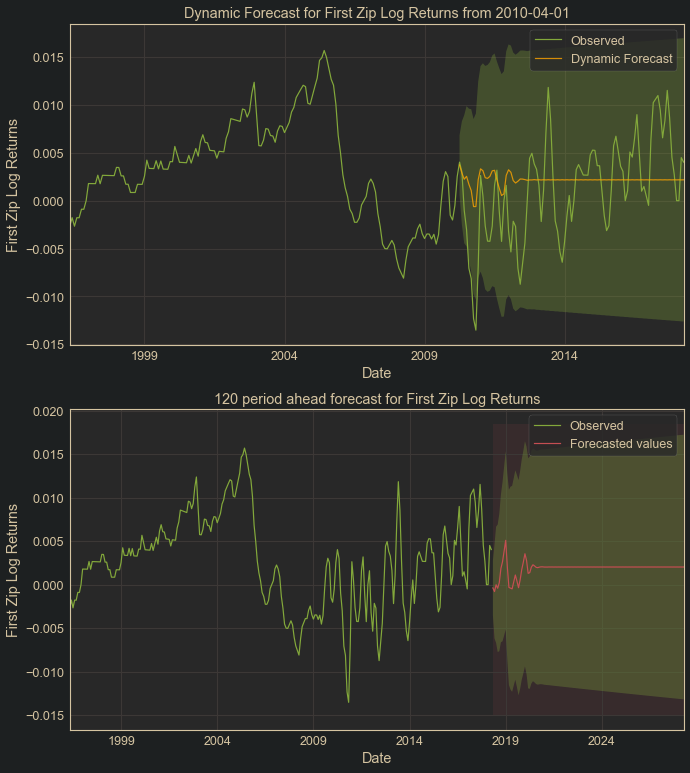

In [487]:
tsa.plot_sarimax_predictions(res, view_zip_returns, periods_ahead=120, dynamic='2010-04-01')